In [1]:
import os
import pandas as pd
import numpy as np
from math import sqrt

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, SpectralClustering
from fcmeans import FCM 
from sklearn.metrics import silhouette_score, silhouette_samples
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import pairwise_distances
from sklearn.metrics import accuracy_score
from collections import Counter
from scipy.io import arff
from scipy.spatial.distance import pdist, squareform

In [2]:
# Đường dẫn tới thư mục BCVI

bcvi_folder = r"D:\HocTap2425\Seminar\Dataset\BCVI"

# Duyệt qua các thư mục (Case1, Case2, ...)
for case_folder in sorted(os.listdir(bcvi_folder)):
    case_path = os.path.join(bcvi_folder, case_folder)
    
    if os.path.isdir(case_path):  # Kiểm tra nếu là thư mục
        # Tạo danh sách lưu file cho từng Case
        case_data = []
        
        # Duyệt qua các thư mục con hoặc file trong từng Case
        for sub_folder_or_file in sorted(os.listdir(case_path)):
            sub_path = os.path.join(case_path, sub_folder_or_file)
            
            if os.path.isfile(sub_path):  # Nếu là file
                if sub_folder_or_file.endswith(".csv"):  # Đọc file CSV
                    df = pd.read_csv(sub_path)
                    case_data.append((sub_folder_or_file, df))
                elif sub_folder_or_file.endswith(".arff"):  # Đọc file ARFF
                    from scipy.io import arff
                    data, meta = arff.loadarff(sub_path)
                    df = pd.DataFrame(data)
                    case_data.append((sub_folder_or_file, df))
            elif os.path.isdir(sub_path):  # Nếu là thư mục con
                for file_name in sorted(os.listdir(sub_path)):
                    file_path = os.path.join(sub_path, file_name)
                    
                    if file_name.endswith(".csv"):  # Đọc file CSV
                        df = pd.read_csv(file_path)
                        case_data.append((file_name, df))
                    elif file_name.endswith(".arff"):  # Đọc file ARFF
                        from scipy.io import arff
                        data, meta = arff.loadarff(file_path)
                        df = pd.DataFrame(data)
                        case_data.append((file_name, df))
        
        # Tạo biến động cho từng Case (vd: case_data_Case1)
        globals()[f"case_data_{case_folder}"] = case_data

# Kiểm tra kết quả
print("Danh sách các biến chứa dữ liệu từng Case:")
for variable in sorted(globals()):
    if variable.startswith("case_data_"):
        print(f"{variable}: {len(globals()[variable])} file")


Danh sách các biến chứa dữ liệu từng Case:
case_data_AI_Datasets: 25 file
case_data_Case1: 5 file
case_data_Case2: 5 file
case_data_Case3: 5 file
case_data_Case4: 5 file
case_data_Case5: 5 file


# Dữ liệu được vẽ với label có sẵn

## Case 1:Tách biệt rõ về số cụm.

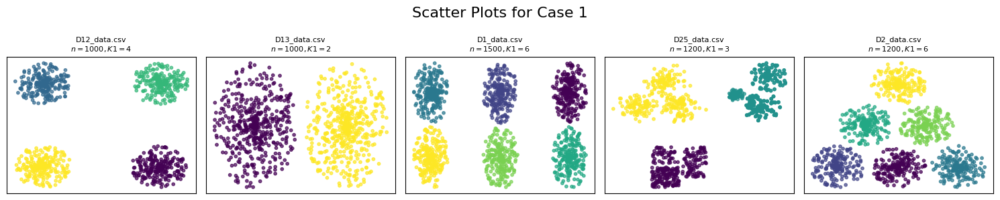

In [4]:
case_name = "Case 1"
case_files = case_data_Case1

num_files = len(case_files)

# Tạo figure với số hàng tương ứng số file
fig, axes = plt.subplots(1, num_files, figsize=(15, 3))  # 1 hàng, nhiều cột
axes = axes.flatten()  # Chuyển thành mảng 1D

# Duyệt từng file trong Case 1 để vẽ biểu đồ
for idx, (file_name, df) in enumerate(case_files):
    ax = axes[idx]
    
    # Kiểm tra cột label và cột số
    if 'label' not in df.columns or len(df.select_dtypes(include=['number']).columns) < 2:
        ax.axis('off')  # Bỏ khung nếu thiếu dữ liệu
        continue
    
    # Chọn cột x, y và label
    x_col, y_col = df.select_dtypes(include=['number']).columns[:2]
    labels = df['label']
    
    # Số lượng điểm dữ liệu và số lượng cụm
    num_data_points = len(df)
    num_clusters = len(labels.unique())
    
    # Vẽ scatter plot
    scatter = ax.scatter(df[x_col], df[y_col], c=labels, cmap='viridis', s=10, alpha=0.7)
    ax.set_xticks([])  # Ẩn trục x
    ax.set_yticks([])  # Ẩn trục y
    
    # Hiển thị tên file, số lượng cụm và số lượng điểm dữ liệu với tiêu đề phụ
    ax.set_title(f"{file_name}\n$n = {num_data_points}, K1 = {num_clusters}$", fontsize=8)

    # Thêm legend nếu cần
    #ax.legend(*scatter.legend_elements(), title="Labels", loc='best', fontsize=8)

# Tạo một title chung cho toàn bộ figure
fig.suptitle(f"Scatter Plots for {case_name}", fontsize=16)

# Hiển thị
plt.tight_layout()
plt.show()


## Case 2: Các cụm này không chồng lấn và có thể phân biệt rõ.

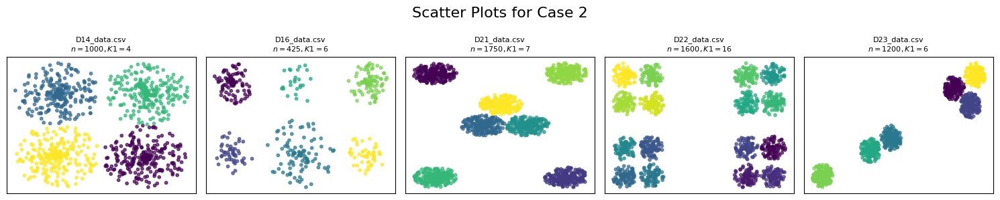

In [4]:
case_name = "Case 2"
case_files = case_data_Case2

num_files = len(case_files)

# Tạo figure với số hàng tương ứng số file
fig, axes = plt.subplots(1, num_files, figsize=(15, 3))  # 1 hàng, nhiều cột
axes = axes.flatten()  # Chuyển thành mảng 1D

# Duyệt từng file trong Case 1 để vẽ biểu đồ
for idx, (file_name, df) in enumerate(case_files):
    ax = axes[idx]
    
    # Kiểm tra cột label và cột số
    if 'label' not in df.columns or len(df.select_dtypes(include=['number']).columns) < 2:
        ax.axis('off')  # Bỏ khung nếu thiếu dữ liệu
        continue
    
    # Chọn cột x, y và label
    x_col, y_col = df.select_dtypes(include=['number']).columns[:2]
    labels = df['label']
    
    # Số lượng điểm dữ liệu và số lượng cụm
    num_data_points = len(df)
    num_clusters = len(labels.unique())
    
    # Vẽ scatter plot
    scatter = ax.scatter(df[x_col], df[y_col], c=labels, cmap='viridis', s=10, alpha=0.7)
    ax.set_xticks([])  # Ẩn trục x
    ax.set_yticks([])  # Ẩn trục y
    
    # Hiển thị tên file, số lượng cụm và số lượng điểm dữ liệu với tiêu đề phụ
    ax.set_title(f"{file_name}\n$n = {num_data_points}, K1 = {num_clusters}$", fontsize=8)

    # Thêm legend nếu cần
    #ax.legend(*scatter.legend_elements(), title="Labels", loc='best', fontsize=8)

# Tạo một title chung cho toàn bộ figure
fig.suptitle(f"Scatter Plots for {case_name}", fontsize=16)

# Hiển thị
plt.tight_layout()
plt.show()


## Case 3: Kích thước và mật độ giữa các cụm khác nhau không đồng đều

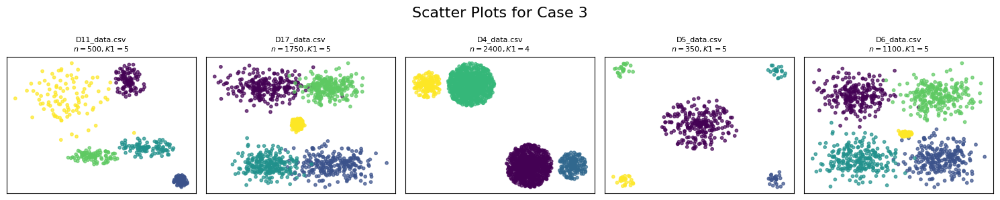

In [5]:
case_name = "Case 3"
case_files = case_data_Case3

num_files = len(case_files)

# Tạo figure với số hàng tương ứng số file
fig, axes = plt.subplots(1, num_files, figsize=(15, 3))  # 1 hàng, nhiều cột
axes = axes.flatten()  # Chuyển thành mảng 1D

# Duyệt từng file trong Case 1 để vẽ biểu đồ
for idx, (file_name, df) in enumerate(case_files):
    ax = axes[idx]
    
    # Kiểm tra cột label và cột số
    if 'label' not in df.columns or len(df.select_dtypes(include=['number']).columns) < 2:
        ax.axis('off')  # Bỏ khung nếu thiếu dữ liệu
        continue
    
    # Chọn cột x, y và label
    x_col, y_col = df.select_dtypes(include=['number']).columns[:2]
    labels = df['label']
    
    # Số lượng điểm dữ liệu và số lượng cụm
    num_data_points = len(df)
    num_clusters = len(labels.unique())
    
    # Vẽ scatter plot
    scatter = ax.scatter(df[x_col], df[y_col], c=labels, cmap='viridis', s=10, alpha=0.7)
    ax.set_xticks([])  # Ẩn trục x
    ax.set_yticks([])  # Ẩn trục y
    
    # Hiển thị tên file, số lượng cụm và số lượng điểm dữ liệu với tiêu đề phụ
    ax.set_title(f"{file_name}\n$n = {num_data_points}, K1 = {num_clusters}$", fontsize=8)

    # Thêm legend nếu cần
    #ax.legend(*scatter.legend_elements(), title="Labels", loc='best', fontsize=8)

# Tạo một title chung cho toàn bộ figure
fig.suptitle(f"Scatter Plots for {case_name}", fontsize=16)

# Hiển thị
plt.tight_layout()
plt.show()


## Case 4: Các cụm có chồng lấn lên nhau

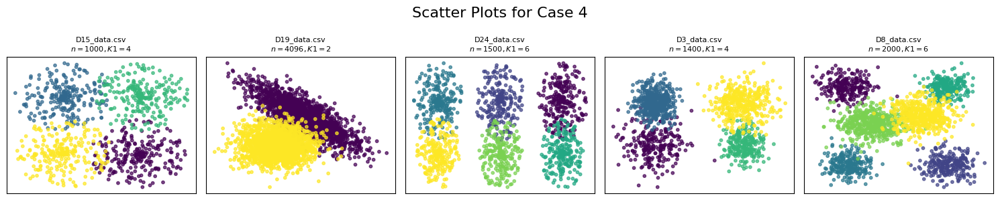

In [6]:
case_name = "Case 4"
case_files = case_data_Case4

num_files = len(case_files)

# Tạo figure với số hàng tương ứng số file
fig, axes = plt.subplots(1, num_files, figsize=(15, 3))  # 1 hàng, nhiều cột
axes = axes.flatten()  # Chuyển thành mảng 1D

# Duyệt từng file trong Case 1 để vẽ biểu đồ
for idx, (file_name, df) in enumerate(case_files):
    ax = axes[idx]
    
    # Kiểm tra cột label và cột số
    if 'label' not in df.columns or len(df.select_dtypes(include=['number']).columns) < 2:
        ax.axis('off')  # Bỏ khung nếu thiếu dữ liệu
        continue
    
    # Chọn cột x, y và label
    x_col, y_col = df.select_dtypes(include=['number']).columns[:2]
    labels = df['label']
    
    # Số lượng điểm dữ liệu và số lượng cụm
    num_data_points = len(df)
    num_clusters = len(labels.unique())
    
    # Vẽ scatter plot
    scatter = ax.scatter(df[x_col], df[y_col], c=labels, cmap='viridis', s=10, alpha=0.7)
    ax.set_xticks([])  # Ẩn trục x
    ax.set_yticks([])  # Ẩn trục y
    
    # Hiển thị tên file, số lượng cụm và số lượng điểm dữ liệu với tiêu đề phụ
    ax.set_title(f"{file_name}\n$n = {num_data_points}, K1 = {num_clusters}$", fontsize=8)

    # Thêm legend nếu cần
    #ax.legend(*scatter.legend_elements(), title="Labels", loc='best', fontsize=8)

# Tạo một title chung cho toàn bộ figure
fig.suptitle(f"Scatter Plots for {case_name}", fontsize=16)

# Hiển thị
plt.tight_layout()
plt.show()


## Case 5: Hình dạng các cụm không cùng một khối

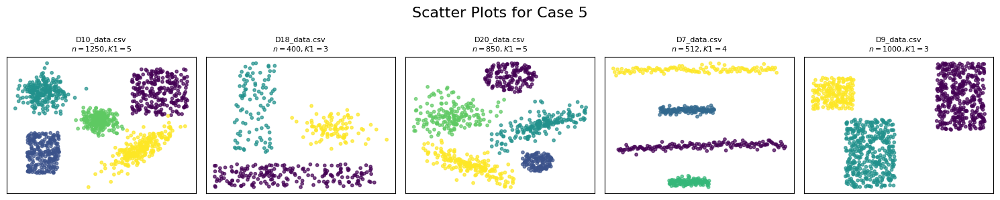

In [7]:
case_name = "Case 5"
case_files = case_data_Case5

num_files = len(case_files)

# Tạo figure với số hàng tương ứng số file
fig, axes = plt.subplots(1, num_files, figsize=(15, 3))  # 1 hàng, nhiều cột
axes = axes.flatten()  # Chuyển thành mảng 1D

# Duyệt từng file trong Case 1 để vẽ biểu đồ
for idx, (file_name, df) in enumerate(case_files):
    ax = axes[idx]
    
    # Kiểm tra cột label và cột số
    if 'label' not in df.columns or len(df.select_dtypes(include=['number']).columns) < 2:
        ax.axis('off')  # Bỏ khung nếu thiếu dữ liệu
        continue
    
    # Chọn cột x, y và label
    x_col, y_col = df.select_dtypes(include=['number']).columns[:2]
    labels = df['label']
    
    # Số lượng điểm dữ liệu và số lượng cụm
    num_data_points = len(df)
    num_clusters = len(labels.unique())
    
    # Vẽ scatter plot
    scatter = ax.scatter(df[x_col], df[y_col], c=labels, cmap='viridis', s=10, alpha=0.7)
    ax.set_xticks([])  # Ẩn trục x
    ax.set_yticks([])  # Ẩn trục y
    
    # Hiển thị tên file, số lượng cụm và số lượng điểm dữ liệu với tiêu đề phụ
    ax.set_title(f"{file_name}\n$n = {num_data_points}, K1 = {num_clusters}$", fontsize=8)

    # Thêm legend nếu cần
    #ax.legend(*scatter.legend_elements(), title="Labels", loc='best', fontsize=8)

# Tạo một title chung cho toàn bộ figure
fig.suptitle(f"Scatter Plots for {case_name}", fontsize=16)

# Hiển thị
plt.tight_layout()
plt.show()


# K-Means 

## Case 1

In [51]:
case_data_Case1 = globals().get("case_data_Case1")


output_result = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1"
os.makedirs(output_result, exist_ok=True)

cluster_choices = [4, 2, 6, 3, 6]

def K_means_Case1(case_data, cluster_choices):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")

        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        n_clusters = cluster_choices[i]

        #K Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        #PCA cho dữ liệu giảm xuống 2 chiều để vẽ hình ảnh
        pca = PCA(n_components=2)
        reduced_data = pca.fit_transform(scaled_data)
        df['x'] = reduced_data[:, 0]
        df['y'] = reduced_data[:, 1]

        #plot
        plt.figure(figsize=(8, 6))
        for cluster in range(n_clusters):
            cluster_data = df[df['Cluster'] == cluster]
            plt.scatter(
                cluster_data['x'],
                cluster_data['y'],
                label = f"Cluster{cluster}"
            )

        #Đánh dấu tâm cụm
        centroids_reduced = pca.transform(Km.cluster_centers_)
        plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s = 200, c = 'black', marker="x", label = "Centroids")

        plt.title(f"Phân cụm K-Means cho {file_name} (k={n_clusters})")
        plt.xlabel("x")
        plt.ylabel("y")

        visualization_path = os.path.join(output_result, f"Cluster_{file_name}.png")
        plt.savefig(visualization_path)
        plt.close()
        
        print(f"Đã lưu hình ảnh phân cụm vào: {output_result}")
        output_path = os.path.join(output_result, f"Clustered_{file_name}")
        df.to_csv(output_path, index=False)
        print(f"Đã lưu kêt quả vào: {output_path}")




In [52]:
K_means_Case1(case_data_Case1, cluster_choices)

Dang xu ly file!!!: D12_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1\Clustered_D12_data.csv
Dang xu ly file!!!: D13_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1\Clustered_D13_data.csv
Dang xu ly file!!!: D1_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1\Clustered_D1_data.csv
Dang xu ly file!!!: D25_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case1\Clustered_D25_data.csv
Dang xu ly file!!!

In [53]:
def calculate_accuracy_with_clusters(case_data, cluster_choices):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        n_clusters = cluster_choices[i]

        # K-Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        print(f"Số cụm: {n_clusters}")
        
        # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
        cluster_to_label = {}
        for cluster in range(n_clusters):
            # Lấy các chỉ số của các điểm trong cụm
            cluster_indices = np.where(df['Cluster'] == cluster)[0]
            # Tìm nhãn phổ biến nhất trong cụm bằng cách đếm
            cluster_true_labels = labels.iloc[cluster_indices]
            label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
            most_common_label = label_counts.most_common(1)[0][0]  # Lấy nhãn xuất hiện nhiều nhất
            cluster_to_label[cluster] = most_common_label

            # In ra thông tin về nhãn trong cụm
            print(f"Cụm {cluster}: Nhãn phổ biến nhất là {most_common_label}, Số lượng nhãn: {label_counts}")

        # Gán nhãn dự đoán cho các điểm
        predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

        # Tính độ chính xác
        accuracy = accuracy_score(labels, predicted_labels)
        accuracies.append(accuracy)

        print(f"Độ chính xác cho {file_name}: {accuracy:.4f}")

    # In kết quả tổng thể
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy

# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định
accuracies, avg_accuracy = calculate_accuracy_with_clusters(case_data_Case1, cluster_choices)


Dang xu ly file!!!: D12_data.csv
Số cụm: 4
Cụm 0: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 170, 3: 70})
Cụm 1: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 250})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 250})
Cụm 3: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 180, 2: 80})
Độ chính xác cho D12_data.csv: 0.8500
Dang xu ly file!!!: D13_data.csv
Số cụm: 2
Cụm 0: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 500})
Cụm 1: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 500})
Độ chính xác cho D13_data.csv: 1.0000
Dang xu ly file!!!: D1_data.csv
Số cụm: 6
Cụm 0: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 250})
Cụm 1: Nhãn phổ biến nhất là 5, Số lượng nhãn: Counter({5: 250})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 250})
Cụm 3: Nhãn phổ biến nhất là 6, Số lượng nhãn: Counter({6: 250})
Cụm 4: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 250})
Cụm 5: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 250})
Độ

## Case 2

In [54]:
case_data_Case2 = globals().get("case_data_Case2")


output_result = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2"
os.makedirs(output_result, exist_ok=True)

cluster_choices = [4, 6, 7, 16, 6]

def K_means_Case2(case_data, cluster_choices):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")

        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        n_clusters = cluster_choices[i]

        #K Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        #PCA cho dữ liệu giảm xuống 2 chiều để vẽ hình ảnh
        pca = PCA(n_components=2)
        reduced_data = pca.fit_transform(scaled_data)
        df['PCA1'] = reduced_data[:, 0]
        df['PCA2'] = reduced_data[:, 1]

        #plot
        plt.figure(figsize=(8, 6))
        for cluster in range(n_clusters):
            cluster_data = df[df['Cluster'] == cluster]
            plt.scatter(
                cluster_data['PCA1'],
                cluster_data['PCA2'],
                label = f"Cluster{cluster}"
            )

        #Đánh dấu tâm cụm
        centroids_reduced = pca.transform(Km.cluster_centers_)
        plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s = 200, c = 'black', marker="x", label = "Centroids")

        plt.title(f"Phân cụm K-Means cho {file_name} (k={n_clusters})")
        plt.xlabel("PCA1")
        plt.ylabel("PCA2")

        visualization_path = os.path.join(output_result, f"Cluster_{file_name}.png")
        plt.savefig(visualization_path)
        plt.close()
        
        print(f"Đã lưu hình ảnh phân cụm vào: {output_result}")
        output_path = os.path.join(output_result, f"Clustered_{file_name}")
        df.to_csv(output_path, index=False)
        print(f"Đã lưu kêt quả vào: {output_path}")




In [55]:
K_means_Case2(case_data_Case2, cluster_choices)

Dang xu ly file!!!: D14_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2\Clustered_D14_data.csv
Dang xu ly file!!!: D16_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2\Clustered_D16_data.csv
Dang xu ly file!!!: D21_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2\Clustered_D21_data.csv
Dang xu ly file!!!: D22_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case2\Clustered_D22_data.csv
Dang xu ly file!

In [56]:
def calculate_accuracy_with_clusters(case_data, cluster_choices):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        n_clusters = cluster_choices[i]

        # K-Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        print(f"Số cụm: {n_clusters}")
        
        # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
        cluster_to_label = {}
        for cluster in range(n_clusters):
            # Lấy các chỉ số của các điểm trong cụm
            cluster_indices = np.where(df['Cluster'] == cluster)[0]
            # Tìm nhãn phổ biến nhất trong cụm bằng cách đếm
            cluster_true_labels = labels.iloc[cluster_indices]
            label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
            most_common_label = label_counts.most_common(1)[0][0]  # Lấy nhãn xuất hiện nhiều nhất
            cluster_to_label[cluster] = most_common_label

            # In ra thông tin về nhãn trong cụm
            print(f"Cụm {cluster}: Nhãn phổ biến nhất là {most_common_label}, Số lượng nhãn: {label_counts}")

        # Gán nhãn dự đoán cho các điểm
        predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

        # Tính độ chính xác
        accuracy = accuracy_score(labels, predicted_labels)
        accuracies.append(accuracy)

        print(f"Độ chính xác cho {file_name}: {accuracy:.4f}")

    # In kết quả tổng thể
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy

# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định
accuracies, avg_accuracy = calculate_accuracy_with_clusters(case_data_Case2, cluster_choices)

Dang xu ly file!!!: D14_data.csv
Số cụm: 4
Cụm 0: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 250})
Cụm 1: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 250})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 250})
Cụm 3: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 250})
Độ chính xác cho D14_data.csv: 1.0000
Dang xu ly file!!!: D16_data.csv
Số cụm: 6
Cụm 0: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 100})
Cụm 1: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 25})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 100})
Cụm 3: Nhãn phổ biến nhất là 6, Số lượng nhãn: Counter({6: 50})
Cụm 4: Nhãn phổ biến nhất là 5, Số lượng nhãn: Counter({5: 100})
Cụm 5: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 50})
Độ chính xác cho D16_data.csv: 1.0000
Dang xu ly file!!!: D21_data.csv
Số cụm: 7
Cụm 0: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 250})
Cụm 1: Nhãn phổ biến nhất là 7, Số lượng nhãn: Counter({7: 250})
Cụm 2: Nhãn phổ bi

## Case 3

In [57]:
case_data_Case3 = globals().get("case_data_Case3")


output_result = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3"
os.makedirs(output_result, exist_ok=True)

cluster_choices = [5, 5, 4, 5, 5]

def K_means_Case3(case_data, cluster_choices):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")

        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        n_clusters = cluster_choices[i]

        #K Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        #PCA cho dữ liệu giảm xuống 2 chiều để vẽ hình ảnh
        pca = PCA(n_components=2)
        reduced_data = pca.fit_transform(scaled_data)
        df['PCA1'] = reduced_data[:, 0]
        df['PCA2'] = reduced_data[:, 1]

        #plot
        plt.figure(figsize=(8, 6))
        for cluster in range(n_clusters):
            cluster_data = df[df['Cluster'] == cluster]
            plt.scatter(
                cluster_data['PCA1'],
                cluster_data['PCA2'],
                label = f"Cluster{cluster}"
            )

        #Đánh dấu tâm cụm
        centroids_reduced = pca.transform(Km.cluster_centers_)
        plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s = 200, c = 'black', marker="x", label = "Centroids")

        plt.title(f"Phân cụm K-Means cho {file_name} (k={n_clusters})")
        plt.xlabel("PCA1")
        plt.ylabel("PCA2")

        visualization_path = os.path.join(output_result, f"Cluster_{file_name}.png")
        plt.savefig(visualization_path)
        plt.close()
        
        print(f"Đã lưu hình ảnh phân cụm vào: {output_result}")
        output_path = os.path.join(output_result, f"Clustered_{file_name}")
        df.to_csv(output_path, index=False)
        print(f"Đã lưu kêt quả vào: {output_path}")




In [58]:
K_means_Case3(case_data_Case3, cluster_choices)

Dang xu ly file!!!: D11_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3\Clustered_D11_data.csv
Dang xu ly file!!!: D17_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3\Clustered_D17_data.csv
Dang xu ly file!!!: D4_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3\Clustered_D4_data.csv
Dang xu ly file!!!: D5_data.csv
Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3
Đã lưu kêt quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case3\Clustered_D5_data.csv
Dang xu ly file!!!: 

In [59]:
def calculate_accuracy_with_clusters(case_data, cluster_choices):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        n_clusters = cluster_choices[i]

        # K-Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        print(f"Số cụm: {n_clusters}")
        
        # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
        cluster_to_label = {}
        for cluster in range(n_clusters):
            # Lấy các chỉ số của các điểm trong cụm
            cluster_indices = np.where(df['Cluster'] == cluster)[0]
            # Tìm nhãn phổ biến nhất trong cụm bằng cách đếm
            cluster_true_labels = labels.iloc[cluster_indices]
            label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
            most_common_label = label_counts.most_common(1)[0][0]  # Lấy nhãn xuất hiện nhiều nhất
            cluster_to_label[cluster] = most_common_label

            # In ra thông tin về nhãn trong cụm
            print(f"Cụm {cluster}: Nhãn phổ biến nhất là {most_common_label}, Số lượng nhãn: {label_counts}")

        # Gán nhãn dự đoán cho các điểm
        predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

        # Tính độ chính xác
        accuracy = accuracy_score(labels, predicted_labels)
        accuracies.append(accuracy)

        print(f"Độ chính xác cho {file_name}: {accuracy:.4f}")

    # In kết quả tổng thể
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy

# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định
accuracies, avg_accuracy = calculate_accuracy_with_clusters(case_data_Case3, cluster_choices)

Dang xu ly file!!!: D11_data.csv
Số cụm: 5
Cụm 0: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 100, 3: 83})
Cụm 1: Nhãn phổ biến nhất là 5, Số lượng nhãn: Counter({5: 52})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 100})
Cụm 3: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 100, 3: 17, 5: 2})
Cụm 4: Nhãn phổ biến nhất là 5, Số lượng nhãn: Counter({5: 46})
Độ chính xác cho D11_data.csv: 0.7960
Dang xu ly file!!!: D17_data.csv
Số cụm: 5
Cụm 0: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 248, 2: 20})
Cụm 1: Nhãn phổ biến nhất là 5, Số lượng nhãn: Counter({5: 750})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 246})
Cụm 3: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 250, 1: 4})
Cụm 4: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 230, 3: 2})
Độ chính xác cho D17_data.csv: 0.9851
Dang xu ly file!!!: D4_data.csv
Số cụm: 4
Cụm 0: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 371})
Cụm 1: Nhãn phổ biến nhất là 3, Số lượng nhã

## Case 4

In [60]:
case_data_Case4 = globals().get("case_data_Case4")


output_result = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case4"
os.makedirs(output_result, exist_ok=True)

cluster_choices = [4, 2, 6, 4, 6]

def K_means_Case4(case_data, cluster_choices):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")

        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        n_clusters = cluster_choices[i]

        #K Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        #PCA cho dữ liệu giảm xuống 2 chiều để vẽ hình ảnh
        pca = PCA(n_components=2)
        reduced_data = pca.fit_transform(scaled_data)
        df['PCA1'] = reduced_data[:, 0]
        df['PCA2'] = reduced_data[:, 1]

        #plot
        plt.figure(figsize=(8, 6))
        for cluster in range(n_clusters):
            cluster_data = df[df['Cluster'] == cluster]
            plt.scatter(
                cluster_data['PCA1'],
                cluster_data['PCA2'],
                label = f"Cluster{cluster}"
            )

        #Đánh dấu tâm cụm
        centroids_reduced = pca.transform(Km.cluster_centers_)
        plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s = 200, c = 'black', marker="x", label = "Centroids")

        plt.title(f"Phân cụm K-Means cho {file_name} (k={n_clusters})")
        plt.xlabel("PCA1")
        plt.ylabel("PCA2")

        visualization_path = os.path.join(output_result, f"Cluster_{file_name}.png")
        plt.savefig(visualization_path)
        plt.close()
        
        print(f"Đã lưu hình ảnh phân cụm vào: {output_result}")
        output_path = os.path.join(output_result, f"Clustered_{file_name}")
        df.to_csv(output_path, index=False)
        print(f"Đã lưu kêt quả vào: {output_path}")




In [ ]:
K_means_Case4(case_data_Case4, cluster_choices)

In [62]:
def calculate_accuracy_with_clusters(case_data, cluster_choices):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        n_clusters = cluster_choices[i]

        # K-Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        print(f"Số cụm: {n_clusters}")
        
        # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
        cluster_to_label = {}
        for cluster in range(n_clusters):
            # Lấy các chỉ số của các điểm trong cụm
            cluster_indices = np.where(df['Cluster'] == cluster)[0]
            # Tìm nhãn phổ biến nhất trong cụm bằng cách đếm
            cluster_true_labels = labels.iloc[cluster_indices]
            label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
            most_common_label = label_counts.most_common(1)[0][0]  # Lấy nhãn xuất hiện nhiều nhất
            cluster_to_label[cluster] = most_common_label

            # In ra thông tin về nhãn trong cụm
            print(f"Cụm {cluster}: Nhãn phổ biến nhất là {most_common_label}, Số lượng nhãn: {label_counts}")

        # Gán nhãn dự đoán cho các điểm
        predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

        # Tính độ chính xác
        accuracy = accuracy_score(labels, predicted_labels)
        accuracies.append(accuracy)

        print(f"Độ chính xác cho {file_name}: {accuracy:.4f}")

    # In kết quả tổng thể
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy

# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định
accuracies, avg_accuracy = calculate_accuracy_with_clusters(case_data_Case4, cluster_choices)

Dang xu ly file!!!: D15_data.csv
Số cụm: 4
Cụm 0: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 235, 3: 12, 4: 2})
Cụm 1: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 238, 2: 13, 1: 1})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 249})
Cụm 3: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 248, 2: 2})
Độ chính xác cho D15_data.csv: 0.9700
Dang xu ly file!!!: D19_data.csv
Số cụm: 2
Cụm 0: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 2046, 2: 44})
Cụm 1: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 2004, 1: 2})
Độ chính xác cho D19_data.csv: 0.9888
Dang xu ly file!!!: D24_data.csv
Số cụm: 6
Cụm 0: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 246, 6: 1})
Cụm 1: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 250, 1: 6})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 244})
Cụm 3: Nhãn phổ biến nhất là 6, Số lượng nhãn: Counter({6: 249, 3: 4})
Cụm 4: Nhãn phổ biến nhất là 5, Số lượng nhãn: Counter({5: 250, 2: 7})
Cụm 5: Nh

## Case 5

In [63]:
case_data_Case5 = globals().get("case_data_Case5")


output_result = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_KMeans\Case5"
os.makedirs(output_result, exist_ok=True)

cluster_choices = [5, 3, 5, 4, 3]

def K_means_Case5(case_data, cluster_choices):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")

        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        n_clusters = cluster_choices[i]

        #K Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        #PCA cho dữ liệu giảm xuống 2 chiều để vẽ hình ảnh
        pca = PCA(n_components=2)
        reduced_data = pca.fit_transform(scaled_data)
        df['PCA1'] = reduced_data[:, 0]
        df['PCA2'] = reduced_data[:, 1]

        #plot
        plt.figure(figsize=(8, 6))
        for cluster in range(n_clusters):
            cluster_data = df[df['Cluster'] == cluster]
            plt.scatter(
                cluster_data['PCA1'],
                cluster_data['PCA2'],
                label = f"Cluster{cluster}"
            )

        #Đánh dấu tâm cụm
        centroids_reduced = pca.transform(Km.cluster_centers_)
        plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s = 200, c = 'black', marker="x", label = "Centroids")

        plt.title(f"Phân cụm K-Means cho {file_name} (k={n_clusters})")
        plt.xlabel("PCA1")
        plt.ylabel("PCA2")

        visualization_path = os.path.join(output_result, f"Cluster_{file_name}.png")
        plt.savefig(visualization_path)
        plt.close()
        
        print(f"Đã lưu hình ảnh phân cụm vào: {output_result}")
        output_path = os.path.join(output_result, f"Clustered_{file_name}")
        df.to_csv(output_path, index=False)
        print(f"Đã lưu kêt quả vào: {output_path}")




In [ ]:
K_means_Case5(case_data_Case5, cluster_choices)

In [65]:
def calculate_accuracy_with_clusters(case_data, cluster_choices):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file!!!: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        n_clusters = cluster_choices[i]

        # K-Means
        Km = KMeans(n_clusters=n_clusters, random_state=42)
        df["Cluster"] = Km.fit_predict(scaled_data)

        print(f"Số cụm: {n_clusters}")
        
        # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
        cluster_to_label = {}
        for cluster in range(n_clusters):
            # Lấy các chỉ số của các điểm trong cụm
            cluster_indices = np.where(df['Cluster'] == cluster)[0]
            # Tìm nhãn phổ biến nhất trong cụm bằng cách đếm
            cluster_true_labels = labels.iloc[cluster_indices]
            label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
            most_common_label = label_counts.most_common(1)[0][0]  # Lấy nhãn xuất hiện nhiều nhất
            cluster_to_label[cluster] = most_common_label

            # In ra thông tin về nhãn trong cụm
            print(f"Cụm {cluster}: Nhãn phổ biến nhất là {most_common_label}, Số lượng nhãn: {label_counts}")

        # Gán nhãn dự đoán cho các điểm
        predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

        # Tính độ chính xác
        accuracy = accuracy_score(labels, predicted_labels)
        accuracies.append(accuracy)

        print(f"Độ chính xác cho {file_name}: {accuracy:.4f}")

    # In kết quả tổng thể
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy

# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định
accuracies, avg_accuracy = calculate_accuracy_with_clusters(case_data_Case5, cluster_choices)

Dang xu ly file!!!: D10_data.csv
Số cụm: 5
Cụm 0: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 250})
Cụm 1: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 250})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 250})
Cụm 3: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 250})
Cụm 4: Nhãn phổ biến nhất là 5, Số lượng nhãn: Counter({5: 250})
Độ chính xác cho D10_data.csv: 1.0000
Dang xu ly file!!!: D18_data.csv
Số cụm: 3
Cụm 0: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 118, 2: 24})
Cụm 1: Nhãn phổ biến nhất là 3, Số lượng nhãn: Counter({3: 97, 2: 76})
Cụm 2: Nhãn phổ biến nhất là 1, Số lượng nhãn: Counter({1: 82, 3: 3})
Độ chính xác cho D18_data.csv: 0.7425
Dang xu ly file!!!: D20_data.csv
Số cụm: 5
Cụm 0: Nhãn phổ biến nhất là 4, Số lượng nhãn: Counter({4: 190, 2: 4})
Cụm 1: Nhãn phổ biến nhất là 0, Số lượng nhãn: Counter({0: 150, 3: 1})
Cụm 2: Nhãn phổ biến nhất là 2, Số lượng nhãn: Counter({2: 189})
Cụm 3: Nhãn phổ biến nhất là 3, Số lượng nhãn: Cou

# Bảng đánh giá độ chính xác của phương pháp phân cụm K-means và nhãn dữ liệu

### Case 1

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc</th>
      <th>cluster</th>
      <th>label</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D12</td>
      <td>0.8500</td>
      <td>4</td>
      <td>2-3, 4, 1, 3-2</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D13</td>
      <td>1.0000</td>
      <td>2</td>
      <td>2</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D1</td>
      <td>1.0000</td>
      <td>6</td>
      <td>6</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D25</td>
      <td>1.0000</td>
      <td>3</td>
      <td>3</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D2</td>
      <td>1.0000</td>
      <td>6</td>
      <td>6</td>
    </tr>
  </tbody>
</table>


### Case 2

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc</th>
      <th>cluster</th>
      <th>label</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D14</td>
      <td>1.0000</td>
      <td>4</td>
      <td>4</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D16</td>
      <td>1.0000</td>
      <td>6</td>
      <td>6</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D21</td>
      <td>1.0000</td>
      <td>7</td>
      <td>7</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D22</td>
      <td>1.0000</td>
      <td>16</td>
      <td>16</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D23</td>
      <td>1.0000</td>
      <td>6</td>
      <td>6</td>
    </tr>
  </tbody>
</table>


### Case 3

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc</th>
      <th>cluster</th>
      <th>label</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D11</td>
      <td>0.7960</td>
      <td>5</td>
      <td>2-3, 5, 1, 4-3-5, 5</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D17</td>
      <td>0.9851</td>
      <td>5</td>
      <td>3-2, 5, 1, 4-1, 2-3</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D4</td>
      <td>0.9167</td>
      <td>4</td>
      <td>1, 3-4, 1, 2</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D5</td>
      <td>1.0000</td>
      <td>5</td>
      <td>5</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D6</td>
      <td>0.9855</td>
      <td>5</td>
      <td>2-3, 4, 1-3, 3-2, 5-4-2</td>
    </tr>
  </tbody>
</table>


### Case 4

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc</th>
      <th>cluster</th>
      <th>label</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D15</td>
      <td>0.9700</td>
      <td>4</td>
      <td>2-3-4, 3-2-1, 1, 4-2</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D19</td>
      <td>0.9888</td>
      <td>2</td>
      <td>1-2, 2-1</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D24</td>
      <td>0.9880</td>
      <td>6</td>
      <td>3-6, 4-1, 1, 6-3, 5-2, 2</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D3</td>
      <td>0.9614</td>
      <td>4</td>
      <td>2-1, 4-3, 1-2, 3-4-1</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D8</td>
      <td>0.9635</td>
      <td>6</td>
      <td>3-5, 5-6, 1-5, 4-6, 6-5-4, 2-6</td>
    </tr>
  </tbody>
</table>


### Case 5

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc</th>
      <th>cluster</th>
      <th>label</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D10</td>
      <td>1.0000</td>
      <td>5</td>
      <td>5</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D18</td>
      <td>0.7425</td>
      <td>3</td>
      <td>1-2, 3-2, 1-3</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D20</td>
      <td>0.9788</td>
      <td>5</td>
      <td>4-2, 0-3, 2, 3-4, 1-2</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D7</td>
      <td>0.5957</td>
      <td>4</td>
      <td>3, 1-2-0, 3, 0</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D9</td>
      <td>1.0000</td>
      <td>3</td>
      <td>3</td>
    </tr>
  </tbody>
</table>


# FCM

## Case 1

In [3]:
case_data_Case1 = globals().get("case_data_Case1", [])

#Tạo thư mục để lưu kết quả nếu cần
output_result_FCM = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1"
os.makedirs(output_result_FCM, exist_ok= True)

#Danh sách số cụm theo thứ tự file
cluster_choices = [4, 2, 6, 3, 6]

def FCM_Case1(case_data, cluster_choices, m_values):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")

        #Chuan hoa du lieu
        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        #lay so cum tu danh sach
        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            #run FCM
            fcm = FCM(n_clusters=num_clusters, m = m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            proportions = membership_matrix.max(axis= 0)

            #Giam chieu cua du lieu xuong thanh 2
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["PCA1"] = reduced_data[:, 0]
            df["PCA2"] = reduced_data[:, 1]

            plt.figure(figsize=(8,6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label =f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:,0], centroids_reduced[:, 1], s = 200, c = 'black', marker='X', label = 'Centroids')


            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("PCA1")
            plt.ylabel("PCA2")
            plt.legend()
            
            # Lưu hình ảnh
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")            


In [4]:
m_values = [1.5, 2, 4]

FCM_Case1(case_data_Case1, cluster_choices, m_values)

Dang xu ly file: D12_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Cluster_D12_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Clustered_D12_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Cluster_D12_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Clustered_D12_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Cluster_D12_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Clustered_D12_data.csv_m_4.csv
Dang xu ly file: D13_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:

### Acc

In [5]:
# Hàm tính độ chính xác cho FCM
def calculate_accuracy_fcm(case_data, cluster_choices, m_values):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            # FCM
            fcm = FCM(n_clusters=num_clusters, m=m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
            cluster_to_label = {}
            for cluster in range(num_clusters):
                cluster_indices = np.where(df['Cluster'] == cluster)[0]
                cluster_true_labels = labels.iloc[cluster_indices]
                label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
                most_common_label = label_counts.most_common(1)[0][0]
                cluster_to_label[cluster] = most_common_label

            # Gán nhãn dự đoán cho các điểm
            predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

            # Tính độ chính xác
            accuracy = accuracy_score(labels, predicted_labels)
            accuracies.append(accuracy)

            print(f"Độ chính xác cho {file_name} với m={m}: {accuracy:.4f}")
            
            # Vẽ PCA cho phân cụm FCM (để trực quan hóa)
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["x"] = reduced_data[:, 0]
            df["y"] = reduced_data[:, 1]

            plt.figure(figsize=(8, 6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['x'], cluster_data['y'], label=f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s=200, c='black', marker='X', label='Centroids')

            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("x")
            plt.ylabel("y")
            plt.legend()

            # Lưu hình ảnh phân cụm
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file CSV
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")

    # Tính độ chính xác trung bình cho tất cả các file và giá trị m
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình cho tất cả các file và m: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy


# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định, và m_values là danh sách các giá trị m cho FCM
m_values = [1.5, 2.0, 4]  # Các giá trị m khác nhau trong Fuzzy C-Means
accuracies, avg_accuracy = calculate_accuracy_fcm(case_data_Case1, cluster_choices, m_values)


Dang xu ly file: D12_data.csv
Đang chạy thuật toán FCM với m = 1.5
Độ chính xác cho D12_data.csv với m=1.5: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Cluster_D12_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Clustered_D12_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2.0
Độ chính xác cho D12_data.csv với m=2.0: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Cluster_D12_data.csv_m_2.0.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Clustered_D12_data.csv_m_2.0.csv
Đang chạy thuật toán FCM với m = 4
Độ chính xác cho D12_data.csv với m=4: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case1\Cluster_D12_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Res

## Case 2

In [6]:
case_data_Case2 = globals().get("case_data_Case2", [])

#Tạo thư mục để lưu kết quả nếu cần
output_result_FCM = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2"
os.makedirs(output_result_FCM, exist_ok= True)

#Danh sách số cụm theo thứ tự file
cluster_choices =  [4, 6, 7, 16, 6]

def FCM_Case2(case_data, cluster_choices, m_values):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")

        #Chuan hoa du lieu
        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        #lay so cum tu danh sach
        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            #run FCM
            fcm = FCM(n_clusters=num_clusters, m = m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            proportions = membership_matrix.max(axis= 0)

            #Giam chieu cua du lieu xuong thanh 2
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["PCA1"] = reduced_data[:, 0]
            df["PCA2"] = reduced_data[:, 1]

            plt.figure(figsize=(8,6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label =f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:,0], centroids_reduced[:, 1], s = 200, c = 'black', marker='X', label = 'Centroids')


            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("PCA1")
            plt.ylabel("PCA2")
            plt.legend()
            
            # Lưu hình ảnh
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")            


In [7]:
m_values = [1.5, 2, 4]

FCM_Case2(case_data_Case2, cluster_choices, m_values)

Dang xu ly file: D14_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Cluster_D14_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Clustered_D14_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Cluster_D14_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Clustered_D14_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Cluster_D14_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Clustered_D14_data.csv_m_4.csv
Dang xu ly file: D16_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:

### Acc

In [8]:
# Hàm tính độ chính xác cho FCM
def calculate_accuracy_fcm(case_data, cluster_choices, m_values):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            # FCM
            fcm = FCM(n_clusters=num_clusters, m=m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
            cluster_to_label = {}
            for cluster in range(num_clusters):
                cluster_indices = np.where(df['Cluster'] == cluster)[0]
                cluster_true_labels = labels.iloc[cluster_indices]
                label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
                most_common_label = label_counts.most_common(1)[0][0]
                cluster_to_label[cluster] = most_common_label

            # Gán nhãn dự đoán cho các điểm
            predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

            # Tính độ chính xác
            accuracy = accuracy_score(labels, predicted_labels)
            accuracies.append(accuracy)

            print(f"Độ chính xác cho {file_name} với m={m}: {accuracy:.4f}")
            
            # Vẽ PCA cho phân cụm FCM (để trực quan hóa)
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["x"] = reduced_data[:, 0]
            df["y"] = reduced_data[:, 1]

            plt.figure(figsize=(8, 6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['x'], cluster_data['y'], label=f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s=200, c='black', marker='X', label='Centroids')

            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("x")
            plt.ylabel("y")
            plt.legend()

            # Lưu hình ảnh phân cụm
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file CSV
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")

    # Tính độ chính xác trung bình cho tất cả các file và giá trị m
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình cho tất cả các file và m: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy


# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định, và m_values là danh sách các giá trị m cho FCM
m_values = [1.5, 2, 4]  # Các giá trị m khác nhau trong Fuzzy C-Means
accuracies, avg_accuracy = calculate_accuracy_fcm(case_data_Case2, cluster_choices, m_values)


Dang xu ly file: D14_data.csv
Đang chạy thuật toán FCM với m = 1.5
Độ chính xác cho D14_data.csv với m=1.5: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Cluster_D14_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Clustered_D14_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
Độ chính xác cho D14_data.csv với m=2: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Cluster_D14_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Clustered_D14_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
Độ chính xác cho D14_data.csv với m=4: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case2\Cluster_D14_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\

## Case 3

In [9]:
case_data_Case3 = globals().get("case_data_Case3", [])

#Tạo thư mục để lưu kết quả nếu cần
output_result_FCM = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3"
os.makedirs(output_result_FCM, exist_ok= True)

#Danh sách số cụm theo thứ tự file
cluster_choices =  [5, 5, 4, 5, 5]

def FCM_Case3(case_data, cluster_choices, m_values):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")

        #Chuan hoa du lieu
        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        #lay so cum tu danh sach
        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            #run FCM
            fcm = FCM(n_clusters=num_clusters, m = m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            proportions = membership_matrix.max(axis= 0)

            #Giam chieu cua du lieu xuong thanh 2
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["PCA1"] = reduced_data[:, 0]
            df["PCA2"] = reduced_data[:, 1]

            plt.figure(figsize=(8,6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label =f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:,0], centroids_reduced[:, 1], s = 200, c = 'black', marker='X', label = 'Centroids')


            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("PCA1")
            plt.ylabel("PCA2")
            plt.legend()
            
            # Lưu hình ảnh
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")            


In [10]:
m_values = [1.5, 2, 4]

FCM_Case3(case_data_Case3, cluster_choices, m_values)

Dang xu ly file: D11_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Cluster_D11_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Clustered_D11_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Cluster_D11_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Clustered_D11_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Cluster_D11_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Clustered_D11_data.csv_m_4.csv
Dang xu ly file: D17_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:

### Acc

In [11]:
# Hàm tính độ chính xác cho FCM
def calculate_accuracy_fcm(case_data, cluster_choices, m_values):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            # FCM
            fcm = FCM(n_clusters=num_clusters, m=m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
            cluster_to_label = {}
            for cluster in range(num_clusters):
                cluster_indices = np.where(df['Cluster'] == cluster)[0]
                cluster_true_labels = labels.iloc[cluster_indices]
                label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
                most_common_label = label_counts.most_common(1)[0][0]
                cluster_to_label[cluster] = most_common_label

            # Gán nhãn dự đoán cho các điểm
            predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

            # Tính độ chính xác
            accuracy = accuracy_score(labels, predicted_labels)
            accuracies.append(accuracy)

            print(f"Độ chính xác cho {file_name} với m={m}: {accuracy:.4f}")
            
            # Vẽ PCA cho phân cụm FCM (để trực quan hóa)
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["x"] = reduced_data[:, 0]
            df["y"] = reduced_data[:, 1]

            plt.figure(figsize=(8, 6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['x'], cluster_data['y'], label=f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s=200, c='black', marker='X', label='Centroids')

            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("x")
            plt.ylabel("y")
            plt.legend()

            # Lưu hình ảnh phân cụm
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file CSV
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")

    # Tính độ chính xác trung bình cho tất cả các file và giá trị m
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình cho tất cả các file và m: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy


# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định, và m_values là danh sách các giá trị m cho FCM
m_values = [1.5, 2.0, 4]  # Các giá trị m khác nhau trong Fuzzy C-Means
accuracies, avg_accuracy = calculate_accuracy_fcm(case_data_Case3, cluster_choices, m_values)


Dang xu ly file: D11_data.csv
Đang chạy thuật toán FCM với m = 1.5
Độ chính xác cho D11_data.csv với m=1.5: 0.7920
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Cluster_D11_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Clustered_D11_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2.0
Độ chính xác cho D11_data.csv với m=2.0: 0.9920
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Cluster_D11_data.csv_m_2.0.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Clustered_D11_data.csv_m_2.0.csv
Đang chạy thuật toán FCM với m = 4
Độ chính xác cho D11_data.csv với m=4: 0.9920
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case3\Cluster_D11_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Res

## Case 4

In [12]:
case_data_Case4 = globals().get("case_data_Case4", [])

#Tạo thư mục để lưu kết quả nếu cần
output_result_FCM = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4"
os.makedirs(output_result_FCM, exist_ok= True)

#Danh sách số cụm theo thứ tự file
cluster_choices =  [4, 2, 6, 4, 6]

def FCM_Case4(case_data, cluster_choices, m_values):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")

        #Chuan hoa du lieu
        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        #lay so cum tu danh sach
        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            #run FCM
            fcm = FCM(n_clusters=num_clusters, m = m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            proportions = membership_matrix.max(axis= 0)

            #Giam chieu cua du lieu xuong thanh 2
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["PCA1"] = reduced_data[:, 0]
            df["PCA2"] = reduced_data[:, 1]

            plt.figure(figsize=(8,6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label =f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:,0], centroids_reduced[:, 1], s = 200, c = 'black', marker='X', label = 'Centroids')


            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("PCA1")
            plt.ylabel("PCA2")
            plt.legend()
            
            # Lưu hình ảnh
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")            


In [13]:
m_values = [1.5, 2, 4]

FCM_Case4(case_data_Case4, cluster_choices, m_values)

Dang xu ly file: D15_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Cluster_D15_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Clustered_D15_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Cluster_D15_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Clustered_D15_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Cluster_D15_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Clustered_D15_data.csv_m_4.csv
Dang xu ly file: D19_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:

### Acc

In [14]:
# Hàm tính độ chính xác cho FCM
def calculate_accuracy_fcm(case_data, cluster_choices, m_values):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            # FCM
            fcm = FCM(n_clusters=num_clusters, m=m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
            cluster_to_label = {}
            for cluster in range(num_clusters):
                cluster_indices = np.where(df['Cluster'] == cluster)[0]
                cluster_true_labels = labels.iloc[cluster_indices]
                label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
                most_common_label = label_counts.most_common(1)[0][0]
                cluster_to_label[cluster] = most_common_label

            # Gán nhãn dự đoán cho các điểm
            predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

            # Tính độ chính xác
            accuracy = accuracy_score(labels, predicted_labels)
            accuracies.append(accuracy)

            print(f"Độ chính xác cho {file_name} với m={m}: {accuracy:.4f}")
            
            # Vẽ PCA cho phân cụm FCM (để trực quan hóa)
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["x"] = reduced_data[:, 0]
            df["y"] = reduced_data[:, 1]

            plt.figure(figsize=(8, 6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['x'], cluster_data['y'], label=f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s=200, c='black', marker='X', label='Centroids')

            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("x")
            plt.ylabel("y")
            plt.legend()

            # Lưu hình ảnh phân cụm
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file CSV
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")

    # Tính độ chính xác trung bình cho tất cả các file và giá trị m
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình cho tất cả các file và m: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy


# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định, và m_values là danh sách các giá trị m cho FCM
m_values = [1.5, 2, 4]  # Các giá trị m khác nhau trong Fuzzy C-Means
accuracies, avg_accuracy = calculate_accuracy_fcm(case_data_Case4, cluster_choices, m_values)


Dang xu ly file: D15_data.csv
Đang chạy thuật toán FCM với m = 1.5
Độ chính xác cho D15_data.csv với m=1.5: 0.9960
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Cluster_D15_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Clustered_D15_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
Độ chính xác cho D15_data.csv với m=2: 0.9960
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Cluster_D15_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Clustered_D15_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
Độ chính xác cho D15_data.csv với m=4: 0.9960
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case4\Cluster_D15_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\

## Case 5

In [15]:
case_data_Case5 = globals().get("case_data_Case5", [])

#Tạo thư mục để lưu kết quả nếu cần
output_result_FCM = r"D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5"
os.makedirs(output_result_FCM, exist_ok= True)

#Danh sách số cụm theo thứ tự file
cluster_choices =  [5, 3, 5, 4, 3]

def FCM_Case5 (case_data, cluster_choices, m_values):
    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")

        #Chuan hoa du lieu
        scaler = StandardScaler()
        numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(df[numeric_columns])

        #lay so cum tu danh sach
        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            #run FCM
            fcm = FCM(n_clusters=num_clusters, m = m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            proportions = membership_matrix.max(axis= 0)

            #Giam chieu cua du lieu xuong thanh 2
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["PCA1"] = reduced_data[:, 0]
            df["PCA2"] = reduced_data[:, 1]

            plt.figure(figsize=(8,6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label =f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:,0], centroids_reduced[:, 1], s = 200, c = 'black', marker='X', label = 'Centroids')


            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("PCA1")
            plt.ylabel("PCA2")
            plt.legend()
            
            # Lưu hình ảnh
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")            


In [16]:
m_values = [1.5, 2, 4]

FCM_Case5(case_data_Case5, cluster_choices, m_values)

Dang xu ly file: D10_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Cluster_D10_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Clustered_D10_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Cluster_D10_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Clustered_D10_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Cluster_D10_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Clustered_D10_data.csv_m_4.csv
Dang xu ly file: D18_data.csv
Đang chạy thuật toán FCM với m = 1.5
    Đã lưu hình ảnh phân cụm vào: D:

### Acc

In [17]:
# Hàm tính độ chính xác cho FCM
def calculate_accuracy_fcm(case_data, cluster_choices, m_values):
    accuracies = []

    for i, (file_name, df) in enumerate(case_data):
        print(f"Dang xu ly file: {file_name}")
        
        # Tách nhãn và dữ liệu
        labels = df['label']  # Giả sử cột nhãn là 'label'
        data = df.drop(columns=['label'])  # Xóa cột nhãn để chỉ còn dữ liệu

        scaler = StandardScaler()
        numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
        scaled_data = scaler.fit_transform(data[numeric_columns])

        num_clusters = cluster_choices[i]

        for m in m_values:
            print(f"Đang chạy thuật toán FCM với m = {m}")

            # FCM
            fcm = FCM(n_clusters=num_clusters, m=m, random_state=42)
            fcm.fit(scaled_data)
            membership_matrix = fcm.u
            cluster_labels = fcm.predict(scaled_data)
            df['Cluster'] = cluster_labels

            # Gán nhãn cho các cụm bằng cách đếm nhãn trong mỗi cụm
            cluster_to_label = {}
            for cluster in range(num_clusters):
                cluster_indices = np.where(df['Cluster'] == cluster)[0]
                cluster_true_labels = labels.iloc[cluster_indices]
                label_counts = Counter(cluster_true_labels)  # Đếm tần suất các nhãn
                most_common_label = label_counts.most_common(1)[0][0]
                cluster_to_label[cluster] = most_common_label

            # Gán nhãn dự đoán cho các điểm
            predicted_labels = [cluster_to_label[cluster] for cluster in df['Cluster']]

            # Tính độ chính xác
            accuracy = accuracy_score(labels, predicted_labels)
            accuracies.append(accuracy)

            print(f"Độ chính xác cho {file_name} với m={m}: {accuracy:.4f}")
            
            # Vẽ PCA cho phân cụm FCM (để trực quan hóa)
            pca = PCA(n_components=2)
            reduced_data = pca.fit_transform(scaled_data)
            df["x"] = reduced_data[:, 0]
            df["y"] = reduced_data[:, 1]

            plt.figure(figsize=(8, 6))
            for cluster in range(num_clusters):
                cluster_data = df[df['Cluster'] == cluster]
                plt.scatter(cluster_data['x'], cluster_data['y'], label=f"Cluster {cluster}")
            
            centroids_reduced = pca.transform(fcm.centers)
            plt.scatter(centroids_reduced[:, 0], centroids_reduced[:, 1], s=200, c='black', marker='X', label='Centroids')

            plt.title(f"Phân cụm Fuzzy C-Means cho {file_name} (k={num_clusters}, m={m})")
            plt.xlabel("x")
            plt.ylabel("y")
            plt.legend()

            # Lưu hình ảnh phân cụm
            visualization_path = os.path.join(output_result_FCM, f"Cluster_{file_name}_m_{m}.png")
            plt.savefig(visualization_path)
            plt.close()
            print(f"    Đã lưu hình ảnh phân cụm vào: {visualization_path}")

            # Lưu kết quả vào file CSV
            output_path = os.path.join(output_result_FCM, f"Clustered_{file_name}_m_{m}.csv")
            df.to_csv(output_path, index=False)
            print(f"    Đã lưu kết quả vào: {output_path}")

    # Tính độ chính xác trung bình cho tất cả các file và giá trị m
    avg_accuracy = np.mean(accuracies)
    print(f"Độ chính xác trung bình cho tất cả các file và m: {avg_accuracy:.4f}")
    
    return accuracies, avg_accuracy


# Giả sử 'case_data_Case1' và 'cluster_choices' đã được xác định, và m_values là danh sách các giá trị m cho FCM
m_values = [1.5, 2, 4]  # Các giá trị m khác nhau trong Fuzzy C-Means
accuracies, avg_accuracy = calculate_accuracy_fcm(case_data_Case5, cluster_choices, m_values)


Dang xu ly file: D10_data.csv
Đang chạy thuật toán FCM với m = 1.5
Độ chính xác cho D10_data.csv với m=1.5: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Cluster_D10_data.csv_m_1.5.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Clustered_D10_data.csv_m_1.5.csv
Đang chạy thuật toán FCM với m = 2
Độ chính xác cho D10_data.csv với m=2: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Cluster_D10_data.csv_m_2.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Clustered_D10_data.csv_m_2.csv
Đang chạy thuật toán FCM với m = 4
Độ chính xác cho D10_data.csv với m=4: 1.0000
    Đã lưu hình ảnh phân cụm vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\Case5\Cluster_D10_data.csv_m_4.png
    Đã lưu kết quả vào: D:\HocTap2425\Seminar\Dataset\Artificial Datasets\Result_FCM\

# Bảng đánh giá độ chính xác của phương pháp phân cụm Fuzzy C-means và nhãn dữ liệu

### Case 1

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc (m=1.5)</th>
      <th>Acc (m=2)</th>
      <th>Acc (m=4)</th>
      <th>cluster</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D12</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>4</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D13</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>2</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D1</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>6</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D25</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>3</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D2</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>6</td>
    </tr>
  </tbody>
</table>


### Case 2

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc (m=1.5)</th>
      <th>Acc (m=2)</th>
      <th>Acc (m=4)</th>
      <th>cluster</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D14</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>4</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D16</td>
      <td>0.9506</td>
      <td>0.9647</td>
      <td>0.9412</td>
      <td>6</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D21</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>1.000</td>
      <td>7</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D22</td>
      <td>0.7913</td>
      <td>0.8538</td>
      <td>0.8556</td>
      <td>16</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D23</td>
      <td>0.8333</td>
      <td>0.8333</td>
      <td>0.1000</td>
      <td>6</td>
    </tr>
  </tbody>
</table>


### Case 3

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc (m=1.5)</th>
      <th>Acc (m=2)</th>
      <th>Acc (m=4)</th>
      <th>cluster</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D11</td>
      <td>0.7920</td>
      <td>0.9920</td>
      <td>0.9920</td>
      <td>5</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D17</td>
      <td>0.85650</td>
      <td>0.8560</td>
      <td>0.9891</td>
      <td>5</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D4</td>
      <td>1.0000</td>
      <td>1.0000</td>
      <td>0.8333</td>
      <td>4</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D5</td>
      <td>0.9286</td>
      <td>0.8517</td>
      <td>0.7886</td>
      <td>5</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D6</td>
      <td>0.9082</td>
      <td>0.9982</td>
      <td>0.9991</td>
      <td>5</td>
    </tr>
  </tbody>
</table>


### Case 4

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc (m=1.5)</th>
      <th>Acc (m=2)</th>
      <th>Acc (m=4)</th>
      <th>cluster</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D15</td>
      <td>0.9960</td>
      <td>0.9960</td>
      <td>0.9960</td>
      <td>4</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D19</td>
      <td>0.9995</td>
      <td>0.9995</td>
      <td>0.9995</td>
      <td>2</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D24</td>
      <td>0.8133</td>
      <td>0.9907</td>
      <td>0.9913</td>
      <td>6</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D3</td>
      <td>0.9779</td>
      <td>0.9779</td>
      <td>0.9821</td>
      <td>4</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D8</td>
      <td>0.9860</td>
      <td>0.9860</td>
      <td>0.6430</td>
      <td>6</td>
    </tr>
  </tbody>
</table>


### Case 5

<table border="1">
  <thead>
    <tr>
      <th>stt</th>
      <th>Datasets</th>
      <th>Acc (m=1.5)</th>
      <th>Acc (m=2)</th>
      <th>Acc (m=4)</th>
      <th>cluster</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>1</td>
      <td>D10</td>
      <td>1.0000</td>
      <td>1.0000</td>
      <td>1.0000</td>
      <td>5</td>
    </tr>
    <tr>
      <td>2</td>
      <td>D18</td>
      <td>0.9875</td>
      <td>0.9700</td>
      <td>0.9700</td>
      <td>3</td>
    </tr>
    <tr>
      <td>3</td>
      <td>D20</td>
      <td>0.9859</td>
      <td>0.9847</td>
      <td>0.9859</td>
      <td>5</td>
    </tr>
    <tr>
      <td>4</td>
      <td>D7</td>
      <td>0.7656</td>
      <td>0.6387</td>
      <td>0.6504</td>
      <td>4</td>
    </tr>
    <tr>
      <td>5</td>
      <td>D9</td>
      <td>1.0000</td>
      <td>1.0000</td>
      <td>1.0000</td>
      <td>3</td>
    </tr>
  </tbody>
</table>


# Index BCVI

In [2]:
# Kịch bản alpha tùy chỉnh cho dataset Artificial
alpha1_AI = np.array([20, 20, 20, 5, 5, 5, 0.5, 0.5, 0.5]) #Độ ưu tiên cho các cụm đầu tiên và giảm dần về sau - Cụm 2, 3, 4 có độ ưu tiên cao nhất
alpha2_AI = np.array([0.5, 0.5, 0.5, 5, 5, 5, 20, 20, 20]) #Độ ưu tiên cho các cụm cuối cùng và tăng dần về sau - Cụm 8, 9, 10 có độ ưu tiên cao nhất
alpha3_AI = np.array([5, 5, 5, 20, 20, 20, 0.5, 0.5, 0.5]) #Độ ưu tiên cho các cụm giữa và cụm đầu với cụm cuối là ngẫu nhiên - Cụm 5, 6, 7 có độ ưu tiên cao nhất

#Kịch bản alpha tùy chỉnh cho dataset Real- World
alpha1_RW = np.array([25, 25, 2, 2, 0.5, 0.5, 0.5, 0.5, 0.5]) #Độ ưu tiên cho các cụm đầu tiên và giảm dần về sau - Cụm 2, 3, 4 có độ ưu tiên cao nhất
alpha2_RW = np.array([0.5, 0.5, 2, 2, 25, 25, 25, 25, 25]) #Độ ưu tiên cho các cụm cuối cùng và tăng dần về sau - Cụm 8, 9, 10 có độ ưu tiên cao nhất
alpha3_RW = np.array([2, 2, 25, 25, 0.5, 0.5, 0.5, 0.5, 0.5]) #Độ ưu tiên cho các cụm giữa và cụm đầu với cụm cuối là ngẫu nhiên - Cụm 5, 6, 7 có độ ưu tiên cao nhất


## Method Hard clustering

### CH_Index

#### Index

In [20]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

def B_CH_IDX(data, kmax, alpha=None, mult_alpha=0.5, method="kmeans", nstart=20):
    """
    Bayesian Clustering Validity Index (B-CH Index) Implementation with default or custom alpha.
    
    Parameters:
        data (numpy.ndarray): Input data as a 2D array or pandas DataFrame.
        kmax (int): Maximum number of clusters.
        alpha (list or None): Custom alpha values, one for each cluster count from 2 to kmax. Default is None.
        mult_alpha (float): Multiplicative factor for alpha adjustment.
        method (str): Clustering method ("kmeans" is supported).
        nstart (int): Number of initializations for clustering.
    
    Returns:
        dict: Contains BCVI, adjusted alpha, and the CH index.
    """
    if method != "kmeans":
        raise ValueError("Only 'kmeans' method is supported in this implementation.")
    
    kmin = 2  # Minimum number of clusters
    if alpha is None:
        # Default alpha: a constant value of 1 for all k
        alpha = [1] * (kmax - kmin + 1)
    if len(alpha) != (kmax - kmin + 1):
        raise ValueError("Length of alpha must match the range kmin to kmax.")
    
    # Standardize the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)
    
    n = data_scaled.shape[0]
    adj_alpha = np.array(alpha) * (n ** mult_alpha)
    
    # Initialize variables
    ch_indices = []
    
    for k in range(kmin, kmax + 1):
        best_model = None
        best_inertia = np.inf
        
        # Run KMeans clustering with multiple starts
        for _ in range(nstart):
            kmeans = KMeans(n_clusters=k, n_init=1, max_iter=300, random_state=None)
            kmeans.fit(data_scaled)
            if kmeans.inertia_ < best_inertia:
                best_inertia = kmeans.inertia_
                best_model = kmeans
        
        # Compute CH index (inertia-based)
        cluster_centers = best_model.cluster_centers_
        labels = best_model.labels_
        
        # Inter-cluster separation (Sep)
        cluster_sizes = np.bincount(labels)
        max_sep = 0
        for cluster_idx in range(k):
            cluster_data = data_scaled[labels == cluster_idx]
            nn_outside_cluster = np.sum([
                np.sum(np.linalg.norm(data_scaled - point, axis=1)) - 
                np.sum(np.linalg.norm(cluster_data - point, axis=1))
                for point in cluster_data
            ])
            sep_k = nn_outside_cluster / cluster_sizes[cluster_idx]
            max_sep = max(max_sep, sep_k)
        
        # Intra-cluster compactness (Com)
        compactness = 0
        for cluster_idx in range(k):
            cluster_data = data_scaled[labels == cluster_idx]
            if len(cluster_data) > 1:
                compactness += np.sum(cdist(cluster_data, cluster_data).flatten()) / (len(cluster_data) * (len(cluster_data) - 1))
        
        # Combine Sep and Com into CH index
        ch_index = max_sep + compactness
        ch_indices.append(ch_index)
    
    # Normalize CH indices and compute BCVI
    ch_indices = np.array(ch_indices)
    ch_min = np.min(ch_indices)
    rk = (ch_indices - ch_min) / np.sum(ch_indices - ch_min)
    nrk = n * rk
    ex = (adj_alpha + nrk) / (np.sum(adj_alpha) + n)
    var = ((adj_alpha + nrk) * (np.sum(adj_alpha) + n - adj_alpha - nrk)) / (
        (np.sum(adj_alpha) + n) ** 2 * (np.sum(adj_alpha) + n + 1)
    )
    
    
    # Prepare results
    result = {
        "BCVI": pd.DataFrame({"k": range(kmin, kmax + 1), "BCVI": ex}),
        "VarBCVI": pd.DataFrame({"k": range(kmin, kmax + 1), "Variance": var}),
        "CH_Index": pd.DataFrame({"k": range(kmin, kmax + 1), "CH_Index": ch_indices})
    }
    
    return result


#### Plot_CH_25files

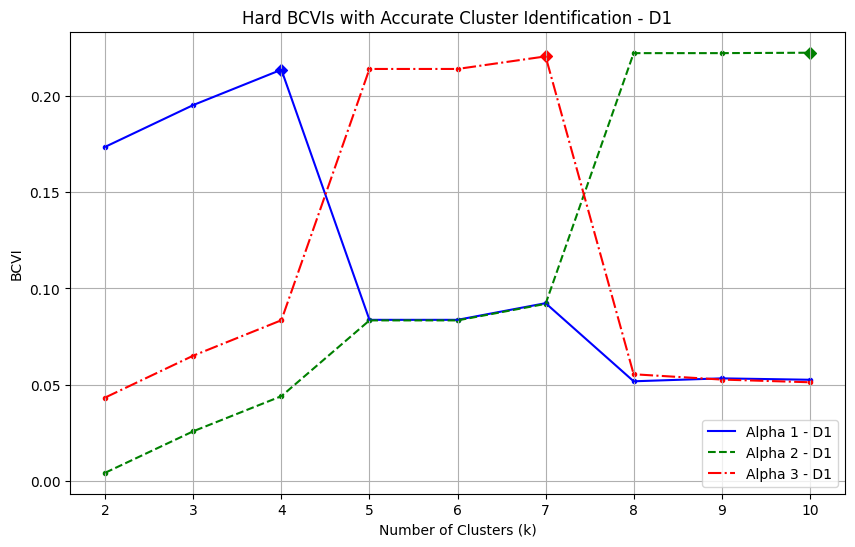

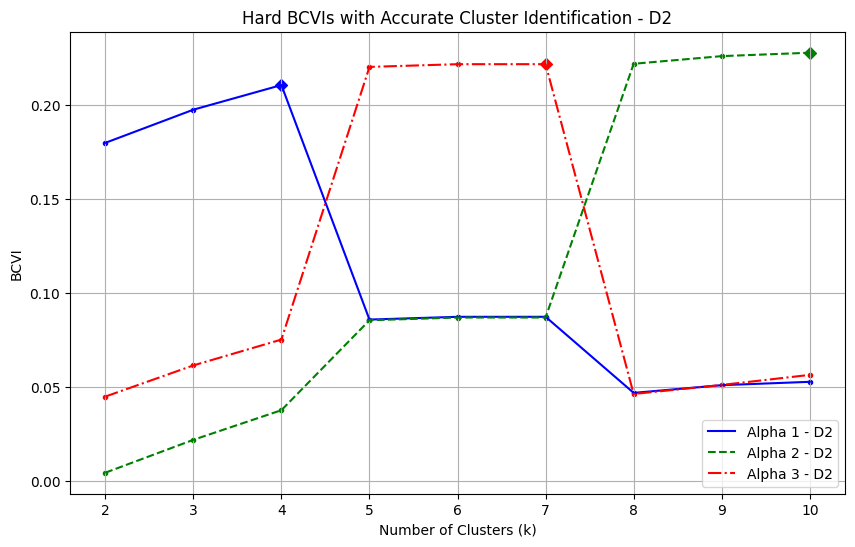

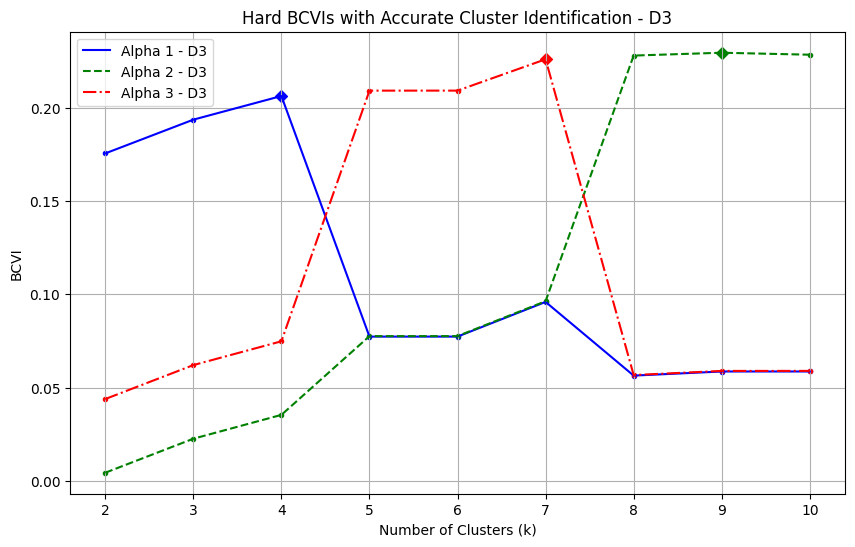

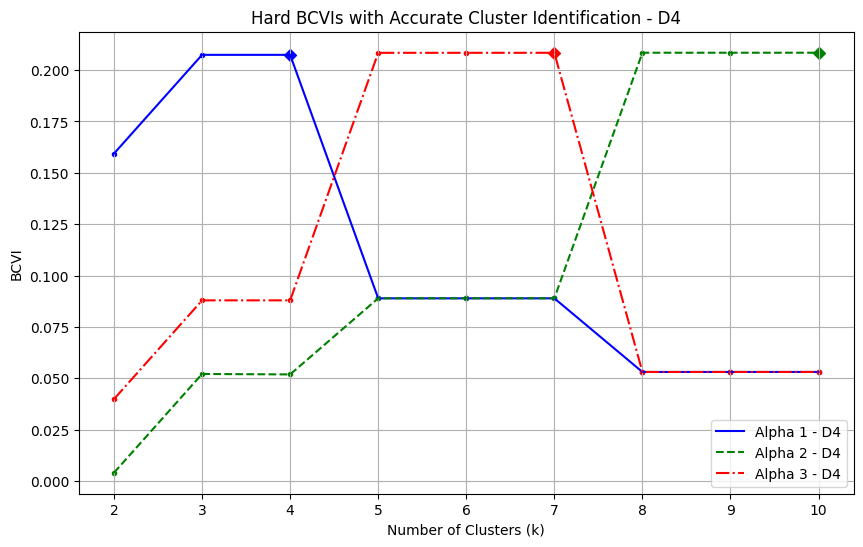

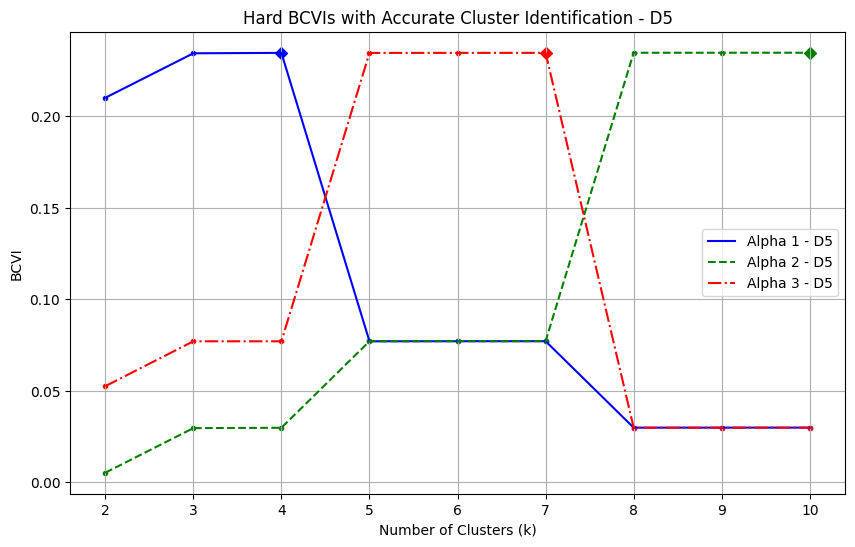

...

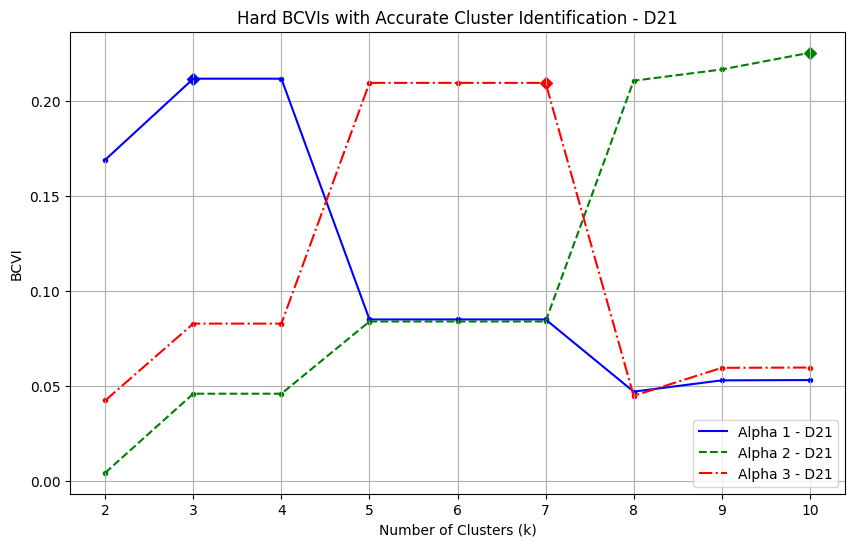

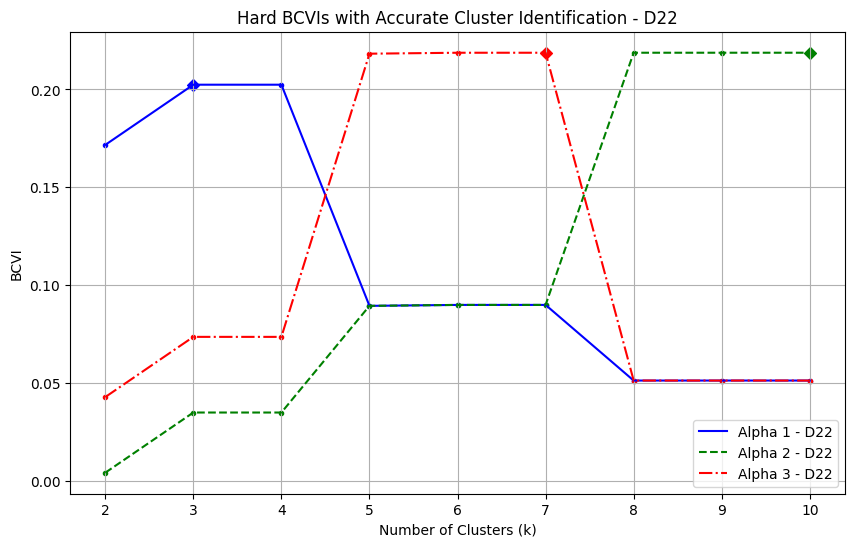

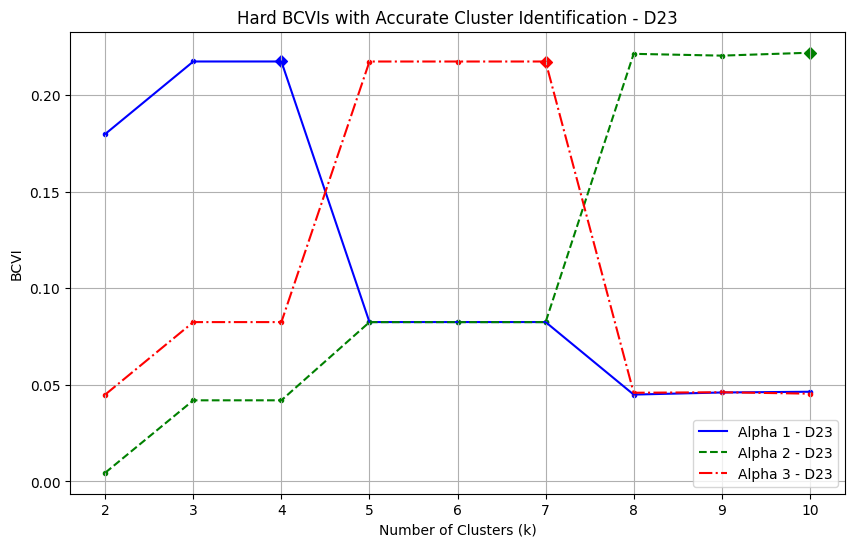

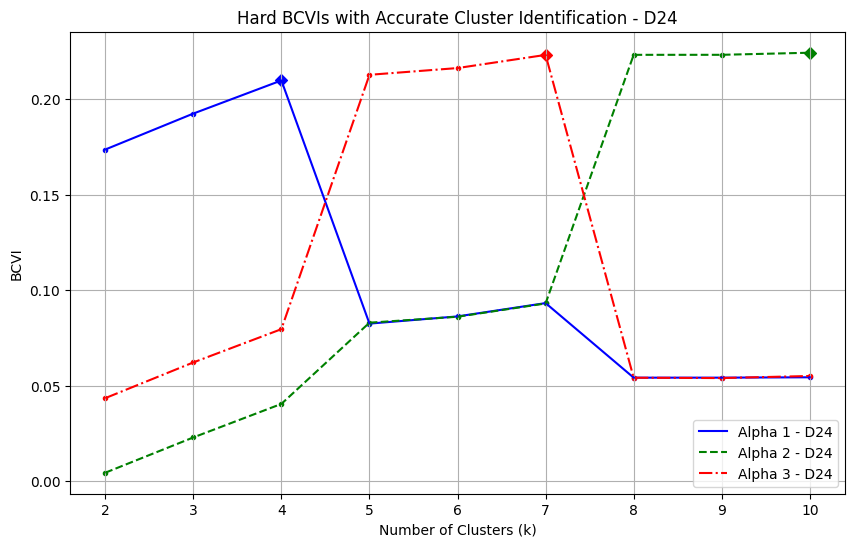

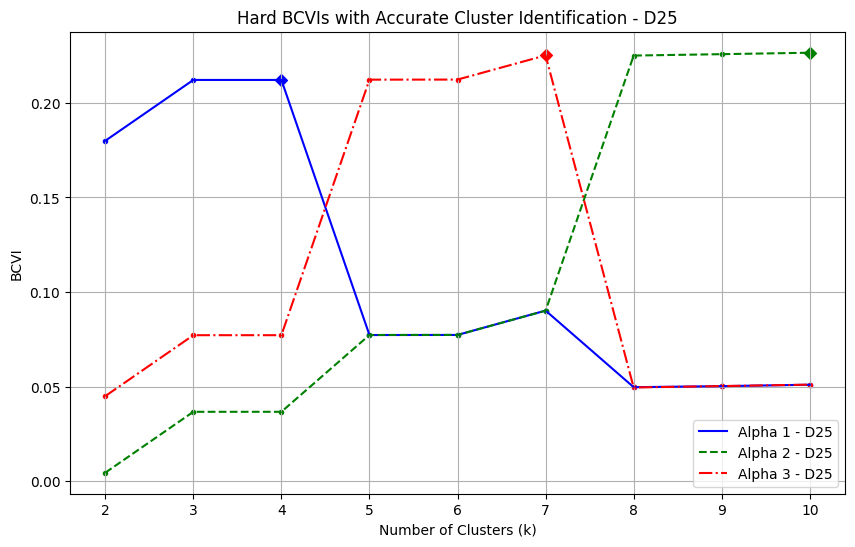

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Thực hiện vòng lặp từ 1 đến 25
for i in range(1, 26):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/AI_Datasets/D{i}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha3["BCVI"].set_index("k", inplace=True)
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Số cụm labels thực tế (true cluster count)
    true_cluster_count = 6  # Thay số này bằng số cụm thực tế

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    plt.figure(figsize=(10, 6))

    # Vẽ các đường BCVI
    plt.plot(BCVIs1.index, BCVIs1["BCVI"], label=f"Alpha 1 - D{i}", color='b', linestyle='-')
    plt.plot(BCVIs2.index, BCVIs2["BCVI"], label=f"Alpha 2 - D{i}", color='g', linestyle='--')
    plt.plot(BCVIs3.index, BCVIs3["BCVI"], label=f"Alpha 3 - D{i}", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        # Alpha 1
        if k == max_k1:  # Nếu k là max đối với Alpha 1
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        else:
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker='.', label=None)

        # Alpha 2
        if k == max_k2:  # Nếu k là max đối với Alpha 2
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        else:
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker='.', label=None)

        # Alpha 3
        if k == max_k3:  # Nếu k là max đối với Alpha 3
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)
        else:
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker='.', label=None)

    # Thêm tiêu đề và nhãn trục
    plt.title(f"Hard BCVIs with Accurate Cluster Identification - D{i}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("BCVI")

    # Hiển thị legend
    plt.legend()

    # Hiển thị lưới
    plt.grid(True)

    # Hiển thị biểu đồ
    plt.show()


#### Case 1

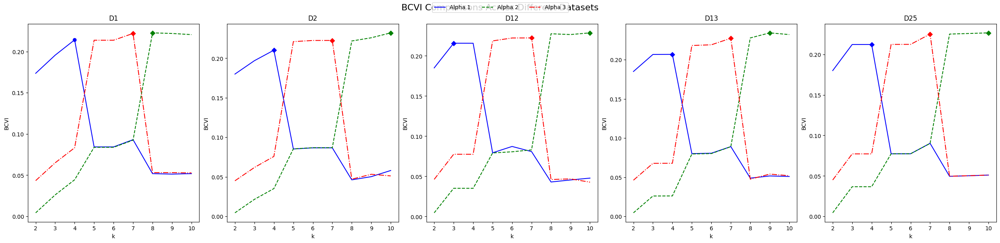

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper center", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [23]:
# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Variance và CH_Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["CH_Index"].set_index("k", inplace=True)
    result_alpha2["CH_Index"].set_index("k", inplace=True)
    result_alpha3["CH_Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    CHs1 = result_alpha1["CH_Index"]
    CHs2 = result_alpha2["CH_Index"]
    CHs3 = result_alpha3["CH_Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Variance Alpha 1": Vars1["Variance"].values,
        "CH Index Alpha 1": CHs1["CH_Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Variance Alpha 2": Vars2["Variance"].values,
        "CH Index Alpha 2": CHs2["CH_Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Variance Alpha 3": Vars3["Variance"].values,
        "CH Index Alpha 3": CHs3["CH_Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D1 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Variance Alpha 1  CH Index Alpha 1  BCVI Alpha 2  \
0   2      0.173566          0.000032       1734.532856      0.004339   
1   3      0.195012          0.000035       2285.111016      0.025784   
2   4      0.213146          0.000038       2750.686109      0.043919   
3   5      0.083262          0.000017       2758.128452      0.083261   
4   6      0.083262          0.000017       2758.147355      0.083262   
5   7      0.091425          0.000019       2967.700963      0.091424   
6   8      0.054769          0.000012       3029.224574      0.223995   
7   9      0.052777          0.000011       2978.075661      0.222008   
8  10      0.052781          0.000011       2978.197537      0.222007   

   Variance Alpha 2  CH Index Alpha 2  BCVI Alpha 3  Variance Alpha 3  \
0      9.678513e-07       1734.532856      0.043392          0.000009   
1      5.627356e-06       2285.111016      0.064952          0.000014   
2      9.40

#### Case 2

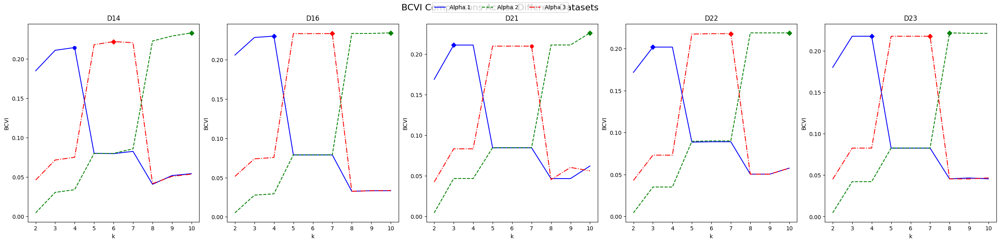

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper center", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [25]:
# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Variance và CH_Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["CH_Index"].set_index("k", inplace=True)
    result_alpha2["CH_Index"].set_index("k", inplace=True)
    result_alpha3["CH_Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    CHs1 = result_alpha1["CH_Index"]
    CHs2 = result_alpha2["CH_Index"]
    CHs3 = result_alpha3["CH_Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Variance Alpha 1": Vars1["Variance"].values,
        "CH Index Alpha 1": CHs1["CH_Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Variance Alpha 2": Vars2["Variance"].values,
        "CH Index Alpha 2": CHs2["CH_Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Variance Alpha 3": Vars3["Variance"].values,
        "CH Index Alpha 3": CHs3["CH_Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D14 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Variance Alpha 1  CH Index Alpha 1  BCVI Alpha 2  \
0   2      0.184975          0.000044       1157.078449      0.004624   
1   3      0.210322          0.000049       1604.189625      0.030110   
2   4      0.213718          0.000049       1664.097370      0.033525   
3   5      0.079244          0.000021       1739.189919      0.079424   
4   6      0.078934          0.000021       1733.724807      0.079451   
5   7      0.084611          0.000023       1833.870869      0.084845   
6   8      0.042432          0.000012       1823.989852      0.221699   
7   9      0.050743          0.000014       1970.597367      0.232608   
8  10      0.055021          0.000015       2046.059734      0.233714   

   Variance Alpha 2  CH Index Alpha 2  BCVI Alpha 3  Variance Alpha 3  \
0          0.000001       1157.078449      0.046244          0.000013   
1          0.000009       1604.189625      0.072205          0.000020   
2         

#### Case 3

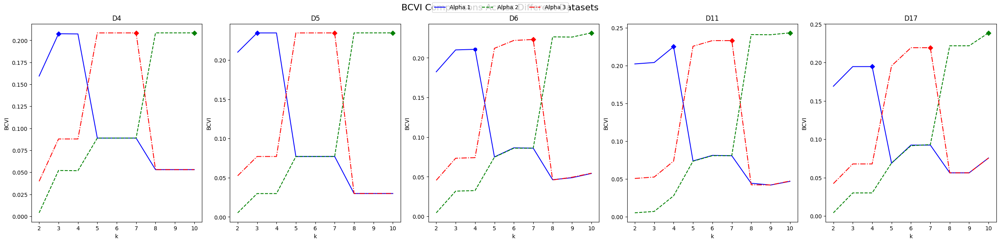

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper center", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [27]:
# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Variance và CH_Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["CH_Index"].set_index("k", inplace=True)
    result_alpha2["CH_Index"].set_index("k", inplace=True)
    result_alpha3["CH_Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    CHs1 = result_alpha1["CH_Index"]
    CHs2 = result_alpha2["CH_Index"]
    CHs3 = result_alpha3["CH_Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Variance Alpha 1": Vars1["Variance"].values,
        "CH Index Alpha 1": CHs1["CH_Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Variance Alpha 2": Vars2["Variance"].values,
        "CH Index Alpha 2": CHs2["CH_Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Variance Alpha 3": Vars3["Variance"].values,
        "CH Index Alpha 3": CHs3["CH_Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D4 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Variance Alpha 1  CH Index Alpha 1  BCVI Alpha 2  \
0   2      0.159376          0.000022       3235.181511      0.003984   
1   3      0.207211          0.000027       5038.903284      0.052060   
2   4      0.207269          0.000027       5041.098568      0.051844   
3   5      0.088941          0.000013       5086.502454      0.088907   
4   6      0.088948          0.000013       5086.747470      0.088913   
5   7      0.088952          0.000013       5086.924441      0.088918   
6   8      0.053097          0.000008       5087.094570      0.208454   
7   9      0.053101          0.000008       5087.239967      0.208458   
8  10      0.053105          0.000008       5087.367668      0.208461   

   Variance Alpha 2  CH Index Alpha 2  BCVI Alpha 3  Variance Alpha 3  \
0      6.454210e-07       3235.181511      0.039844          0.000006   
1      8.026081e-06       5049.262929      0.087893          0.000013   
2      7.99

#### Case 4

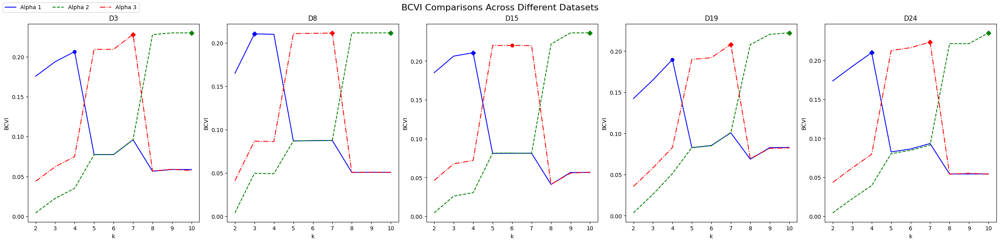

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [29]:
# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Variance và CH_Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["CH_Index"].set_index("k", inplace=True)
    result_alpha2["CH_Index"].set_index("k", inplace=True)
    result_alpha3["CH_Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    CHs1 = result_alpha1["CH_Index"]
    CHs2 = result_alpha2["CH_Index"]
    CHs3 = result_alpha3["CH_Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Variance Alpha 1": Vars1["Variance"].values,
        "CH Index Alpha 1": CHs1["CH_Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Variance Alpha 2": Vars2["Variance"].values,
        "CH Index Alpha 2": CHs2["CH_Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Variance Alpha 3": Vars3["Variance"].values,
        "CH Index Alpha 3": CHs3["CH_Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D3 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Variance Alpha 1  CH Index Alpha 1  BCVI Alpha 2  \
0   2      0.175567          0.000034       1766.645783      0.004389   
1   3      0.193764          0.000037       2276.923464      0.022555   
2   4      0.206518          0.000038       2634.579829      0.035288   
3   5      0.077544          0.000017       2710.355007      0.077488   
4   6      0.077557          0.000017       2710.701465      0.077500   
5   7      0.094357          0.000020       3181.824128      0.096159   
6   8      0.056754          0.000013       3235.081591      0.227843   
7   9      0.058965          0.000013       3297.089701      0.230051   
8  10      0.058975          0.000013       3297.387303      0.228726   

   Variance Alpha 2  CH Index Alpha 2  BCVI Alpha 3  Variance Alpha 3  \
0          0.000001       1766.645783      0.043892          0.000010   
1          0.000005       2276.923464      0.062081          0.000014   
2          

#### Case 5

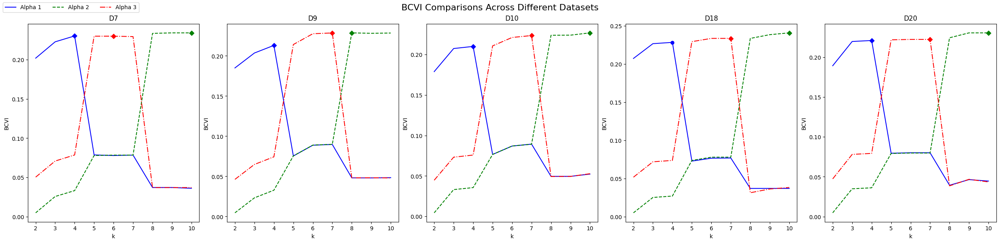

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [31]:
# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Variance và CH_Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["CH_Index"].set_index("k", inplace=True)
    result_alpha2["CH_Index"].set_index("k", inplace=True)
    result_alpha3["CH_Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    CHs1 = result_alpha1["CH_Index"]
    CHs2 = result_alpha2["CH_Index"]
    CHs3 = result_alpha3["CH_Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Variance Alpha 1": Vars1["Variance"].values,
        "CH Index Alpha 1": CHs1["CH_Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Variance Alpha 2": Vars2["Variance"].values,
        "CH Index Alpha 2": CHs2["CH_Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Variance Alpha 3": Vars3["Variance"].values,
        "CH Index Alpha 3": CHs3["CH_Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D7 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Variance Alpha 1  CH Index Alpha 1  BCVI Alpha 2  \
0   2      0.201761          0.000072        609.783718      0.005044   
1   3      0.222258          0.000077        999.604327      0.025793   
2   4      0.230016          0.000079       1147.150701      0.032447   
3   5      0.077892          0.000032       1131.858785      0.077858   
4   6      0.078472          0.000032       1142.884699      0.078438   
5   7      0.077912          0.000032       1132.237630      0.078698   
6   8      0.037229          0.000016       1221.872242      0.233906   
7   9      0.037230          0.000016       1221.895545      0.233907   
8  10      0.037231          0.000016       1221.923422      0.233909   

   Variance Alpha 2  CH Index Alpha 2  BCVI Alpha 3  Variance Alpha 3  \
0          0.000002        609.783718      0.050440          0.000021   
1          0.000011       1004.861876      0.071279          0.000030   
2          

### Silhoutte_Index

#### Index

In [19]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics.pairwise import pairwise_distances

def B_SH_INDEX(data, kmax, method='kmeans', nstart=100, alpha=None, mult_alpha=1/2):
    if data is None:
        raise ValueError("Missing input argument. A numeric data frame or matrix is required")
    if kmax is None:
        raise ValueError("Missing input argument. A maximum number of clusters is required")
    if not isinstance(kmax, (int, float)):
        raise ValueError("Argument 'kmax' must be numeric")
    if kmax > data.shape[0]:
        raise ValueError("The maximum number of clusters for consideration should be less than or equal to the number of data points in dataset.")
    if method not in ['kmeans', 'hclust_complete', 'hclust_average', 'hclust_single']:
        raise ValueError("Argument 'method' should be one of 'kmeans', 'hclust_complete', 'hclust_average', 'hclust_single']")
    
    kmin = 2  # Minimum number of clusters
    if alpha is None:
        # Default alpha: a constant value of 1 for all k
        alpha = [1] * (kmax - kmin + 1)
    if len(alpha) != (kmax - kmin + 1):
        raise ValueError("Length of alpha must match the range kmin to kmax.")
    
    # Standardize the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)
    
    n = data_scaled.shape[0]
    adj_alpha = np.array(alpha) * (n ** mult_alpha)
    
    # Initialize variables
    silhouette_scores = []

    for k in range(kmin, kmax + 1):
        if method == 'kmeans':
            kmeans = KMeans(n_clusters=k, n_init=nstart, random_state=42)
            kmeans.fit(data_scaled)
            labels = kmeans.labels_
        elif method.startswith('hclust'):
            Z = linkage(data_scaled, method=method.split('_')[1])
            labels = fcluster(Z, k, criterion='maxclust')
        
        # Compute pairwise distances between all points
        dist_matrix = pairwise_distances(data_scaled)
        
        # Calculate silhouette values for each point
        s_values = np.zeros(n)
        
        for i in range(n):
            # Points in the same cluster as x_i
            same_cluster = labels == labels[i]
            other_clusters = labels != labels[i]
            
            # a(i) is the average distance between i and all other points in its own cluster
            a_i = np.mean(dist_matrix[i, same_cluster]) if np.sum(same_cluster) > 1 else 0
            
            # b(i) is the smallest average distance between i and all points in other clusters
            b_i_values = []
            for label in np.unique(labels[other_clusters]):
                b_i = np.mean(dist_matrix[i, labels == label])
                b_i_values.append(b_i)
            b_i = min(b_i_values) if b_i_values else 0
            
            # Compute silhouette value for point i
            if np.sum(same_cluster) > 1:
                s_i = (b_i - a_i) / max(a_i, b_i) if max(a_i, b_i) > 0 else 0
            else:
                s_i = 0
            s_values[i] = s_i
        
        # Calculate average silhouette score for this k
        silhouette_scores.append(np.mean(s_values))
    
    # Calculate BCVI (Bayesian Clustering Validity Index)
    SH = pd.DataFrame({'k': np.arange(kmin, kmax + 1), 'SH': silhouette_scores})
    min_SH = SH["SH"].min()  # The largest value of SH indicates the optimal number of clusters
    
    # Compute rank values (rk)
    rk = (SH["SH"] - min_SH) / (SH["SH"].sum() - min_SH)
    nrk = n * rk
    
    # Calculate ex and var (based on the given formulas)
    ex = (adj_alpha + nrk) / (adj_alpha.sum() + n)
    var = ((adj_alpha + nrk) * (adj_alpha.sum() + n - adj_alpha - nrk)) / ((adj_alpha.sum() + n)**2 * (adj_alpha.sum() + n + 1))
    
    # Prepare final results
    BCVI = pd.DataFrame({'k': np.arange(kmin, kmax + 1), 'BCVI': ex})
    VarBCVI = pd.DataFrame({'k': np.arange(kmin, kmax + 1), 'Var': var})
    
    # Return the results as a dictionary
    result = {
        "BCVI": BCVI,
        "VAR": VarBCVI,
        "Index": SH
    }
    
    return result


#### SH_SCORE_25file

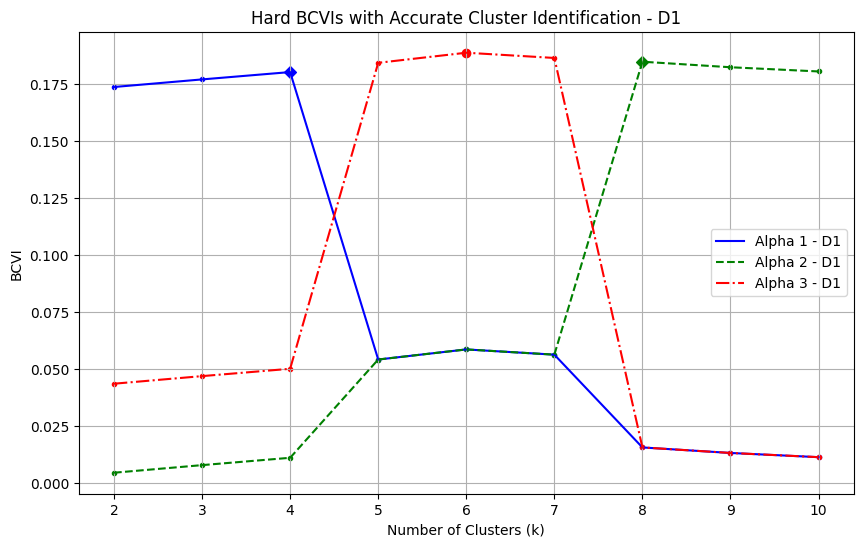

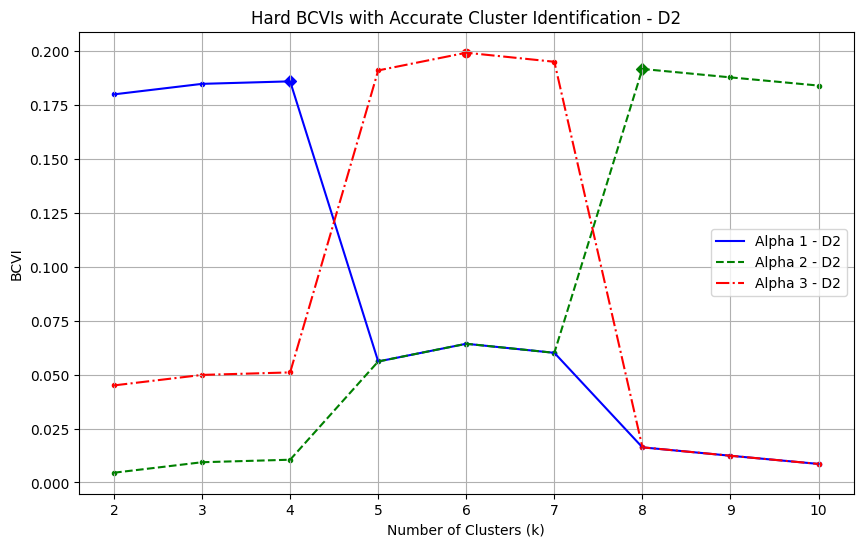

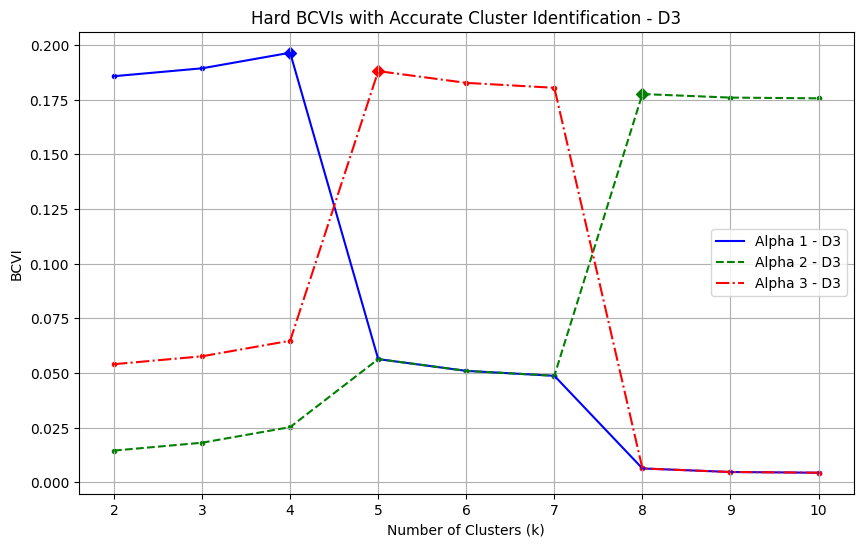

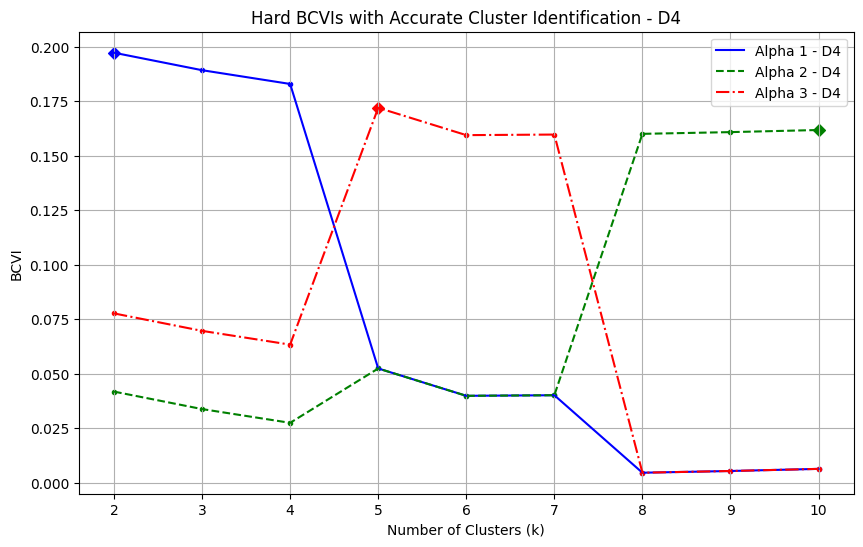

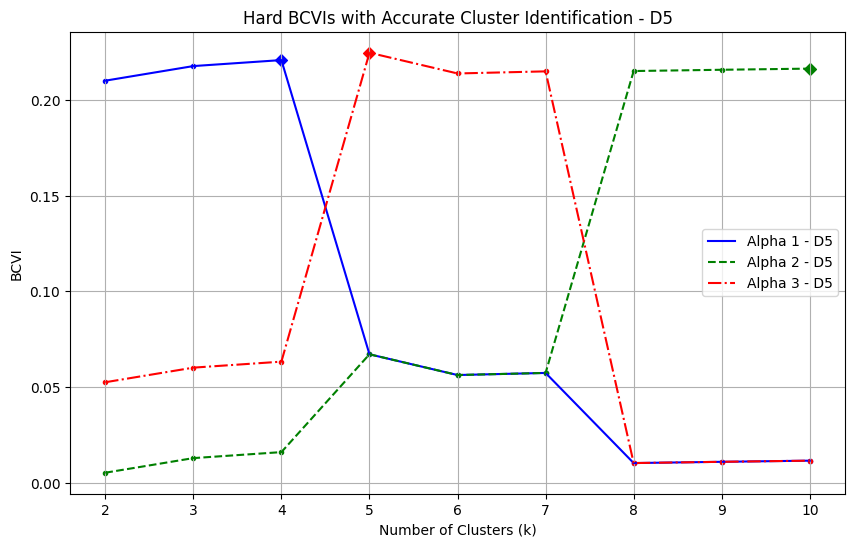

...

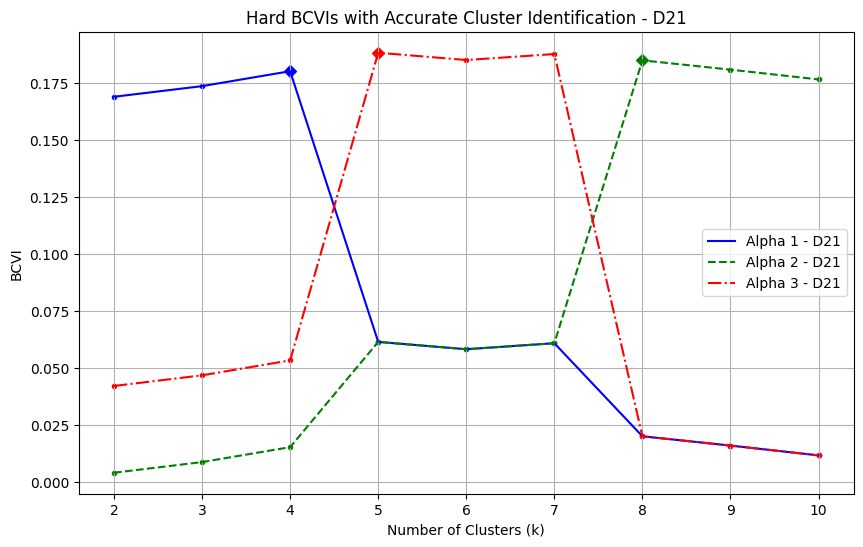

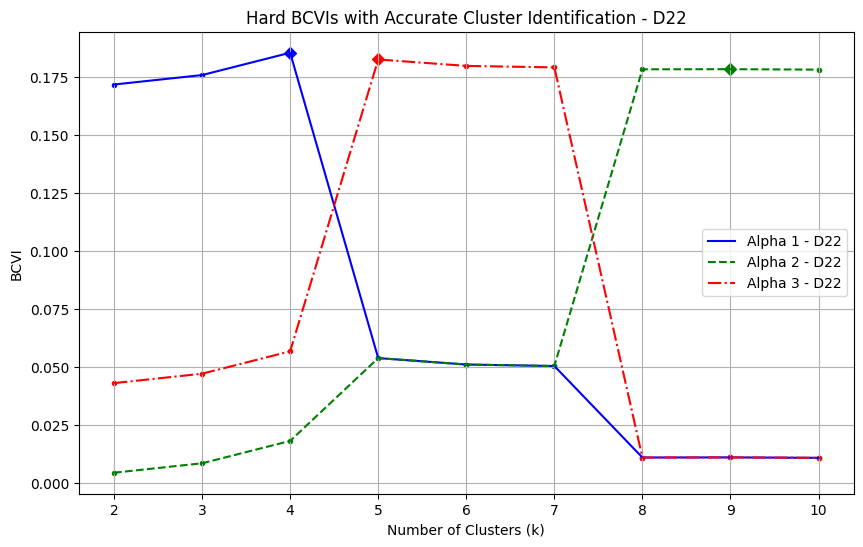

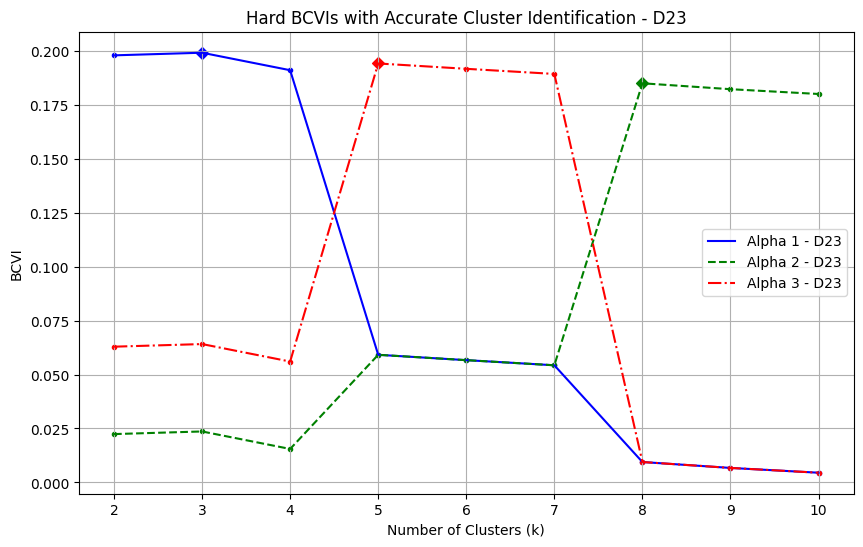

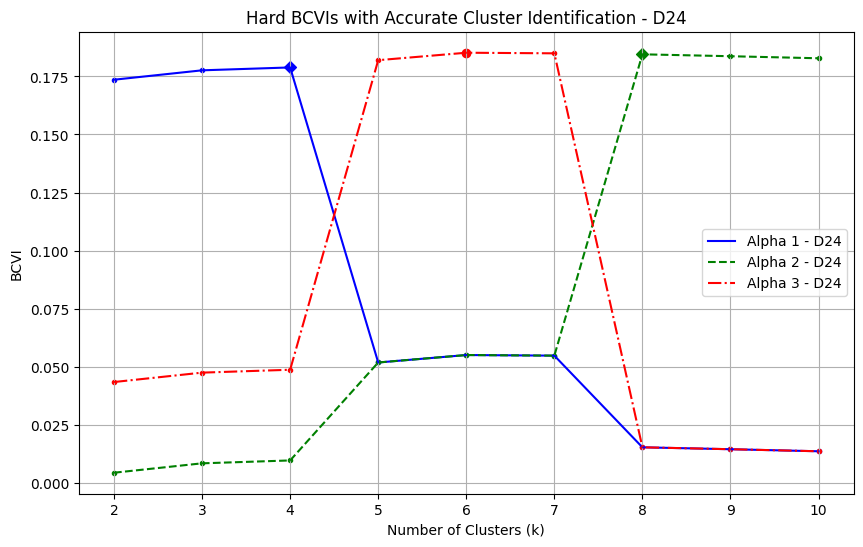

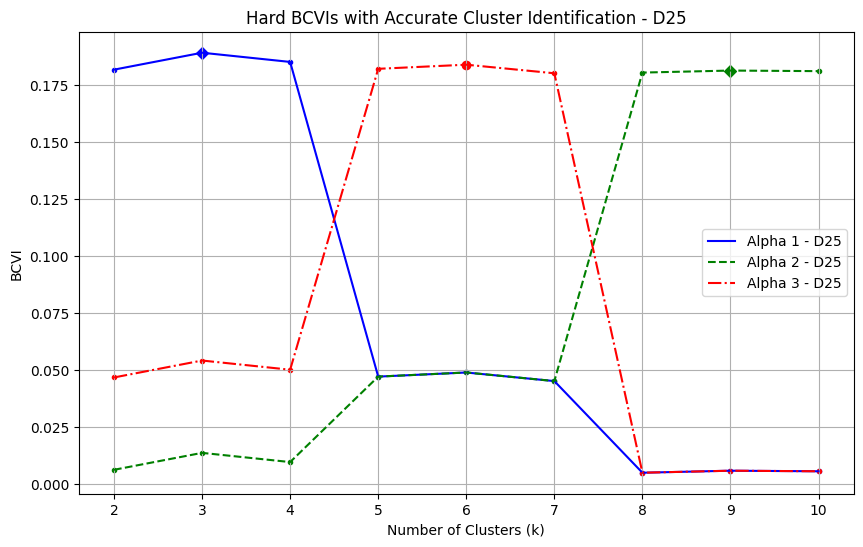

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Thực hiện vòng lặp từ 1 đến 25
for i in range(1, 26):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/AI_Datasets/D{i}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha3["BCVI"].set_index("k", inplace=True)
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Số cụm labels thực tế (true cluster count)
    true_cluster_count = 6  # Thay số này bằng số cụm thực tế

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    plt.figure(figsize=(10, 6))

    # Vẽ các đường BCVI
    plt.plot(BCVIs1.index, BCVIs1["BCVI"], label=f"Alpha 1 - D{i}", color='b', linestyle='-')
    plt.plot(BCVIs2.index, BCVIs2["BCVI"], label=f"Alpha 2 - D{i}", color='g', linestyle='--')
    plt.plot(BCVIs3.index, BCVIs3["BCVI"], label=f"Alpha 3 - D{i}", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        # Alpha 1
        if k == max_k1:  # Nếu k là max đối với Alpha 1
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        else:
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker='.', label=None)

        # Alpha 2
        if k == max_k2:  # Nếu k là max đối với Alpha 2
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        else:
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker='.', label=None)

        # Alpha 3
        if k == max_k3:  # Nếu k là max đối với Alpha 3
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)
        else:
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker='.', label=None)

    # Thêm tiêu đề và nhãn trục
    plt.title(f"Hard BCVIs with Accurate Cluster Identification - D{i}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("BCVI")

    # Hiển thị legend
    plt.legend()

    # Hiển thị lưới
    plt.grid(True)

    # Hiển thị biểu đồ
    plt.show()


#### Case 1

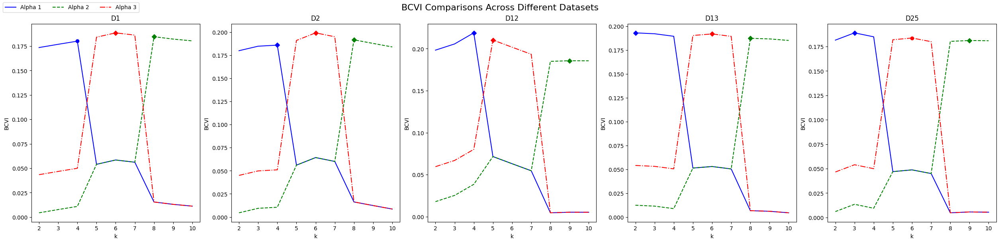

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_SH_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_SH_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_SH_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_SH_alpha1["BCVI"].set_index("k", inplace=True)
    result_SH_alpha2["BCVI"].set_index("k", inplace=True)
    result_SH_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_SH_alpha1["BCVI"]
    BCVIs2 = result_SH_alpha2["BCVI"]
    BCVIs3 = result_SH_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [60]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["SH"].values,  # Sửa thành "SH"
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D1 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.173566     0.000032       0.433128      0.004339  9.678513e-07   
1   3      0.176899     0.000033       0.477330      0.007672  1.705444e-06   
2   4      0.180119     0.000033       0.520044      0.010892  2.413480e-06   
3   5      0.054005     0.000011       0.573899      0.054005  1.144490e-05   
4   6      0.058434     0.000012       0.632646      0.058434  1.232555e-05   
5   7      0.056135     0.000012       0.602162      0.056135  1.186967e-05   
6   8      0.015434     0.000003       0.580295      0.184661  3.372923e-05   
7   9      0.013008     0.000003       0.548117      0.182235  3.338515e-05   
8  10      0.011164     0.000002       0.523654      0.180391  3.312181e-05   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       0.433128      0.043392     0.000009       0.433128  
1       0.477330      0.046724     0.000010     

#### Case 2

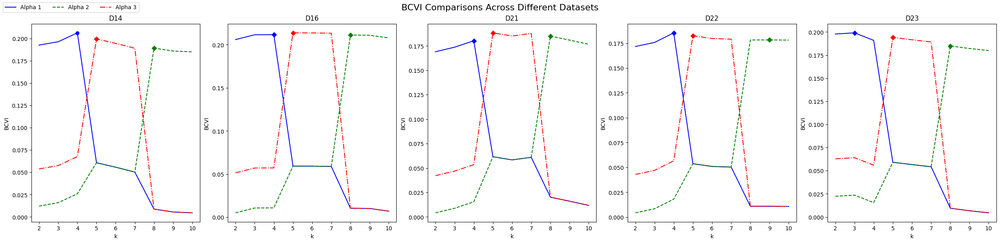

In [ ]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_SH_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_SH_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_SH_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_SH_alpha1["BCVI"].set_index("k", inplace=True)
    result_SH_alpha2["BCVI"].set_index("k", inplace=True)
    result_SH_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_SH_alpha1["BCVI"]
    BCVIs2 = result_SH_alpha2["BCVI"]
    BCVIs3 = result_SH_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [59]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["SH"].values,  # Sửa thành "SH"
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D14 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.192516     0.000045       0.432257      0.012166     0.000004   
1   3      0.196306     0.000046       0.479134      0.015955     0.000005   
2   4      0.206251     0.000048       0.602154      0.025900     0.000007   
3   5      0.060733     0.000017       0.518208      0.060733     0.000017   
4   6      0.055749     0.000015       0.456558      0.055749     0.000015   
5   7      0.050260     0.000014       0.388658      0.050260     0.000014   
6   8      0.008803     0.000003       0.390664      0.189154     0.000045   
7   9      0.005537     0.000002       0.350265      0.185888     0.000044   
8  10      0.004624     0.000001       0.338971      0.184975     0.000044   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       0.432257      0.053785     0.000015       0.432257  
1       0.479134      0.057574     0.000016       0.47913

#### Case 3

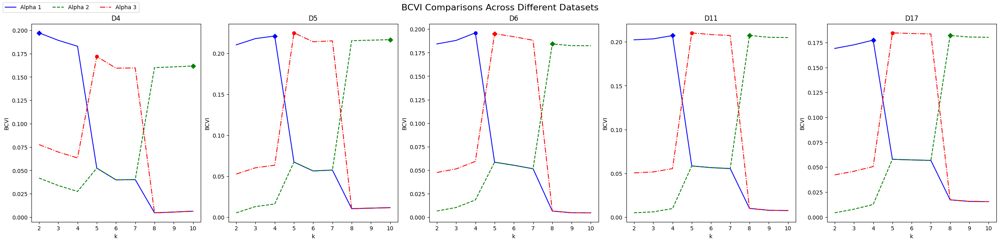

In [30]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_SH_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_SH_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_SH_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_SH_alpha1["BCVI"].set_index("k", inplace=True)
    result_SH_alpha2["BCVI"].set_index("k", inplace=True)
    result_SH_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_SH_alpha1["BCVI"]
    BCVIs2 = result_SH_alpha2["BCVI"]
    BCVIs3 = result_SH_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [58]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["SH"].values,  # Sửa thành "SH"
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D4 (True Cluster Count: 5) =====
    k  BCVI Alpha 1   Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.197166  2.574386e-05       0.783430      0.041775     0.000007   
1   3      0.189153  2.494413e-05       0.697516      0.033762     0.000005   
2   4      0.182846  2.429987e-05       0.629883      0.027454     0.000004   
3   5      0.052375  8.071940e-06       0.512600      0.052375     0.000008   
4   6      0.039844  6.221839e-06       0.378239      0.039844     0.000006   
5   7      0.040112  6.261971e-06       0.381114      0.040112     0.000006   
6   8      0.004578  7.411066e-07       0.384601      0.159969     0.000022   
7   9      0.005369  8.684519e-07       0.393081      0.160760     0.000022   
8  10      0.006340  1.024612e-06       0.403498      0.161731     0.000022   

   Index Alpha 2  BCVI Alpha 3   Var Alpha 3  Index Alpha 3  
0       0.783430      0.077635  1.164593e-05       0.783430  
1       0.697516      0.069622  1.053466e-05  

#### Case 4

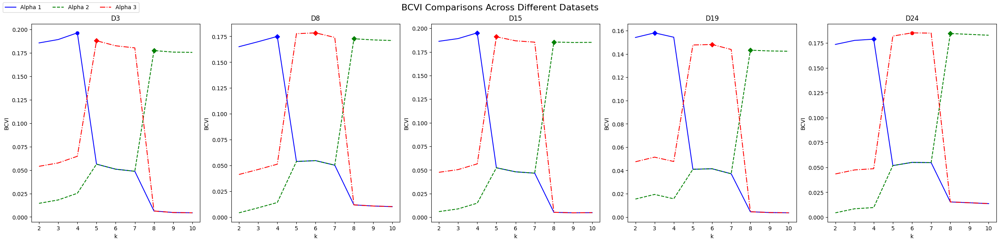

In [32]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_SH_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_SH_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_SH_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_SH_alpha1["BCVI"].set_index("k", inplace=True)
    result_SH_alpha2["BCVI"].set_index("k", inplace=True)
    result_SH_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_SH_alpha1["BCVI"]
    BCVIs2 = result_SH_alpha2["BCVI"]
    BCVIs3 = result_SH_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [57]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["SH"].values,  # Sửa thành "SH"
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["SH"].values,  # Sửa thành "SH"
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D3 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.185686     0.000035       0.481272      0.014509     0.000003   
1   3      0.189291     0.000036       0.522313      0.018113     0.000004   
2   4      0.196416     0.000037       0.603447      0.025238     0.000006   
3   5      0.056334     0.000012       0.507722      0.056334     0.000012   
4   6      0.050956     0.000011       0.446483      0.050956     0.000011   
5   7      0.048707     0.000011       0.420876      0.048707     0.000011   
6   8      0.006345     0.000001       0.388308      0.177523     0.000034   
7   9      0.004720     0.000001       0.369807      0.175898     0.000034   
8  10      0.004389     0.000001       0.366039      0.175567     0.000034   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       0.481272      0.054011     0.000012       0.481272  
1       0.522313      0.057615     0.000013       0.522313

#### Case 5

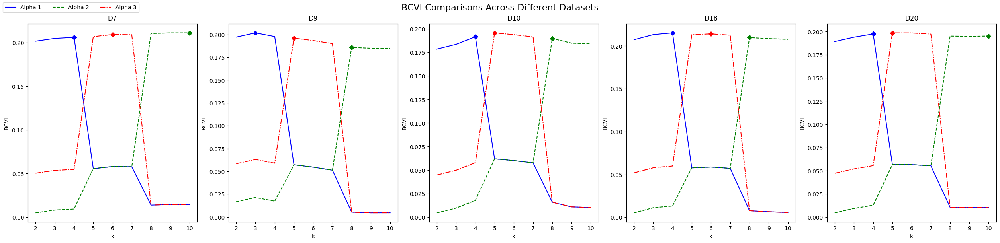

In [33]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_SH_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_SH_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_SH_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_SH_alpha1["BCVI"].set_index("k", inplace=True)
    result_SH_alpha2["BCVI"].set_index("k", inplace=True)
    result_SH_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_SH_alpha1["BCVI"]
    BCVIs2 = result_SH_alpha2["BCVI"]
    BCVIs3 = result_SH_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [ ]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    # Lấy dữ liệu từ từng phần
    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["SH"].values, 
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["SH"].values,  
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["SH"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D7 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.201761     0.000072       0.405907      0.005044     0.000002   
1   3      0.204942     0.000073       0.465684      0.008226     0.000004   
2   4      0.206111     0.000073       0.487636      0.009394     0.000004   
3   5      0.055632     0.000023       0.503457      0.055632     0.000023   
4   6      0.058027     0.000024       0.548452      0.058027     0.000024   
5   7      0.057769     0.000024       0.543609      0.057769     0.000024   
6   8      0.013870     0.000006       0.571731      0.210587     0.000074   
7   9      0.014517     0.000006       0.583877      0.211233     0.000074   
8  10      0.014533     0.000006       0.584189      0.211250     0.000074   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       0.405907      0.050440     0.000021       0.405907  
1       0.465684      0.053622     0.000023       0.465684

### WI_Index

#### Index

In [15]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.cluster import KMeans

def B_WI_IDX(x, kmax, alpha=None, mult_alpha=1/2, iter=100, nstart=20):
    # Chuẩn hóa dữ liệu đầu vào (Standardization)
    scaler = StandardScaler()
    x = scaler.fit_transform(x)
    
    n = len(x)
    kmin = 2

    if alpha is None:
        alpha = [1] * (kmax - kmin + 1)
    if len(alpha) != (kmax - kmin + 1):
        raise ValueError("Length of alpha must match the range kmin to kmax.")

    adj_alpha = alpha * (n ** mult_alpha)
    d = pdist(x, metric="euclidean")  # Tính vector khoảng cách
    WI_values = []
    NC_values = []

    # Tính toán NC cho mỗi k
    for k in range(kmin, kmax + 1):
        kmeans = KMeans(n_clusters=k, max_iter=iter, n_init=nstart, random_state=42)
        kmeans.fit(x)
        centroids = kmeans.cluster_centers_
        labels = kmeans.labels_
        
        # Tính khoảng cách giữa các cụm
        d_centroids = pdist(centroids, metric="euclidean")
        NC_k = np.linalg.norm(np.mean(d) - np.mean(d_centroids))
        NC_values.append(NC_k if not np.isnan(NC_k) else 0)
    
    # Tính toán WI cho mỗi k
    for k in range(kmin, kmax + 1):
        if k == kmin:
            NCI1_k = 0
            NCI2_k = 0
        else:
            NC_k = NC_values[k - kmin]
            NC_k_minus_1 = NC_values[k - kmin - 1]
            NC_k_plus_1 = NC_values[k - kmin + 1] if k < kmax else 0
            
            denominator1 = max(0, (NC_k_plus_1 - NC_k) * (1 - NC_k_minus_1))
            denominator2 = (1 - NC_k)
            
            NCI1_k = ((NC_k - NC_k_minus_1) * (1 - NC_k)) / denominator1 if denominator1 != 0 else 0
            NCI2_k = ((NC_k - NC_k_minus_1) / (1 - NC_k_minus_1) - (NC_k_plus_1 - NC_k) / denominator2) if denominator2 != 0 else 0
        
        if max(NC_values) == float("inf"):
            if NCI1_k == -float("inf"):
                WI_k = min(filter(lambda x: x > -float("inf"), NC_values)) + NCI2_k
            elif NCI1_k == float("inf"):
                WI_k = max(filter(lambda x: x < float("inf"), NC_values)) + NCI2_k
            else:
                WI_k = NCI1_k + NCI2_k
        else:
            if NCI1_k == -float("inf"):
                WI_k = min(filter(lambda x: x > -float("inf"), NC_values))
            else:
                WI_k = NCI1_k
        
        WI_values.append(WI_k if not np.isnan(WI_k) else 0)  # Thay NaN bằng 0
    
    min_WI = min(WI_values)
    denominator3 = sum(np.array(WI_values) - min_WI)
    rk = (np.array(WI_values) - min_WI) / denominator3 if denominator3 != 0 else np.zeros_like(WI_values)
    nrk = n * rk
    ex = (adj_alpha + nrk) / (sum(adj_alpha) + n)
    var = ((adj_alpha + nrk) * (sum(adj_alpha) + n - adj_alpha - nrk)) / ((sum(adj_alpha) + n) ** 2 * (sum(adj_alpha) + n + 1))
    
    # Tạo DataFrame cho BCVI và VarBCVI
    BCVI = pd.DataFrame({'k': np.arange(kmin, kmax + 1), 'BCVI': ex})
    VarBCVI = pd.DataFrame({'k': np.arange(kmin, kmax + 1), 'Var': var})
    
    # Trả về kết quả dưới dạng từ điển
    result = {
        "BCVI": BCVI,
        "VAR": VarBCVI,
        "WI": pd.DataFrame({'k': np.arange(kmin, kmax + 1), 'WI': WI_values})
    }
    
    return result



#### WI_25file

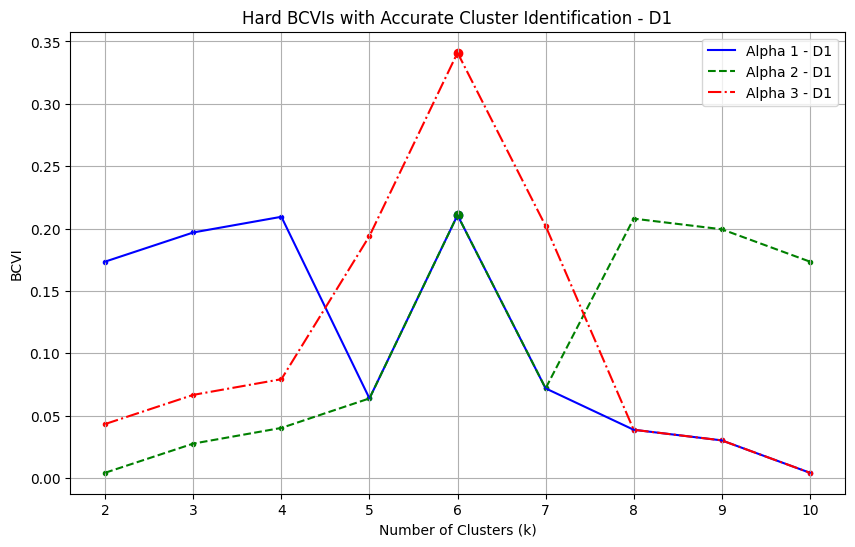

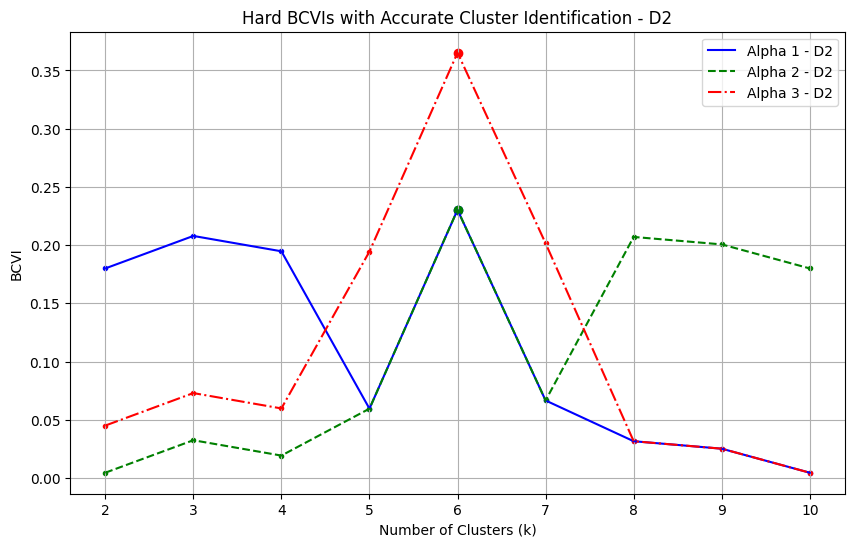

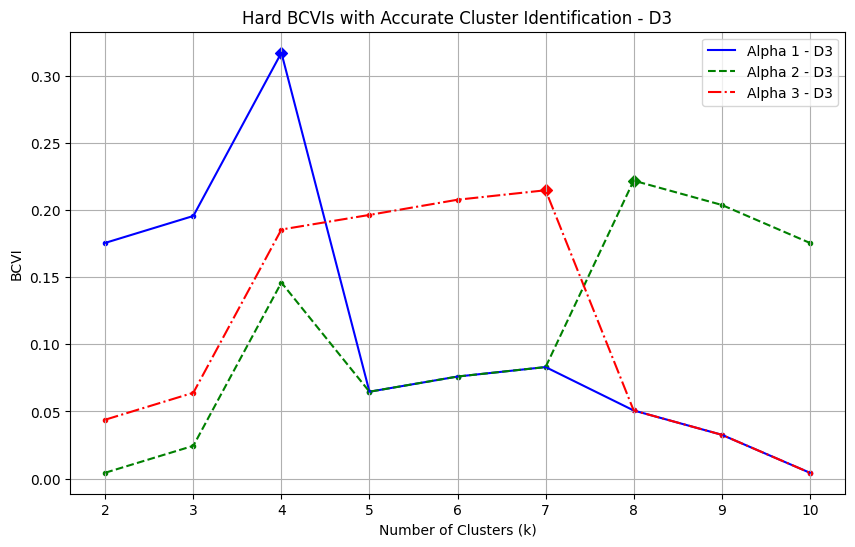

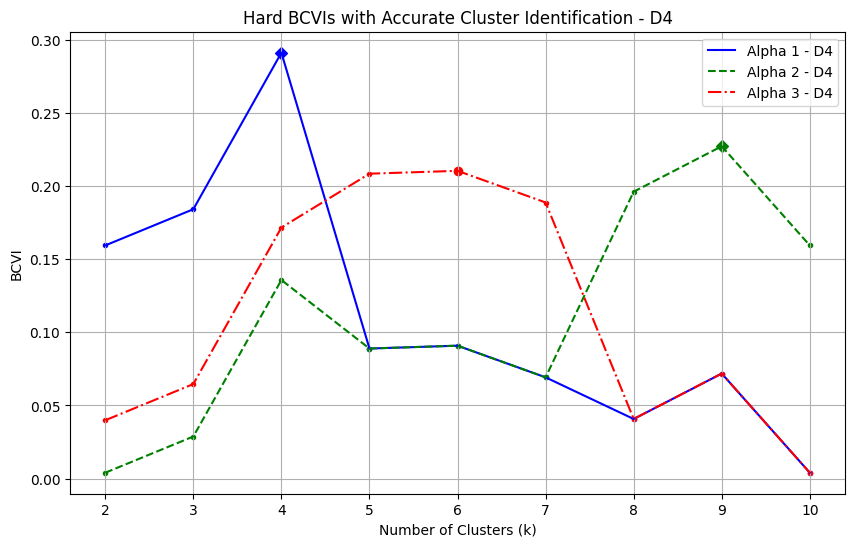

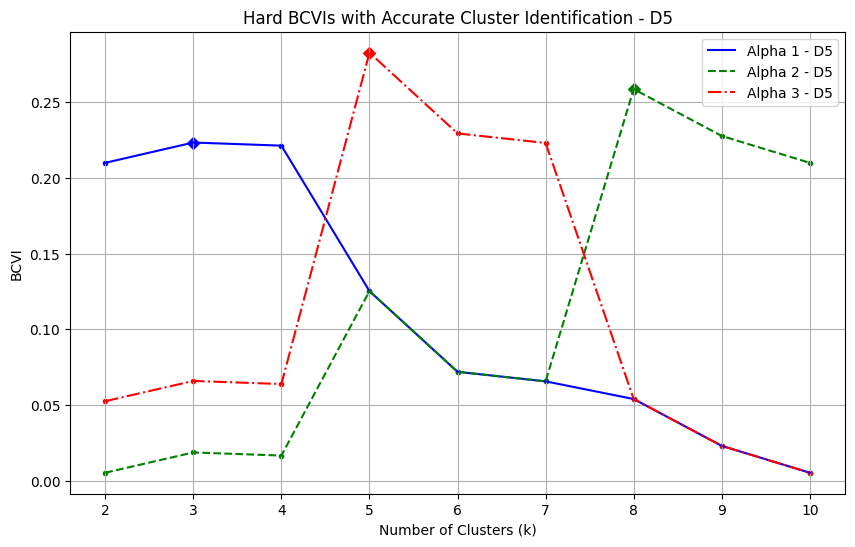

...

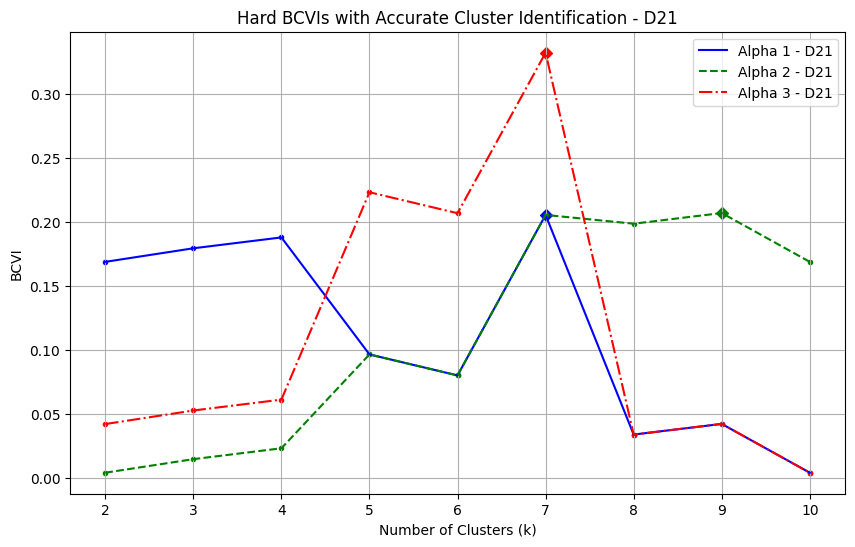

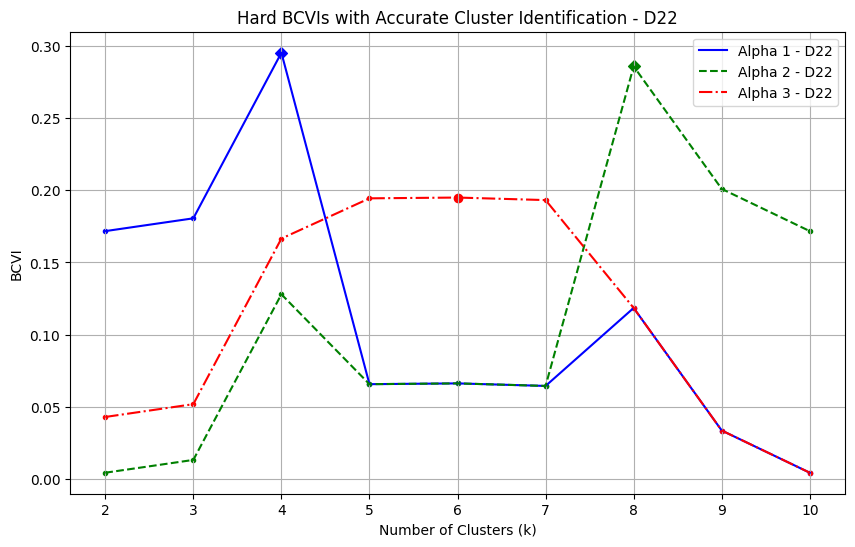

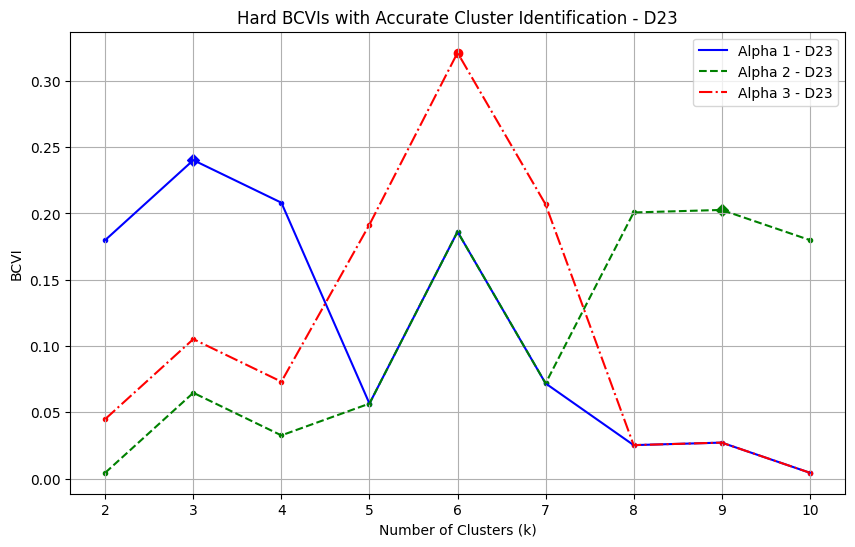

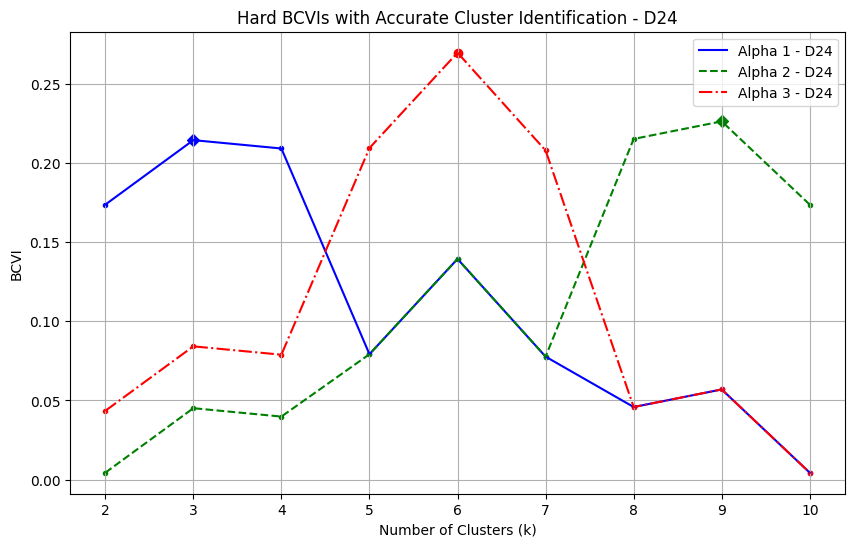

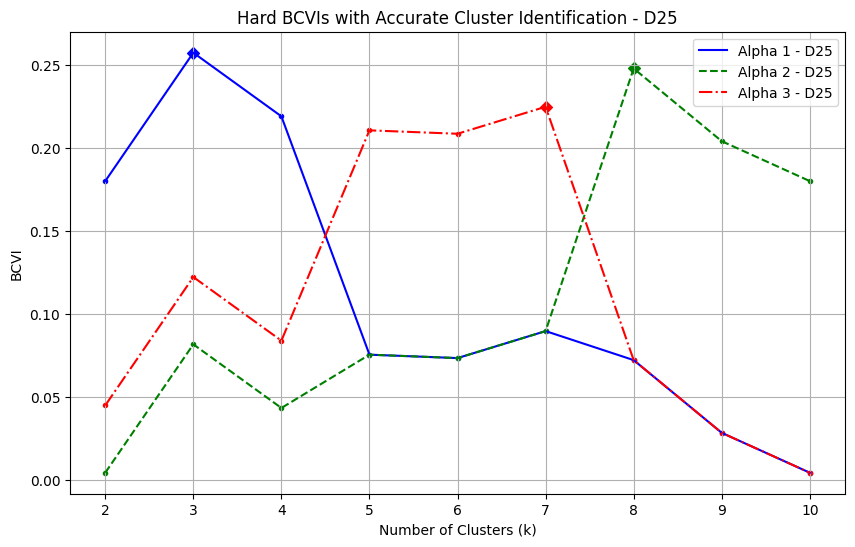

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Thực hiện vòng lặp từ 1 đến 25
for i in range(1, 26):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/AI_Datasets/D{i}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha3["BCVI"].set_index("k", inplace=True)
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Số cụm labels thực tế (true cluster count)
    true_cluster_count = 6  # Thay số này bằng số cụm thực tế

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    plt.figure(figsize=(10, 6))

    # Vẽ các đường BCVI
    plt.plot(BCVIs1.index, BCVIs1["BCVI"], label=f"Alpha 1 - D{i}", color='b', linestyle='-')
    plt.plot(BCVIs2.index, BCVIs2["BCVI"], label=f"Alpha 2 - D{i}", color='g', linestyle='--')
    plt.plot(BCVIs3.index, BCVIs3["BCVI"], label=f"Alpha 3 - D{i}", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        # Alpha 1
        if k == max_k1:  # Nếu k là max đối với Alpha 1
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        else:
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker='.', label=None)

        # Alpha 2
        if k == max_k2:  # Nếu k là max đối với Alpha 2
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        else:
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker='.', label=None)

        # Alpha 3
        if k == max_k3:  # Nếu k là max đối với Alpha 3
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)
        else:
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker='.', label=None)

    # Thêm tiêu đề và nhãn trục
    plt.title(f"Hard BCVIs with Accurate Cluster Identification - D{i}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("BCVI")

    # Hiển thị legend
    plt.legend()

    # Hiển thị lưới
    plt.grid(True)

    # Hiển thị biểu đồ
    plt.show()


#### Case 1

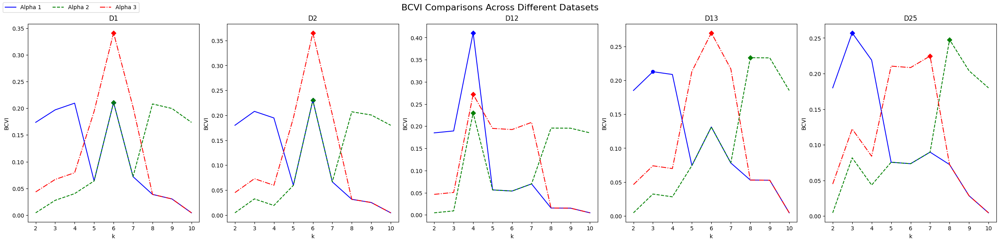

In [52]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_WI_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_WI_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_WI_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_WI_alpha1["BCVI"].set_index("k", inplace=True)
    result_WI_alpha2["BCVI"].set_index("k", inplace=True)
    result_WI_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_WI_alpha1["BCVI"]
    BCVIs2 = result_WI_alpha2["BCVI"]
    BCVIs3 = result_WI_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [47]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR, và WI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["WI"].set_index("k", inplace=True)
    result_alpha2["WI"].set_index("k", inplace=True)
    result_alpha3["WI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    WI1 = result_alpha1["WI"]
    WI2 = result_alpha2["WI"]
    WI3 = result_alpha3["WI"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "WI Alpha 1": WI1["WI"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "WI Alpha 2": WI2["WI"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "WI Alpha 3": WI3["WI"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D1 (True Cluster Count: 4) =====
    k  BCVI Alpha 1   Var Alpha 1  WI Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.173566  3.213404e-05    0.000000      0.004339  9.678513e-07   
1   3      0.196916  3.542693e-05    0.703422      0.027689  6.031137e-06   
2   4      0.209476  3.709728e-05    1.081825      0.040249  8.653866e-06   
3   5      0.063904  1.340120e-05    0.617969      0.063904  1.340120e-05   
4   6      0.210805  3.726981e-05    5.043455      0.210805  3.726981e-05   
5   7      0.071961  1.496077e-05    0.860669      0.071961  1.496077e-05   
6   8      0.038771  8.348751e-06    1.037274      0.207998  3.690430e-05   
7   9      0.030262  6.574207e-06    0.780944      0.199489  3.577489e-05   
8  10      0.004339  9.678513e-07    0.000000      0.173566  3.213404e-05   

   WI Alpha 2  BCVI Alpha 3   Var Alpha 3  WI Alpha 3  
0    0.000000      0.043392  9.298897e-06    0.000000  
1    0.703422      0.066741  1.395363e-05    0.703422  
2    1.081825      0.0

#### Case 2

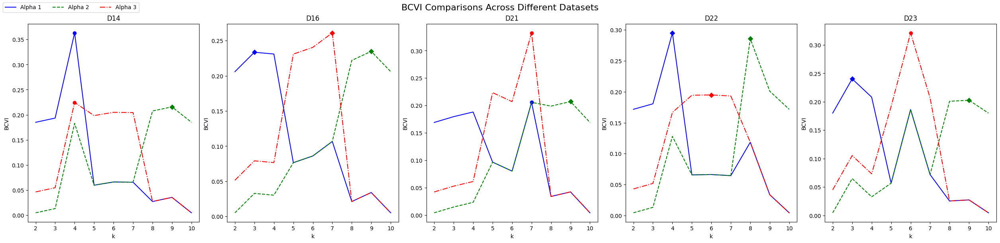

In [54]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_WI_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_WI_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_WI_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_WI_alpha1["BCVI"].set_index("k", inplace=True)
    result_WI_alpha2["BCVI"].set_index("k", inplace=True)
    result_WI_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_WI_alpha1["BCVI"]
    BCVIs2 = result_WI_alpha2["BCVI"]
    BCVIs3 = result_WI_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [48]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR, và WI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["WI"].set_index("k", inplace=True)
    result_alpha2["WI"].set_index("k", inplace=True)
    result_alpha3["WI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    WI1 = result_alpha1["WI"]
    WI2 = result_alpha2["WI"]
    WI3 = result_alpha3["WI"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "WI Alpha 1": WI1["WI"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "WI Alpha 2": WI2["WI"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "WI Alpha 3": WI3["WI"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D14 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  WI Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.184975     0.000044    0.000000      0.004624     0.000001   
1   3      0.193384     0.000046    0.407941      0.013034     0.000004   
2   4      0.363165     0.000068    8.643810      0.182814     0.000044   
3   5      0.059635     0.000016    0.649611      0.059635     0.000016   
4   6      0.066085     0.000018    0.962472      0.066085     0.000018   
5   7      0.065616     0.000018    0.939732      0.065616     0.000018   
6   8      0.027124     0.000008    1.091450      0.207475     0.000048   
7   9      0.035391     0.000010    1.492443      0.215741     0.000049   
8  10      0.004624     0.000001    0.000000      0.184975     0.000044   

   WI Alpha 2  BCVI Alpha 3  Var Alpha 3  WI Alpha 3  
0    0.000000      0.046244     0.000013    0.000000  
1    0.407941      0.054653     0.000015    0.407941  
2    8.643810      0.224434     0.000051    

#### Case 3

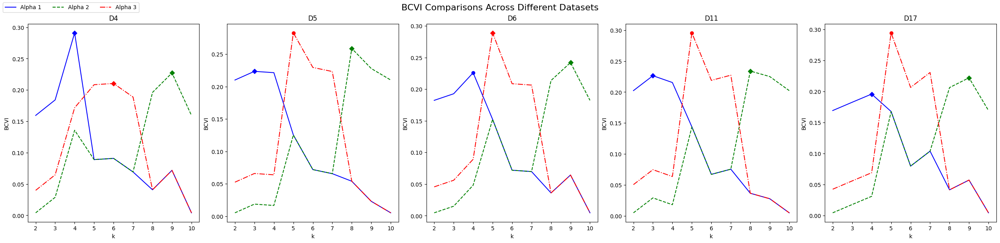

In [56]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_WI_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_WI_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_WI_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_WI_alpha1["BCVI"].set_index("k", inplace=True)
    result_WI_alpha2["BCVI"].set_index("k", inplace=True)
    result_WI_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_WI_alpha1["BCVI"]
    BCVIs2 = result_WI_alpha2["BCVI"]
    BCVIs3 = result_WI_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [49]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR, và WI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["WI"].set_index("k", inplace=True)
    result_alpha2["WI"].set_index("k", inplace=True)
    result_alpha3["WI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    WI1 = result_alpha1["WI"]
    WI2 = result_alpha2["WI"]
    WI3 = result_alpha3["WI"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "WI Alpha 1": WI1["WI"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "WI Alpha 2": WI2["WI"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "WI Alpha 3": WI3["WI"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D4 (True Cluster Count: 5) =====
    k  BCVI Alpha 1   Var Alpha 1  WI Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.159376  2.178908e-05    0.000000      0.003984  6.454210e-07   
1   3      0.184120  2.443109e-05    0.606116      0.028729  4.538119e-06   
2   4      0.291116  3.356270e-05    3.226980      0.135725  1.907778e-05   
3   5      0.088885  1.317096e-05    1.201260      0.088885  1.317096e-05   
4   6      0.090838  1.343145e-05    1.249089      0.090838  1.343145e-05   
5   7      0.069189  1.047397e-05    0.718795      0.069189  1.047397e-05   
6   8      0.040716  6.352275e-06    0.899741      0.196107  2.563936e-05   
7   9      0.071776  1.083547e-05    1.660551      0.227167  2.855266e-05   
8  10      0.003984  6.454210e-07    0.000000      0.159376  2.178908e-05   

   WI Alpha 2  BCVI Alpha 3   Var Alpha 3  WI Alpha 3  
0    0.000000      0.039844  6.221839e-06    0.000000  
1    0.606116      0.064588  9.825915e-06    0.606116  
2    3.226980      0.1

#### Case 4

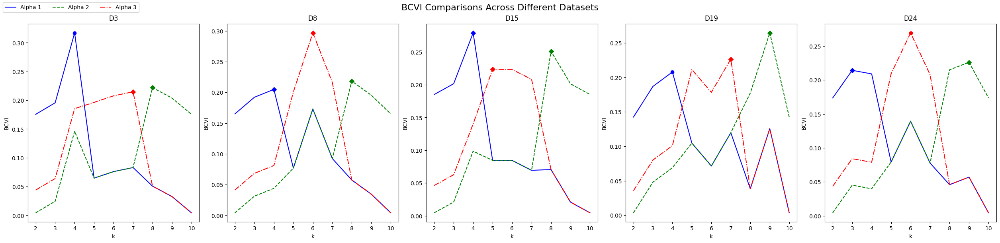

In [58]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_WI_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_WI_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_WI_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_WI_alpha1["BCVI"].set_index("k", inplace=True)
    result_WI_alpha2["BCVI"].set_index("k", inplace=True)
    result_WI_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_WI_alpha1["BCVI"]
    BCVIs2 = result_WI_alpha2["BCVI"]
    BCVIs3 = result_WI_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [50]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR, và WI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["WI"].set_index("k", inplace=True)
    result_alpha2["WI"].set_index("k", inplace=True)
    result_alpha3["WI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    WI1 = result_alpha1["WI"]
    WI2 = result_alpha2["WI"]
    WI3 = result_alpha3["WI"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "WI Alpha 1": WI1["WI"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "WI Alpha 2": WI2["WI"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "WI Alpha 3": WI3["WI"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D3 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  WI Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.175567     0.000034    0.000000      0.004389     0.000001   
1   3      0.195611     0.000037    0.612984      0.024433     0.000006   
2   4      0.317190     0.000051    4.331224      0.146012     0.000029   
3   5      0.064720     0.000014    0.636984      0.064720     0.000014   
4   6      0.076027     0.000016    0.982773      0.076027     0.000016   
5   7      0.083083     0.000018    1.198583      0.083083     0.000018   
6   8      0.050754     0.000011    1.417975      0.221932     0.000041   
7   9      0.032658     0.000007    0.864552      0.203836     0.000038   
8  10      0.004389     0.000001    0.000000      0.175567     0.000034   

   WI Alpha 2  BCVI Alpha 3  Var Alpha 3  WI Alpha 3  
0    0.000000      0.043892     0.000010    0.000000  
1    0.612984      0.063935     0.000014    0.612984  
2    4.331224      0.185515     0.000035    4

#### Case 5

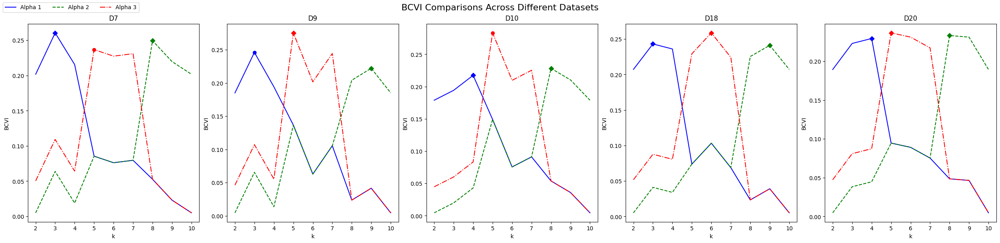

In [60]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_WI_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_WI_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_WI_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_WI_alpha1["BCVI"].set_index("k", inplace=True)
    result_WI_alpha2["BCVI"].set_index("k", inplace=True)
    result_WI_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_WI_alpha1["BCVI"]
    BCVIs2 = result_WI_alpha2["BCVI"]
    BCVIs3 = result_WI_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()

In [51]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, VAR, và WI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["WI"].set_index("k", inplace=True)
    result_alpha2["WI"].set_index("k", inplace=True)
    result_alpha3["WI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    WI1 = result_alpha1["WI"]
    WI2 = result_alpha2["WI"]
    WI3 = result_alpha3["WI"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "WI Alpha 1": WI1["WI"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "WI Alpha 2": WI2["WI"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "WI Alpha 3": WI3["WI"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D7 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  WI Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.201761     0.000072    0.000000      0.005044     0.000002   
1   3      0.260547     0.000086    2.118031      0.063831     0.000027   
2   4      0.215605     0.000075    0.498784      0.018888     0.000008   
3   5      0.085456     0.000035    1.261603      0.085456     0.000035   
4   6      0.076170     0.000031    0.927003      0.076170     0.000031   
5   7      0.079623     0.000033    1.051435      0.079623     0.000033   
6   8      0.052712     0.000022    1.717434      0.249429     0.000083   
7   9      0.023082     0.000010    0.649898      0.219799     0.000076   
8  10      0.005044     0.000002    0.000000      0.201761     0.000072   

   WI Alpha 2  BCVI Alpha 3  Var Alpha 3  WI Alpha 3  
0    0.000000      0.050440     0.000021    0.000000  
1    2.118031      0.109227     0.000043    2.118031  
2    0.498784      0.064284     0.000027    0

### DB_Index

#### Index

In [32]:
import numpy as np
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist, squareform
from sklearn.preprocessing import StandardScaler
import pandas as pd

def B_DB_IDX(x, kmax, method='kmeans', p=2, q=2, nstart=100, alpha=None, mult_alpha=1/2):
    """
    Bayesian Clustering Validity Index (B-DB Index) Implementation with default or custom alpha.
    
    Parameters:
        x (numpy.ndarray): Input data as a 2D array.
        kmax (int): Maximum number of clusters.
        method (str): Clustering method ("kmeans", "hclust_complete", "hclust_average", "hclust_single").
        p (int or float): Minkowski distance parameter for inter-cluster distance calculation.
        q (int or float): Parameter for intra-cluster distance calculation.
        nstart (int): Number of initializations for KMeans.
        alpha (list or 'default'): Custom alpha values or 'default' for equal distribution.
        mult_alpha (float): Multiplicative factor for alpha adjustment.
    
    Returns:
        dict: Contains BCVI, VarBCVI, and DB index DataFrames.
    """
    if method == "kmeans" and not isinstance(nstart, int):
        raise ValueError("Argument 'nstart' must be an integer")

    # Chuẩn hóa dữ liệu đầu vào
    scaler = StandardScaler()
    x = scaler.fit_transform(x)  # Chuẩn hóa dữ liệu
    
    # Handle the alpha parameter
    n = len(x)
    kmin = 2
    # Check if alpha is None and set default value if needed
    if alpha is None:
        alpha = [1] * (kmax - kmin + 1)  # Default alpha: a constant value of 1 for all k
    
    if len(alpha) != (kmax - kmin + 1):  # Check if alpha length matches number of clusters
        raise ValueError("The length of alpha must be equal to the number of clusters from kmin to kmax")
    
    adj_alpha = np.array(alpha) * (n ** mult_alpha)
    
    # Initialize results
    db = []
    
    # Run clustering for each k
    for k in range(kmin, kmax + 1):
        centroid = np.zeros((k, x.shape[1]))
        if method == "kmeans":
            kmeans = KMeans(n_clusters=k, n_init=nstart).fit(x)
            cluss = kmeans.labels_
            centroid = kmeans.cluster_centers_
            xnew = centroid[cluss, :]
        elif method.startswith("hclust"):
            from scipy.cluster.hierarchy import linkage, cut_tree
            Z = linkage(x, method=method.split('_')[1])
            cluss = cut_tree(Z, n_clusters=k).flatten()
            for j in range(k):
                if np.sum(cluss == j) == 1:
                    centroid[j, :] = x[cluss == j, :][0]
                else:
                    centroid[j, :] = np.mean(x[cluss == j, :], axis=0)
            xnew = centroid[cluss, :]
        
        # Intra-cluster distance Si, q
        S = np.zeros(k)
        sizecluss = np.bincount(cluss)
        
        for i in range(k):
            C = sizecluss[i]
            if C > 1:
                cenI = xnew[cluss == i, :]
                S[i] = (np.sum(np.sqrt(np.sum((x[cluss == i] - cenI) ** 2, axis=1)) ** q) / C) ** (1 / q)
            else:
                S[i] = 0
        
        # Inter-cluster distance
        m = squareform(pdist(centroid, metric='minkowski', p=p))
        r = np.zeros(k)
        rs = np.zeros(k)
        
        for i in range(k):
            C = sizecluss[i]
            r[i] = np.max((S[i] + S[np.arange(k) != i]) / m[i, m[i, :] != 0])
            rs[i] = np.max((S[i] + S[np.arange(k) != i])) / np.min(m[i, m[i, :] != 0])
        
        db.append(np.mean(r))
    
    # Normalize and compute BCVI
    CVI_dframe = pd.DataFrame({"k": np.arange(kmin, kmax + 1), "Index": db})
    maxGI = np.max(CVI_dframe["Index"])
    rk = (maxGI - np.array(CVI_dframe["Index"])) / np.sum(maxGI - np.array(CVI_dframe["Index"]))
    nrk = n * rk
    ex = (adj_alpha + nrk) / (np.sum(adj_alpha) + n)
    var = ((adj_alpha + nrk) * (np.sum(adj_alpha) + n - adj_alpha - nrk)) / ((np.sum(adj_alpha) + n) ** 2 * (np.sum(adj_alpha) + n + 1))
    
    BCVI = pd.DataFrame({"k": np.arange(kmin, kmax + 1), "BCVI": ex})
    VarBCVI = pd.DataFrame({"k": np.arange(kmin, kmax + 1), "Var": var})
    
    DB_list ={
        "BCVI": BCVI,
        "VarBCVI": VarBCVI,
        "Index": CVI_dframe
    }
    
    return DB_list


#### DB_25file

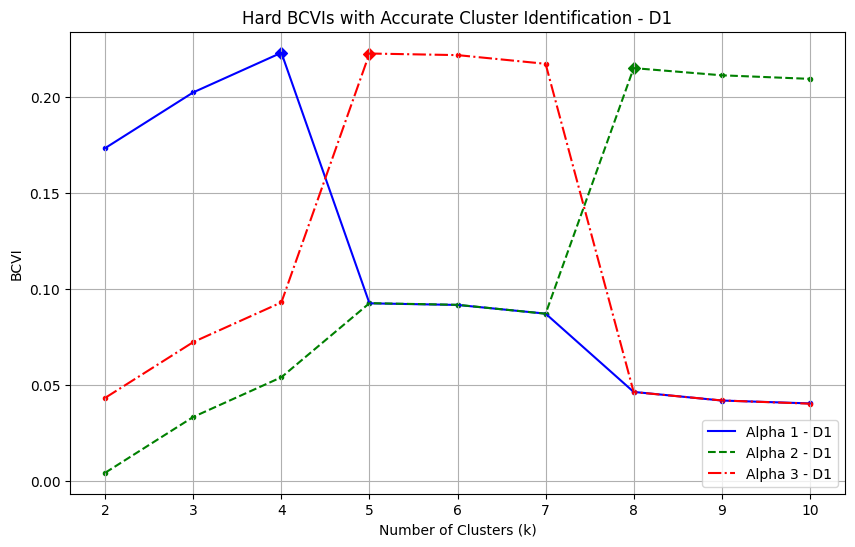

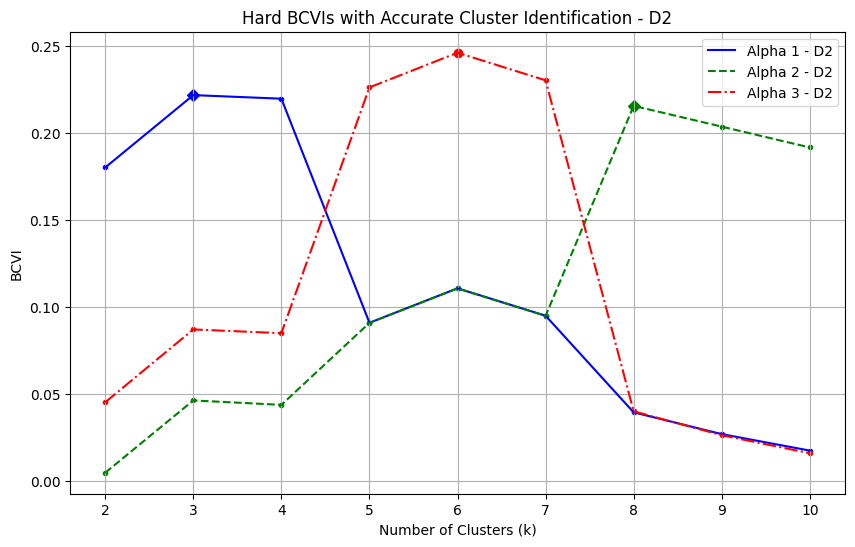

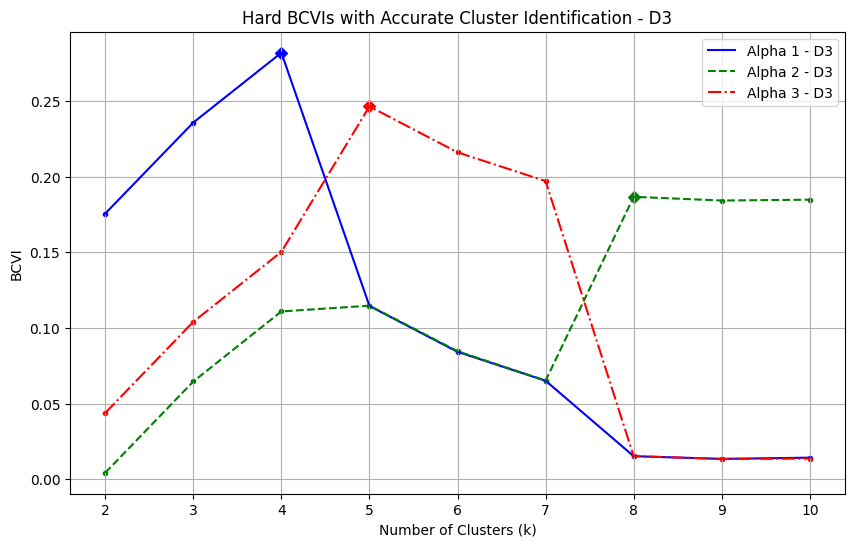

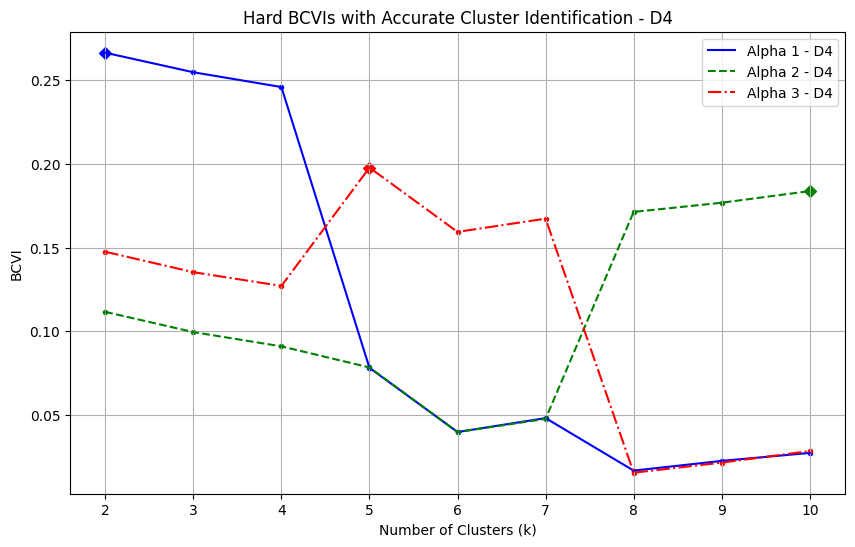

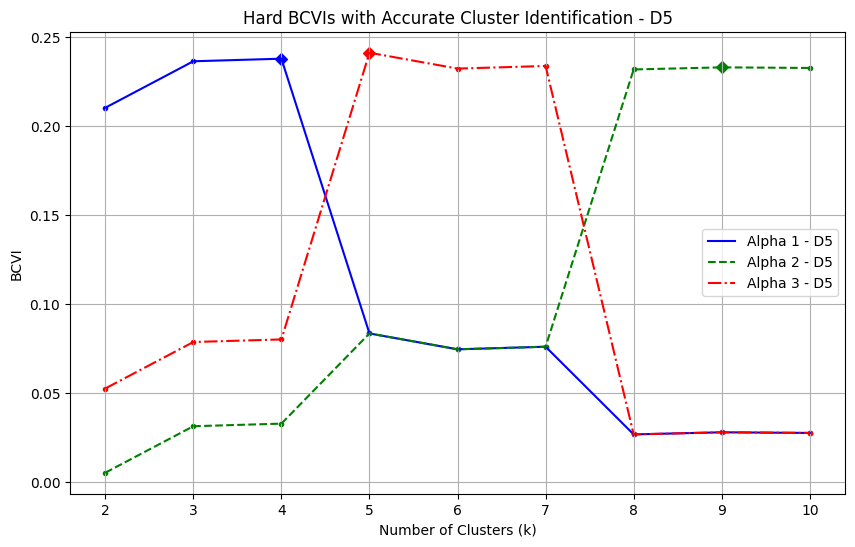

...

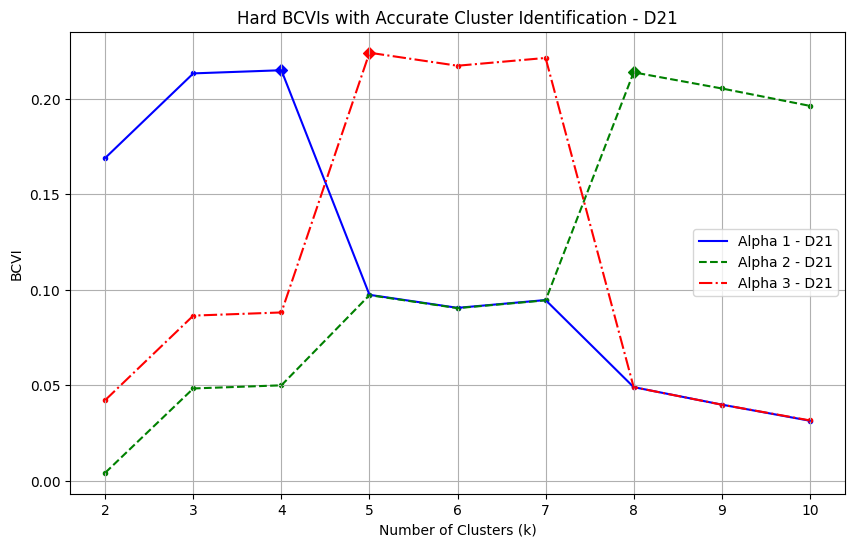

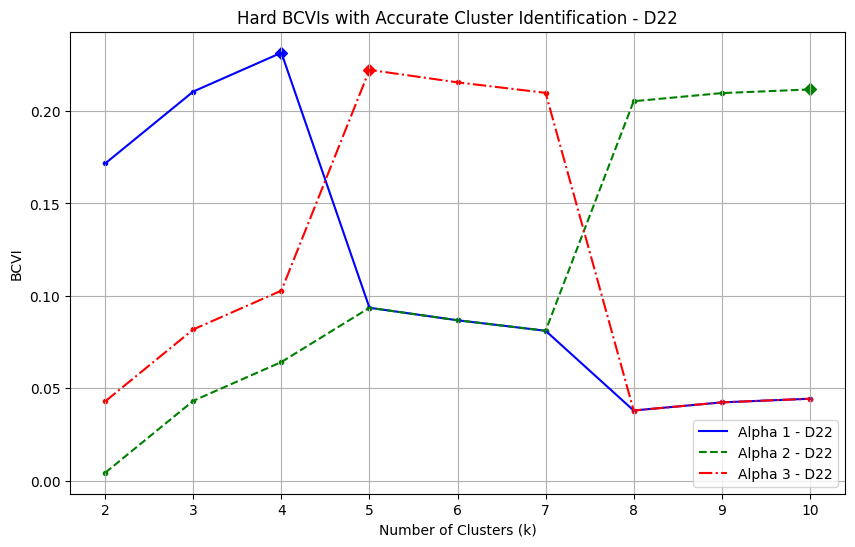

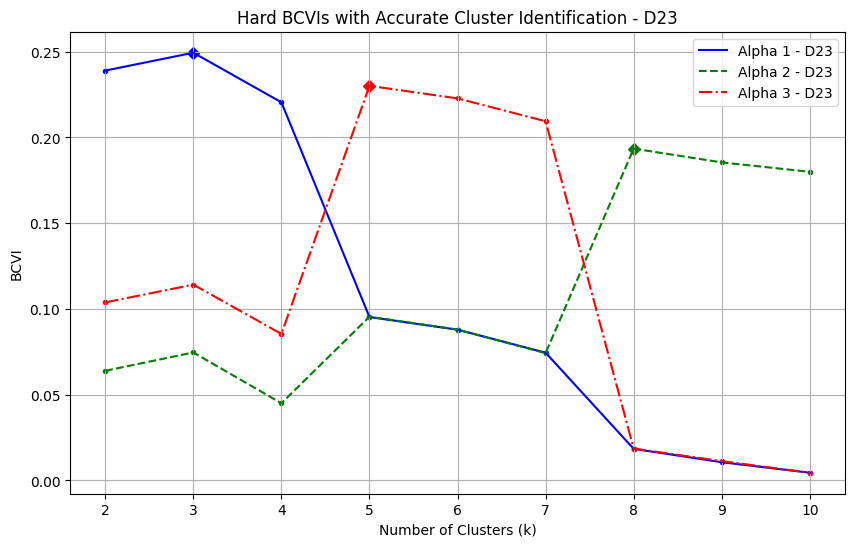

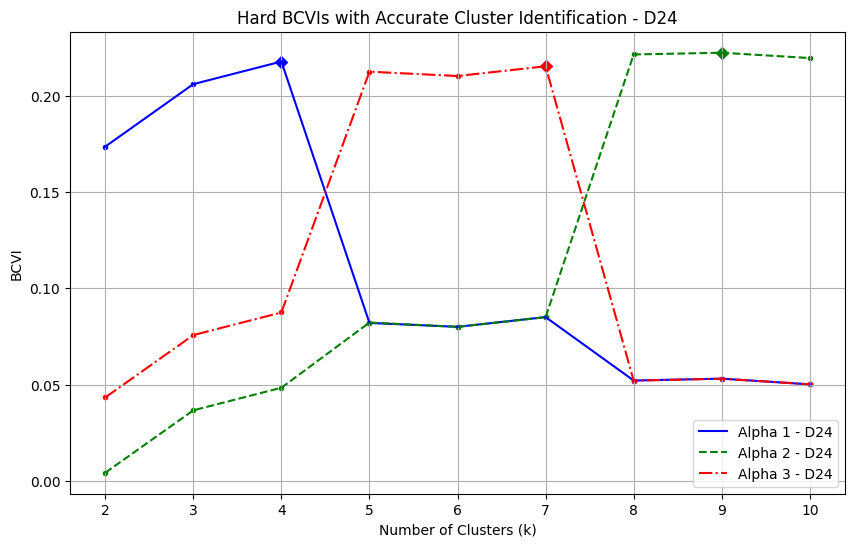

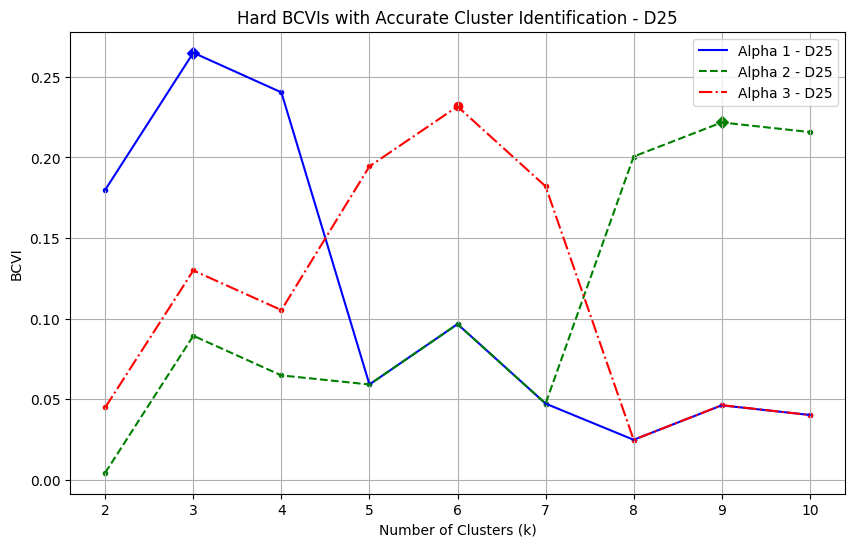

In [90]:
import pandas as pd
import matplotlib.pyplot as plt

# Thực hiện vòng lặp từ 1 đến 25
for i in range(1, 26):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/AI_Datasets/D{i}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha3["BCVI"].set_index("k", inplace=True)
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Số cụm labels thực tế (true cluster count)
    true_cluster_count = 6  # Thay số này bằng số cụm thực tế

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    plt.figure(figsize=(10, 6))

    # Vẽ các đường BCVI
    plt.plot(BCVIs1.index, BCVIs1["BCVI"], label=f"Alpha 1 - D{i}", color='b', linestyle='-')
    plt.plot(BCVIs2.index, BCVIs2["BCVI"], label=f"Alpha 2 - D{i}", color='g', linestyle='--')
    plt.plot(BCVIs3.index, BCVIs3["BCVI"], label=f"Alpha 3 - D{i}", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        # Alpha 1
        if k == max_k1:  # Nếu k là max đối với Alpha 1
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        else:
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker='.', label=None)

        # Alpha 2
        if k == max_k2:  # Nếu k là max đối với Alpha 2
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        else:
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker='.', label=None)

        # Alpha 3
        if k == max_k3:  # Nếu k là max đối với Alpha 3
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)
        else:
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker='.', label=None)

    # Thêm tiêu đề và nhãn trục
    plt.title(f"Hard BCVIs with Accurate Cluster Identification - D{i}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("BCVI")

    # Hiển thị legend
    plt.legend()

    # Hiển thị lưới
    plt.grid(True)

    # Hiển thị biểu đồ
    plt.show()


#### Case 1

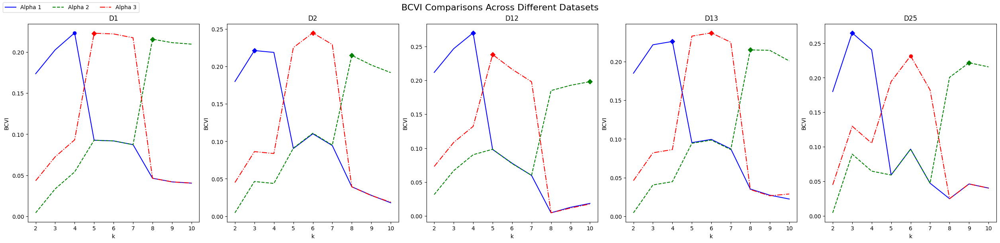

In [86]:
import pandas as pd
import matplotlib.pyplot as plt

# Danh sách các chỉ số file và true_cluster_count tương ứng
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [44]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D1 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.173566     0.000032       1.144661      0.004339  9.678513e-07   
1   3      0.202659     0.000036       0.841794      0.033343  7.220442e-06   
2   4      0.223342     0.000039       0.626469      0.053963  1.143652e-05   
3   5      0.092723     0.000019       0.631101      0.092559  1.881617e-05   
4   6      0.091877     0.000019       0.639903      0.091729  1.866434e-05   
5   7      0.087342     0.000018       0.687123      0.087207  1.783259e-05   
6   8      0.046431     0.000010       0.706468      0.215529  3.787689e-05   
7   9      0.041850     0.000009       0.754162      0.211772  3.739487e-05   
8  10      0.040210     0.000009       0.771231      0.209560  3.710821e-05   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       1.144661      0.043392     0.000009       1.144661  
1       0.841794      0.072408     0.000015     

#### Case 2

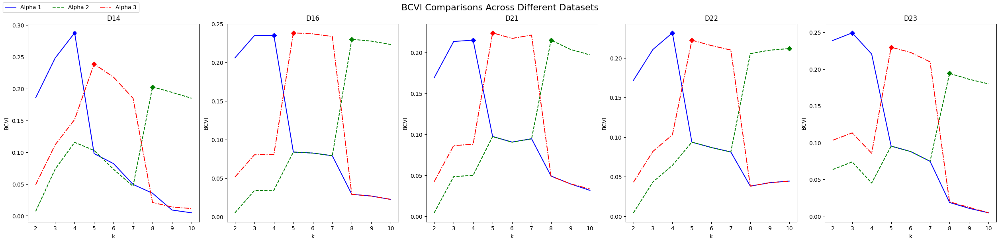

In [85]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [43]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D14 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.184975     0.000044       1.146416      0.008164     0.000002   
1   3      0.251266     0.000055       0.792425      0.069984     0.000019   
2   4      0.293333     0.000061       0.567789      0.109214     0.000028   
3   5      0.100366     0.000026       0.857406      0.100256     0.000026   
4   6      0.083408     0.000022       0.947962      0.076809     0.000021   
5   7      0.047126     0.000013       1.141706      0.050637     0.000014   
6   8      0.019129     0.000005       1.068960      0.204912     0.000048   
7   9      0.012668     0.000004       1.103465      0.195048     0.000046   
8  10      0.007729     0.000002       1.129835      0.184975     0.000044   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       1.146416      0.046244     0.000013       1.146416  
1       0.792425      0.105077     0.000027       0.79242

#### Case 3

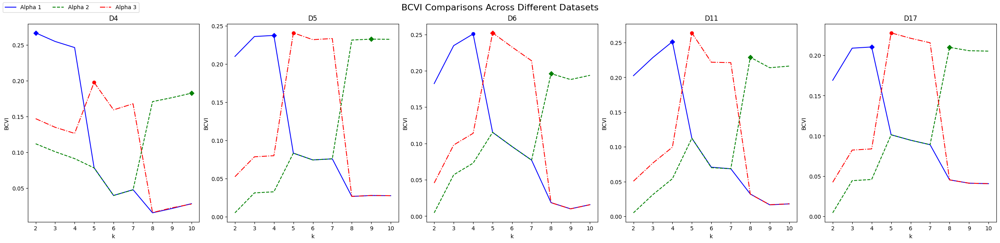

In [84]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [42]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D4 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.267741     0.000032       0.374950      0.111579     0.000016   
1   3      0.255552     0.000031       0.455146      0.099499     0.000015   
2   4      0.246946     0.000030       0.511773      0.090969     0.000013   
3   5      0.078436     0.000012       0.834032      0.078340     0.000012   
4   6      0.039844     0.000006       1.087951      0.039844     0.000006   
5   7      0.048040     0.000007       1.034024      0.047874     0.000007   
6   8      0.015549     0.000002       1.011859      0.171265     0.000023   
7   9      0.020935     0.000003       0.976420      0.177299     0.000024   
8  10      0.026958     0.000004       0.936796      0.183330     0.000024   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       0.374950      0.146544     0.000020       0.374950  
1       0.455146      0.134572     0.000019       0.455146

#### Case 4

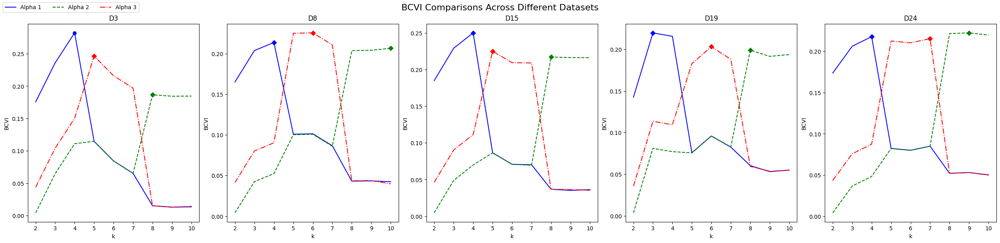

In [83]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [41]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D3 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.175567     0.000034       1.073952      0.004389     0.000001   
1   3      0.235944     0.000042       0.798958      0.064581     0.000014   
2   4      0.282281     0.000048       0.587905      0.110777     0.000023   
3   5      0.114842     0.000024       0.750798      0.114625     0.000024   
4   6      0.084411     0.000018       0.889400      0.084287     0.000018   
5   7      0.065260     0.000014       0.976625      0.065195     0.000014   
6   8      0.015364     0.000004       1.023966      0.186671     0.000036   
7   9      0.013555     0.000003       1.032203      0.184258     0.000035   
8  10      0.012775     0.000003       1.035756      0.185217     0.000035   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       1.073952      0.043892     0.000010       1.073952  
1       0.798958      0.104347     0.000022       0.798958

#### Case 5

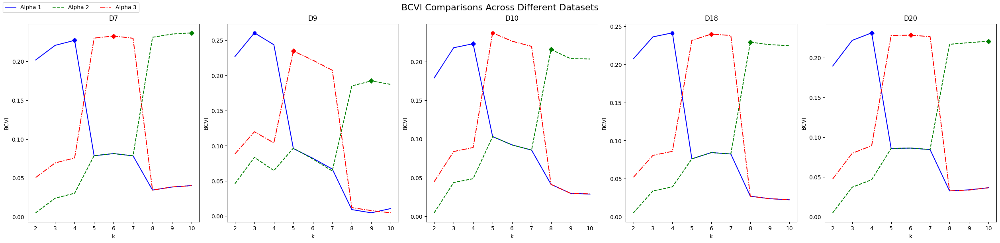

In [82]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [40]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VarBCVI"].set_index("k", inplace=True)
    result_alpha2["VarBCVI"].set_index("k", inplace=True)
    result_alpha3["VarBCVI"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VarBCVI"]
    Vars2 = result_alpha2["VarBCVI"]
    Vars3 = result_alpha3["VarBCVI"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D7 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.201761     0.000072       1.244927      0.005044     0.000002   
1   3      0.220546     0.000077       0.912864      0.023805     0.000010   
2   4      0.226963     0.000078       0.799420      0.030214     0.000013   
3   5      0.078550     0.000032       0.748028      0.078513     0.000032   
4   6      0.081436     0.000033       0.697012      0.081396     0.000033   
5   7      0.078366     0.000032       0.751288      0.078329     0.000032   
6   8      0.034274     0.000015       0.728227      0.230953     0.000079   
7   9      0.038211     0.000016       0.658645      0.235011     0.000080   
8  10      0.039893     0.000017       0.628899      0.236735     0.000081   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0       1.244927      0.050440     0.000021       1.244927  
1       0.912864      0.069260     0.000029       0.912864

## Method Soft Clustering

### KWON2_Index

#### Index

In [70]:
import numpy as np
from sklearn.mixture import GaussianMixture
from fcmeans import FCM
import pandas as pd
from sklearn.preprocessing import StandardScaler  # Thêm thư viện chuẩn hóa

def B_KWON2_IDX(x, kmax, method="FCM", fzm=2, nstart=20, iter=100, alpha=None, mult_alpha=1/2, normalize=True):
    if x is None:
        raise ValueError("Missing input argument. A numeric data frame or matrix is required")
    if not isinstance(kmax, int) or kmax <= 0:
        raise ValueError("Argument 'kmax' must be a positive integer")
    if kmax > x.shape[0]:
        raise ValueError("The maximum number of clusters for consideration should be less than or equal to the number of data points in dataset.")
    
    if method not in ["FCM", "EM"]:
        raise ValueError("Argument 'method' should be one of 'FCM','EM'")
    
    n = x.shape[0]
    kmin = 2  # fixed value
    
    if alpha is None:
        # Default alpha: a constant value of 1 for all k
        alpha = [1] * (kmax - kmin + 1)
    if len(alpha) != (kmax - kmin + 1):
        raise ValueError("Length of alpha must match the range kmin to kmax.")
    
    # Chuẩn hóa dữ liệu nếu normalize=True
    if normalize:
        scaler = StandardScaler()
        x = scaler.fit_transform(x)
    
    adj_alpha = alpha * (n)**mult_alpha
    kwon2 = []
    
    for k in range(kmin, kmax + 1):
        if method == "EM":
            # EM Algorithm (Gaussian Mixture Model)
            EM_model = GaussianMixture(n_components=k, max_iter=iter, n_init=nstart)
            EM_model.fit(x)
            m = EM_model.predict_proba(x)
            c = EM_model.means_
        else:
            # FCM Algorithm
            wd = np.inf
            for nr in range(nstart):
                FCM_model = FCM(n_clusters=k, m=fzm, max_iter=iter)
                FCM_model.fit(x)
                
                # Calculate the error function manually
                error = np.sum((FCM_model.u**fzm) * np.sum((x[:, None, :] - FCM_model.centers[None, :, :])**2, axis=2))
                if error < wd:
                    wd = error
                    FCM_model2 = FCM_model
            m = FCM_model2.u
            c = FCM_model2.centers
        
        d2 = np.sum((c - np.mean(x, axis=0))**2, axis=1)
        d3 = []
        d4 = []
        w1 = (n - k + 1) / n
        w2 = (k / (k - 1))**np.sqrt(2)
        w3 = (n * k) / (n - k + 1)**2
        
        for j in range(k):
            center = np.tile(c[j, :], (n, 1))
            d4.append(np.sum((m[:, j]**(2**np.sqrt(fzm / 2))) * np.sum((x - center)**2, axis=1)))
        
        s = 0
        for i in range(k - 1):
            for j in range(i + 1, k):
                d3.append(np.sum((c[i, :] - c[j, :])**2))
                s += 1
        
        kwon2_value = w1 * ((w2 * np.sum(d4)) + (np.sum(d2) / np.max(d2)) + w3) / (np.min(d3) + 1 / k + 1 / (k**(fzm - 1)))
        kwon2.append(kwon2_value)
    
    CVI_dframe = pd.DataFrame({"C": range(kmin, kmax + 1), "Index": kwon2})
    maxGI = np.max(CVI_dframe["Index"])
    rk = (maxGI - CVI_dframe["Index"]) / np.sum(maxGI - CVI_dframe["Index"])
    nrk = n * rk
    ex = (adj_alpha + nrk) / (np.sum(adj_alpha) + n)
    var = ((adj_alpha + nrk) * (np.sum(adj_alpha) + n - adj_alpha - nrk)) / ((np.sum(adj_alpha) + n)**2 * (np.sum(adj_alpha) + n + 1))
    
    BCVI = pd.DataFrame({"k": range(kmin, kmax + 1), "BCVI": ex})
    VarBCVI = pd.DataFrame({"k": range(kmin, kmax + 1), "Var": var})
    
    CVI_dframe.columns = ["k", "KWON2"]
    KWON2_result = {"BCVI": BCVI, "VAR": VarBCVI, "Index": CVI_dframe}
    
    return KWON2_result


#### Plot_25File

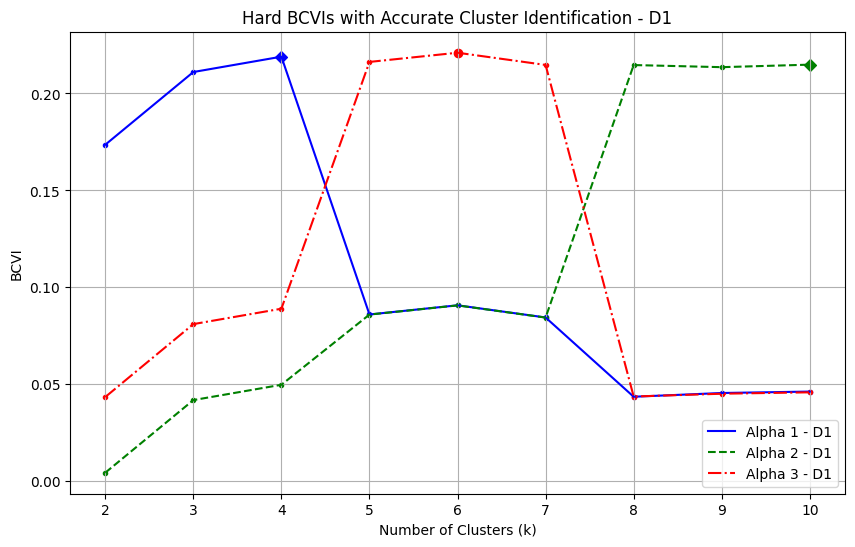

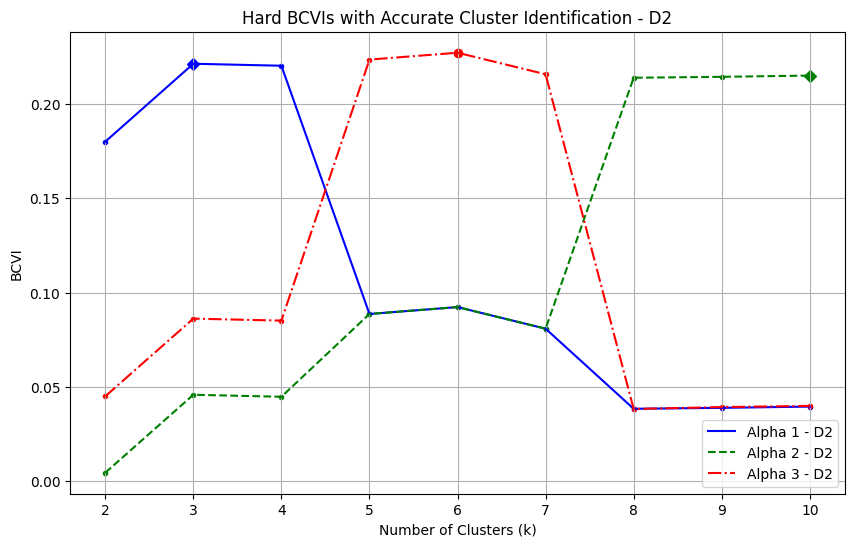

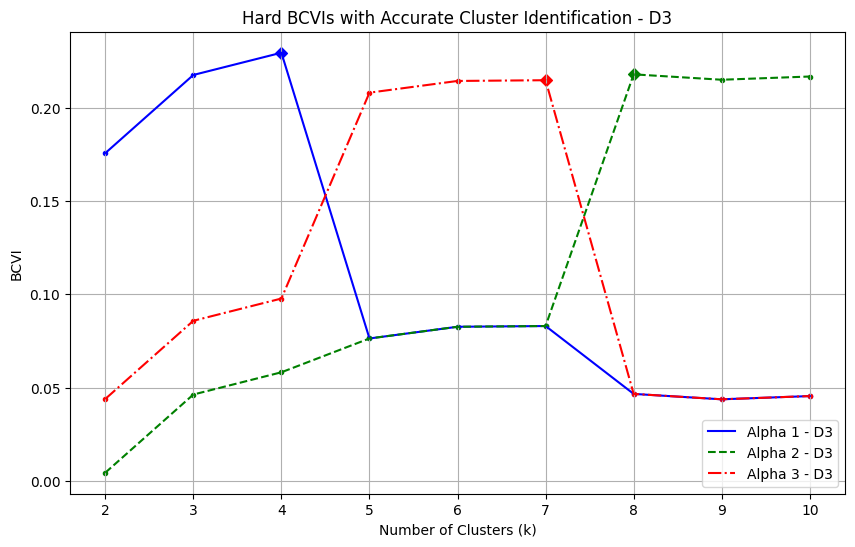

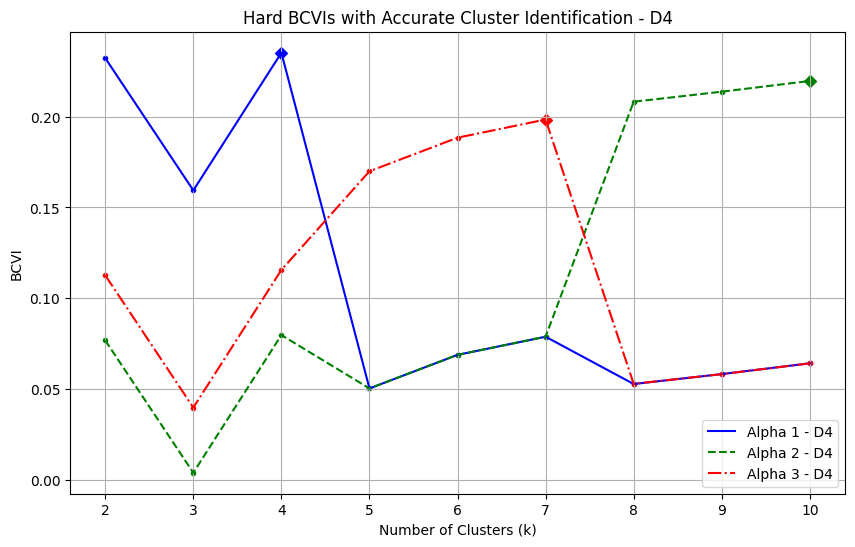

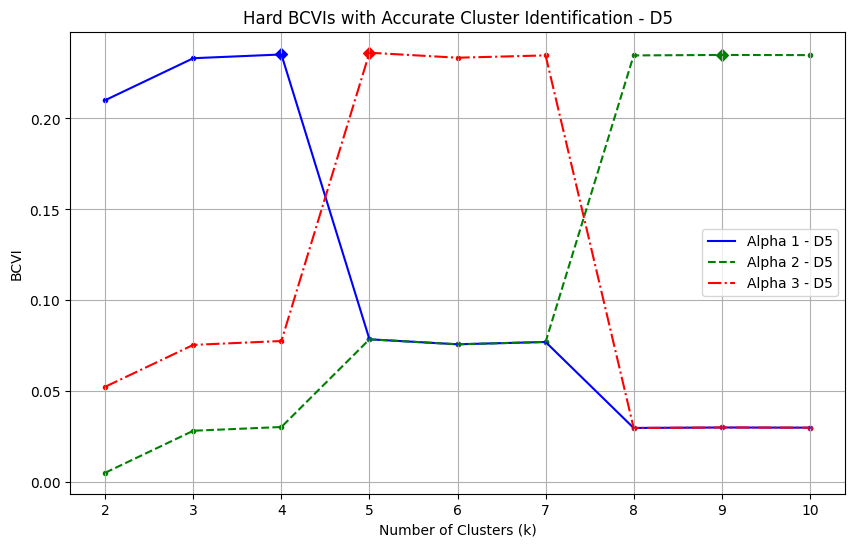

...

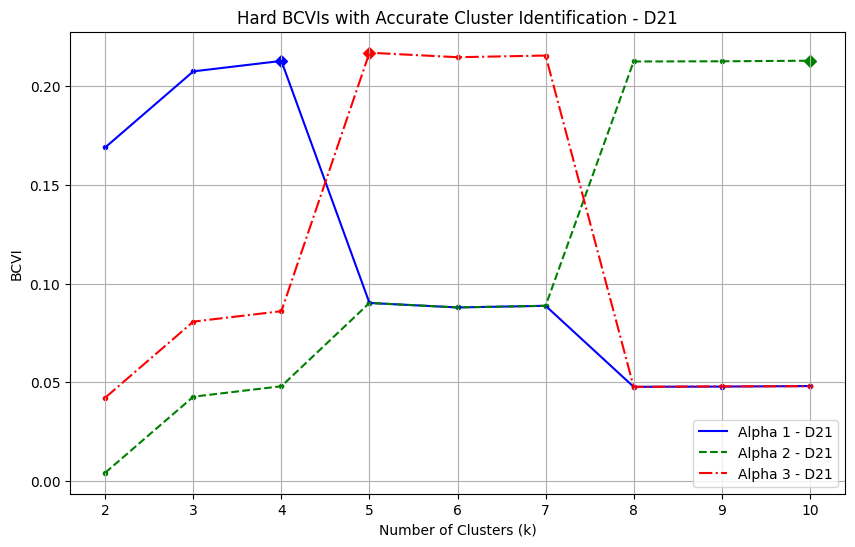

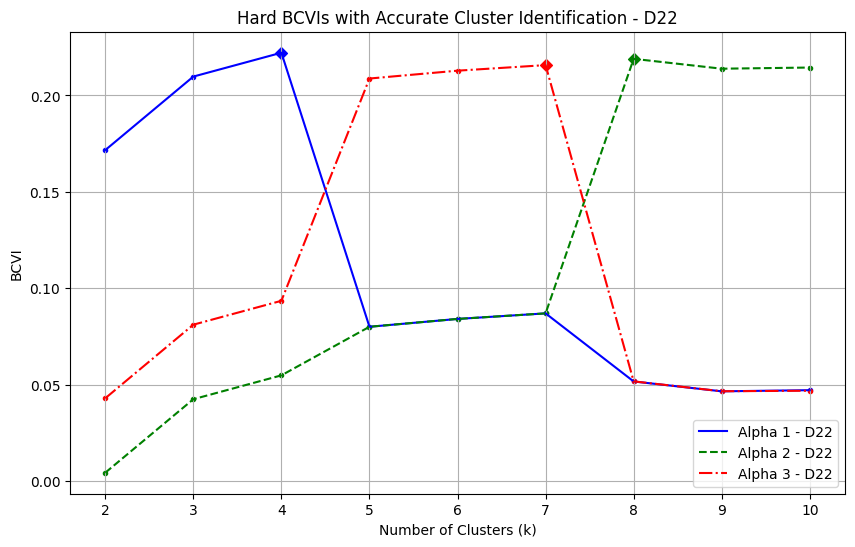

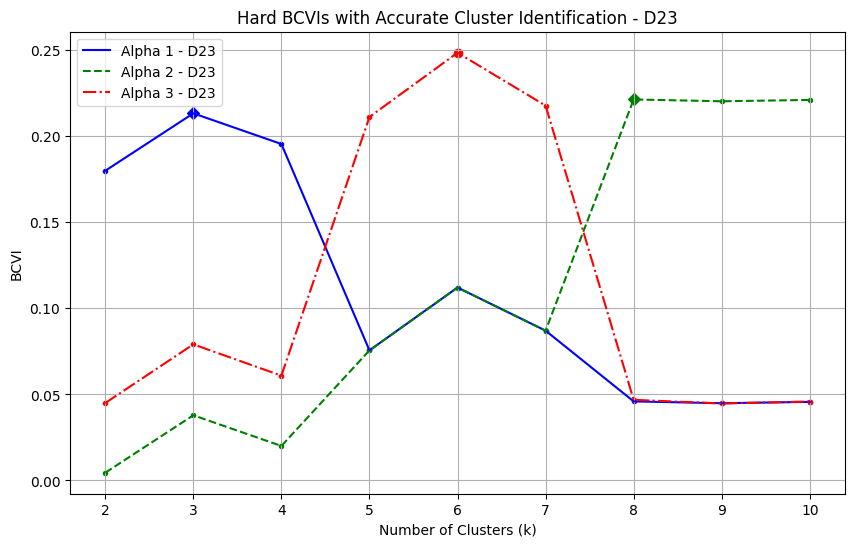

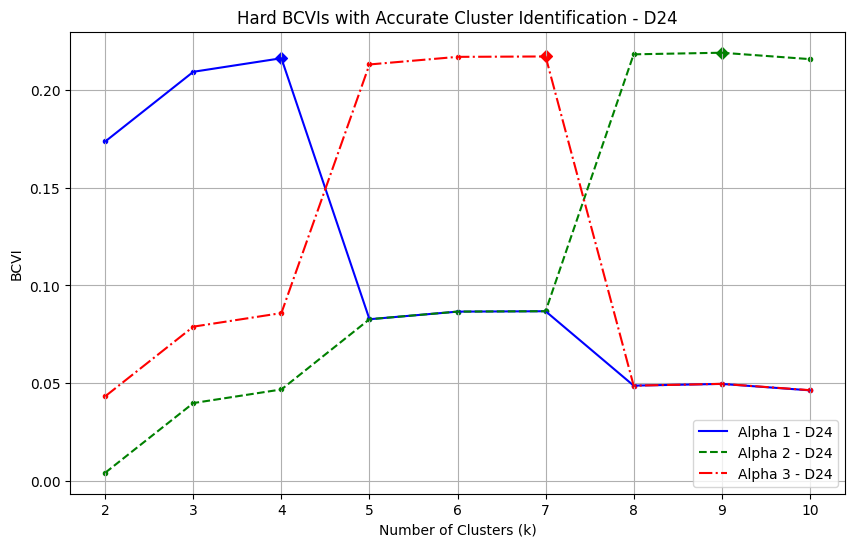

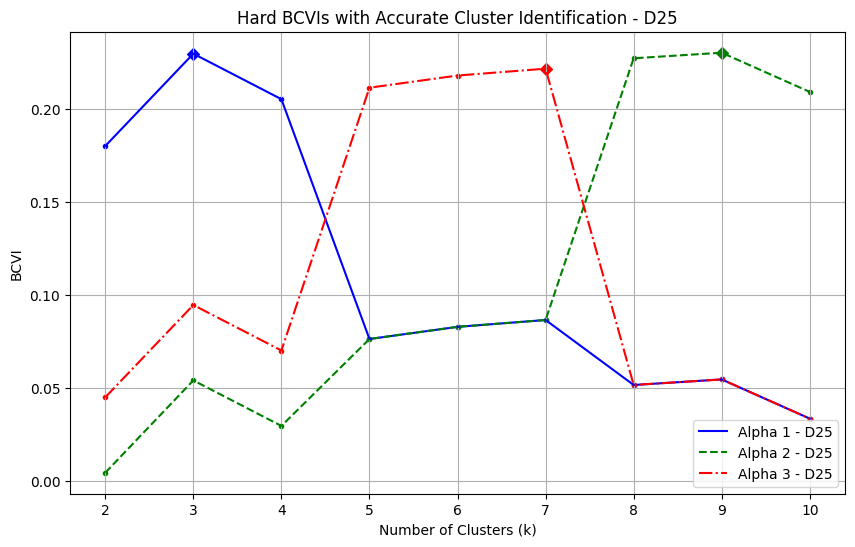

In [71]:
import pandas as pd
import matplotlib.pyplot as plt

# Thực hiện vòng lặp từ 1 đến 25
for i in range(1, 26):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/AI_Datasets/D{i}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha3["BCVI"].set_index("k", inplace=True)
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Số cụm labels thực tế (true cluster count)
    true_cluster_count = 6  # Thay số này bằng số cụm thực tế

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    plt.figure(figsize=(10, 6))

    # Vẽ các đường BCVI
    plt.plot(BCVIs1.index, BCVIs1["BCVI"], label=f"Alpha 1 - D{i}", color='b', linestyle='-')
    plt.plot(BCVIs2.index, BCVIs2["BCVI"], label=f"Alpha 2 - D{i}", color='g', linestyle='--')
    plt.plot(BCVIs3.index, BCVIs3["BCVI"], label=f"Alpha 3 - D{i}", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        # Alpha 1
        if k == max_k1:  # Nếu k là max đối với Alpha 1
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        else:
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker='.', label=None)

        # Alpha 2
        if k == max_k2:  # Nếu k là max đối với Alpha 2
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        else:
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker='.', label=None)

        # Alpha 3
        if k == max_k3:  # Nếu k là max đối với Alpha 3
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)
        else:
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker='.', label=None)

    # Thêm tiêu đề và nhãn trục
    plt.title(f"Hard BCVIs with Accurate Cluster Identification - D{i}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("BCVI")

    # Hiển thị legend
    plt.legend()

    # Hiển thị lưới
    plt.grid(True)

    # Hiển thị biểu đồ
    plt.show()


#### Case 1

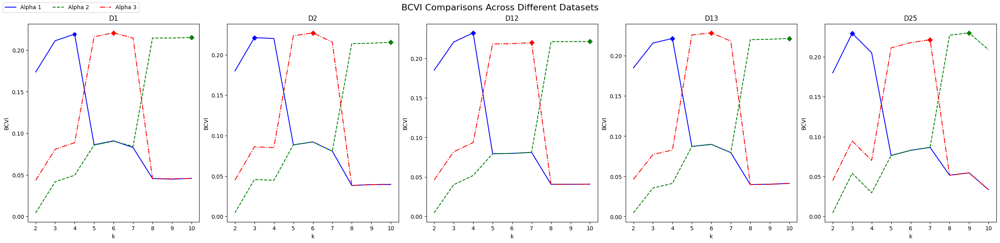

In [81]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [36]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Var, và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]["KWON2"]
    Index2 = result_alpha2["Index"]["KWON2"]
    Index3 = result_alpha3["Index"]["KWON2"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1.values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2.values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3.values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D1 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.173566     0.000032     878.934002      0.004339  9.678513e-07   
1   3      0.211196     0.000037     271.278662      0.042027  9.019373e-06   
2   4      0.219141     0.000038     142.981169      0.049985  1.063796e-05   
3   5      0.086125     0.000018     188.865914      0.086191  1.764451e-05   
4   6      0.090873     0.000019     112.201821      0.090946  1.852103e-05   
5   7      0.084565     0.000017     214.051802      0.084629  1.735435e-05   
6   8      0.043663     0.000009     243.926349      0.212953  3.754713e-05   
7   9      0.044528     0.000010     229.954176      0.213817  3.765804e-05   
8  10      0.046342     0.000010     200.658484      0.215113  3.782390e-05   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     878.934001      0.043392     0.000009     878.934078  
1     271.278402      0.080740     0.000017     

#### Case 2

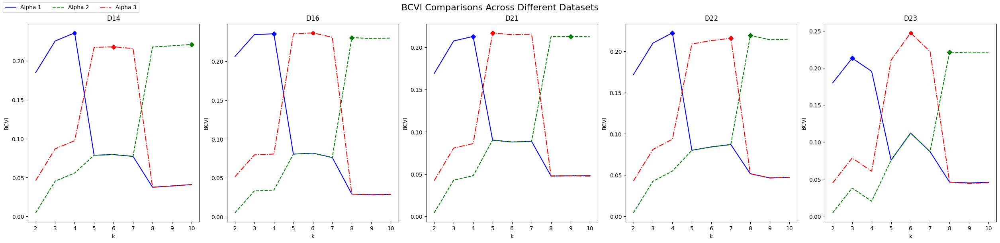

In [80]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [35]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Var, và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]["KWON2"]
    Index2 = result_alpha2["Index"]["KWON2"]
    Index3 = result_alpha3["Index"]["KWON2"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1.values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2.values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3.values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D14 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.184975     0.000044     566.578997      0.004624     0.000001   
1   3      0.225705     0.000051     177.568362      0.045343     0.000013   
2   4      0.236183     0.000053      77.492891      0.055822     0.000015   
3   5      0.078735     0.000021     256.258609      0.078727     0.000021   
4   6      0.079538     0.000021     248.585876      0.079531     0.000021   
5   7      0.077251     0.000021     270.427230      0.077244     0.000021   
6   8      0.037570     0.000011     251.920894      0.217913     0.000050   
7   9      0.039167     0.000011     236.666343      0.219511     0.000050   
8  10      0.040875     0.000011     220.352503      0.221285     0.000050   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     566.558486      0.046244     0.000013     566.579163  
1     177.597076      0.086977     0.000023     177.42273

#### Case 3

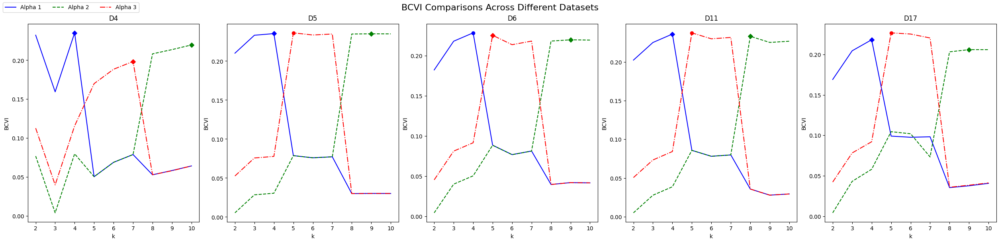

In [79]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [34]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Var, và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]["KWON2"]
    Index2 = result_alpha2["Index"]["KWON2"]
    Index3 = result_alpha3["Index"]["KWON2"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1.values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2.values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3.values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D4 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.232173     0.000029     187.672846      0.076756  1.152505e-05   
1   3      0.159376     0.000022     385.887501      0.003984  6.454210e-07   
2   4      0.235132     0.000029     179.615517      0.079714  1.193087e-05   
3   5      0.050365     0.000008     357.239554      0.050362  7.778079e-06   
4   6      0.068849     0.000010     306.913042      0.068837  1.042474e-05   
5   7      0.078831     0.000012     279.733879      0.078818  1.180828e-05   
6   8      0.052869     0.000008     252.782738      0.208151  2.680623e-05   
7   9      0.058207     0.000009     238.250108      0.213802  2.733751e-05   
8  10      0.064198     0.000010     221.937313      0.219576  2.786964e-05   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     187.672846      0.112635     0.000016     187.672845  
1     385.887487      0.039844     0.000006     

#### Case 4

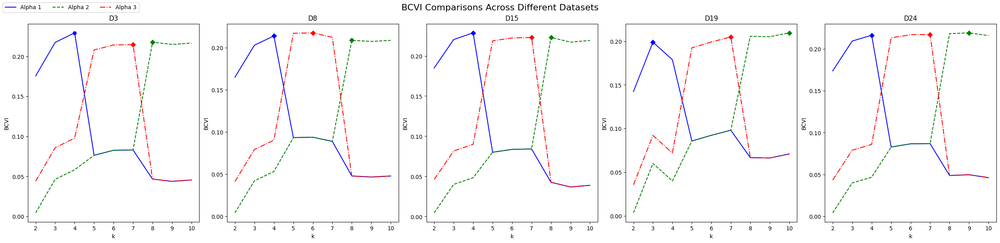

In [78]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [33]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Var, và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]["KWON2"]
    Index2 = result_alpha2["Index"]["KWON2"]
    Index3 = result_alpha3["Index"]["KWON2"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1.values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2.values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3.values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")

===== D3 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.175567     0.000034     683.924056      0.004389     0.000001   
1   3      0.217450     0.000040     238.233191      0.046273     0.000010   
2   4      0.229366     0.000041     111.424403      0.058190     0.000013   
3   5      0.076301     0.000017     339.042235      0.076302     0.000017   
4   6      0.082571     0.000018     272.320658      0.082572     0.000018   
5   7      0.082965     0.000018     268.129823      0.082966     0.000018   
6   8      0.046609     0.000010     234.642830      0.217789     0.000040   
7   9      0.043714     0.000010     265.453104      0.214893     0.000040   
8  10      0.045456     0.000010     246.915471      0.216624     0.000040   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     683.923841      0.043892     0.000010     683.924054  
1     238.233191      0.085775     0.000018     238.233166

#### Case 5

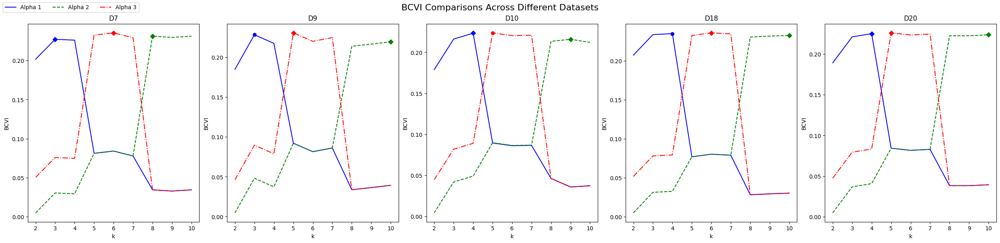

In [72]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [32]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI, Var, và Index
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]["KWON2"]
    Index2 = result_alpha2["Index"]["KWON2"]
    Index3 = result_alpha3["Index"]["KWON2"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1.values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2.values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3.values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D7 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.201761     0.000072     316.223794      0.005044     0.000002   
1   3      0.227166     0.000078     111.818105      0.030449     0.000013   
2   4      0.226075     0.000078     120.595503      0.029358     0.000013   
3   5      0.081209     0.000033      68.662287      0.081209     0.000033   
4   6      0.084090     0.000034      45.484335      0.084090     0.000034   
5   7      0.077840     0.000032      95.767503      0.077840     0.000032   
6   8      0.034524     0.000015      79.034677      0.231240     0.000079   
7   9      0.032839     0.000014      92.590020      0.229556     0.000079   
8  10      0.034497     0.000015      79.250959      0.231213     0.000079   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     316.223721      0.050440     0.000021     316.223721  
1     111.818239      0.075845     0.000031     111.818241

### WP_Index

#### Index

In [11]:
import numpy as np
from fcmeans import FCM
import pandas as pd
from sklearn.preprocessing import StandardScaler  # Thêm thư viện chuẩn hóa

def WPCI1(x, k, fzm):
    # Hàm tính WPCI1 cho một số cụm k nhất định
    fcm_model = FCM(n_clusters=k, m=fzm)
    fcm_model.fit(x)
    u = fcm_model.u  # ma trận phân bố mờ
    centers = fcm_model.centers  # tâm cụm
    n = x.shape[0]
    
    # Tính toán WPCI1 theo công thức
    dist_matrix = np.linalg.norm(x[:, None] - centers[None, :, :], axis=2)
    dist_sum = np.sum((u ** fzm) * dist_matrix, axis=0)
    
    wpci1_value = np.min(dist_sum) if np.isfinite(np.min(dist_sum)) else -np.inf
    return wpci1_value

def WPCI2(x, k, fzm):
    # Hàm tính WPCI2 cho một số cụm k nhất định
    fcm_model = FCM(n_clusters=k, m=fzm)
    fcm_model.fit(x)
    u = fcm_model.u  # ma trận phân bố mờ
    centers = fcm_model.centers  # tâm cụm
    n = x.shape[0]
    
    # Tính toán WPCI2 theo công thức
    dist_matrix = np.linalg.norm(x[:, None] - centers[None, :, :], axis=2)
    dist_sum = np.sum((u ** fzm) * dist_matrix, axis=0)
    
    wpci2_value = np.max(dist_sum) if np.isfinite(np.max(dist_sum)) else np.inf
    return wpci2_value

def WP(x, kmax, fzm=2, normalize=True):
    # Chuẩn hóa dữ liệu nếu normalize=True
    if normalize:
        scaler = StandardScaler()
        x = scaler.fit_transform(x)
        
    wp_values = []
    
    for k in range(2, kmax + 1):
        wpci1 = WPCI1(x, k, fzm)
        wpci2 = WPCI2(x, k, fzm)
        
        # Tính WP(k) theo các trường hợp
        if wpci1 == -np.inf:
            wp_value = wpci2  # Case 1
        elif wpci2 == np.inf:
            wp_value = wpci1  # Case 2
        else:
            wp_value = wpci1 + wpci2  # Case 3
        
        wp_values.append(wp_value)
    
    return wp_values

def B_WP_IDX(x, kmax, fzm=2, nstart=20, iter=100, alpha=None, mult_alpha=1/2, normalize=True):
    if x is None:
        raise ValueError("Missing input argument. A numeric data frame or matrix is required")
    if not isinstance(kmax, int) or kmax <= 0:
        raise ValueError("Argument 'kmax' must be a positive integer")
    if kmax > x.shape[0]:
        raise ValueError("The maximum number of clusters for consideration should be less than or equal to the number of data points in dataset.")
    
    # Chuẩn hóa dữ liệu nếu normalize=True
    if normalize:
        scaler = StandardScaler()
        x = scaler.fit_transform(x)
    
    n = x.shape[0]
    kmin = 2  # fixed value
    
    if alpha is None:
        # Default alpha: a constant value of 1 for all k
        alpha = [1] * (kmax - kmin + 1)
    if len(alpha) != (kmax - kmin + 1):
        raise ValueError("Length of alpha must match the range kmin to kmax.")
    
    adj_alpha = alpha * (n)**mult_alpha
    wp_index = []
    
    for k in range(kmin, kmax + 1):
        wpci1 = WPCI1(x, k, fzm)
        wpci2 = WPCI2(x, k, fzm)
        
        # Tính WP index cho k cụm
        if wpci1 == -np.inf:
            wp_value = wpci2  # Case 1
        elif wpci2 == np.inf:
            wp_value = wpci1  # Case 2
        else:
            wp_value = wpci1 + wpci2  # Case 3
        
        wp_index.append(wp_value)
    
    CVI_dframe = pd.DataFrame({"k": range(kmin, kmax + 1), "Index": wp_index})
    maxGI = np.max(CVI_dframe["Index"])
    rk = (maxGI - CVI_dframe["Index"]) / np.sum(maxGI - CVI_dframe["Index"])
    nrk = n * rk
    ex = (adj_alpha + nrk) / (np.sum(adj_alpha) + n)
    var = ((adj_alpha + nrk) * (np.sum(adj_alpha) + n - adj_alpha - nrk)) / ((np.sum(adj_alpha) + n)**2 * (np.sum(adj_alpha) + n + 1))
    
    BCVI = pd.DataFrame({"k": range(kmin, kmax + 1), "BCVI": ex})
    VarBCVI = pd.DataFrame({"k": range(kmin, kmax + 1), "Var": var})
    
    BCVI_result = {"BCVI": BCVI, "VAR": VarBCVI, "Index": CVI_dframe}
    
    return BCVI_result


#### WP_25File

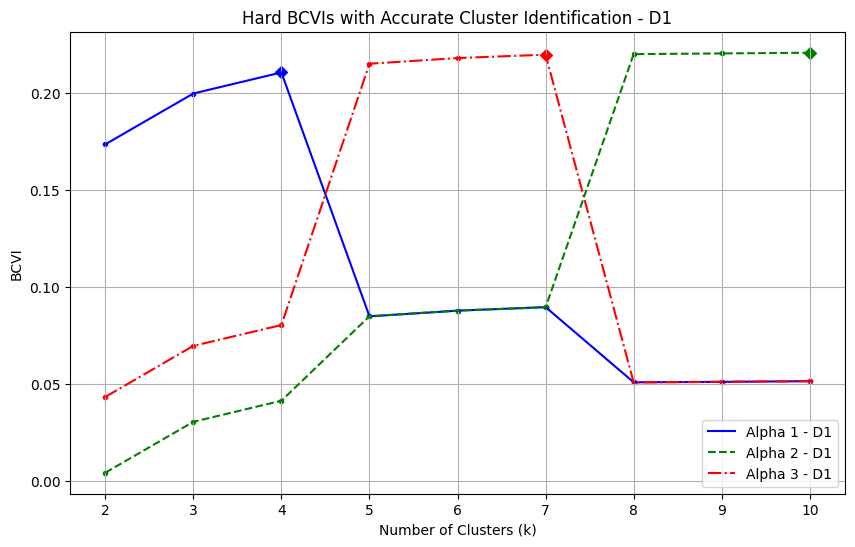

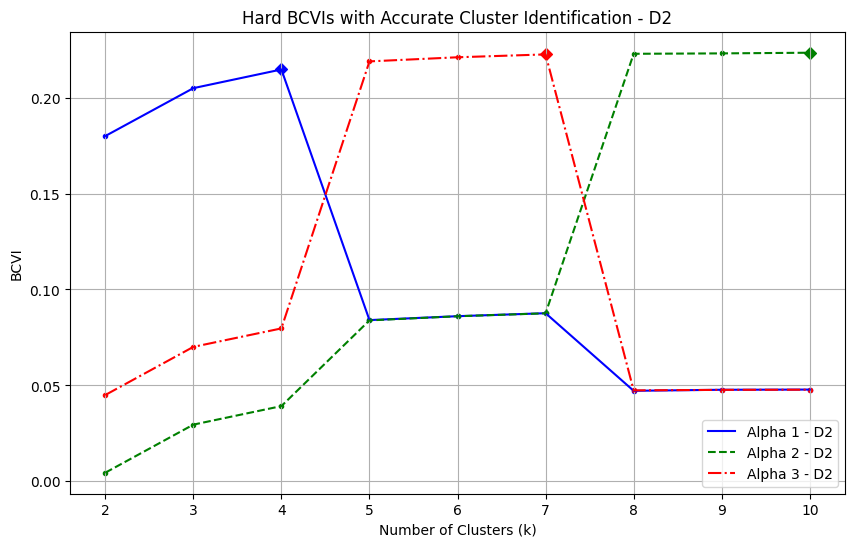

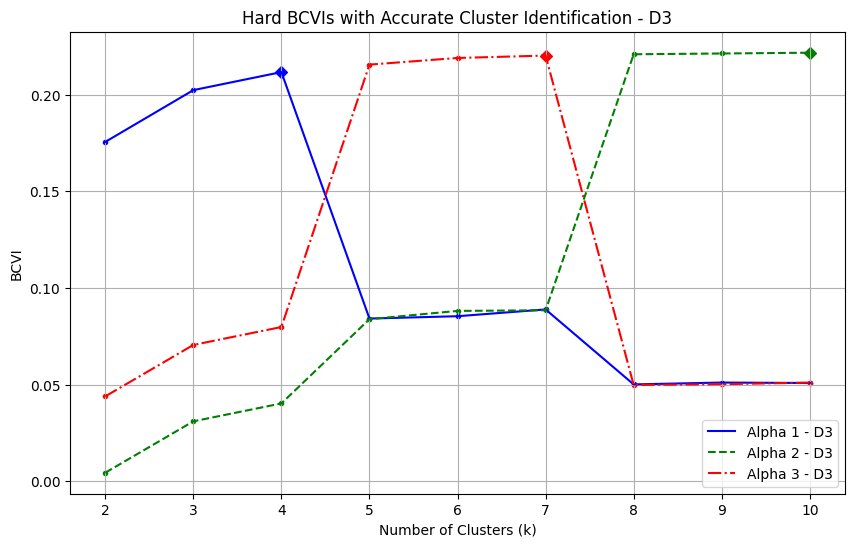

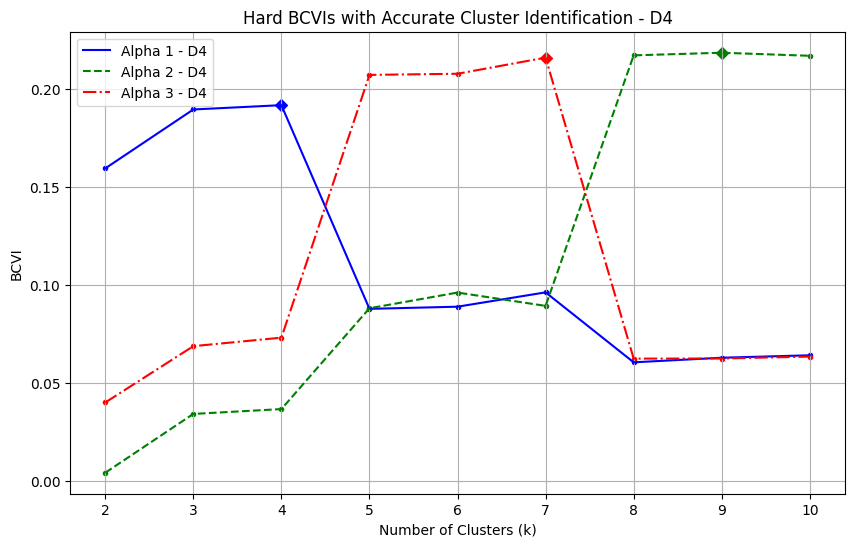

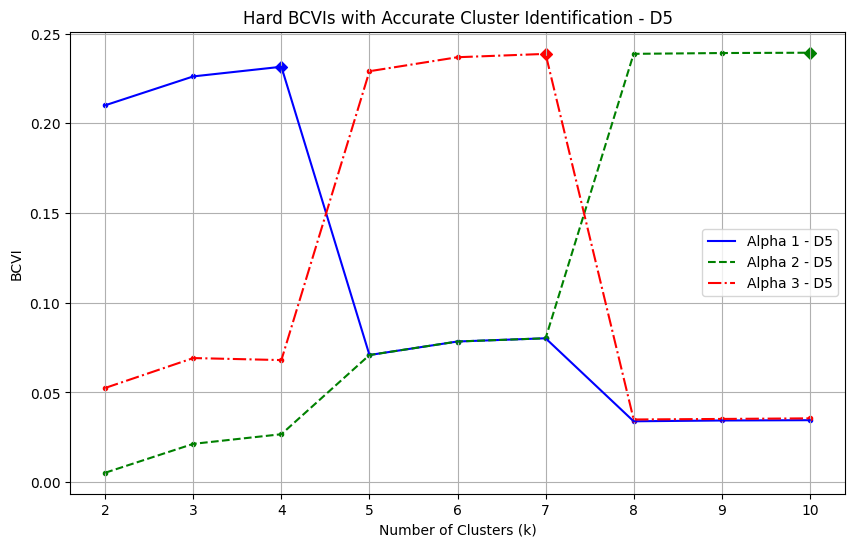

...

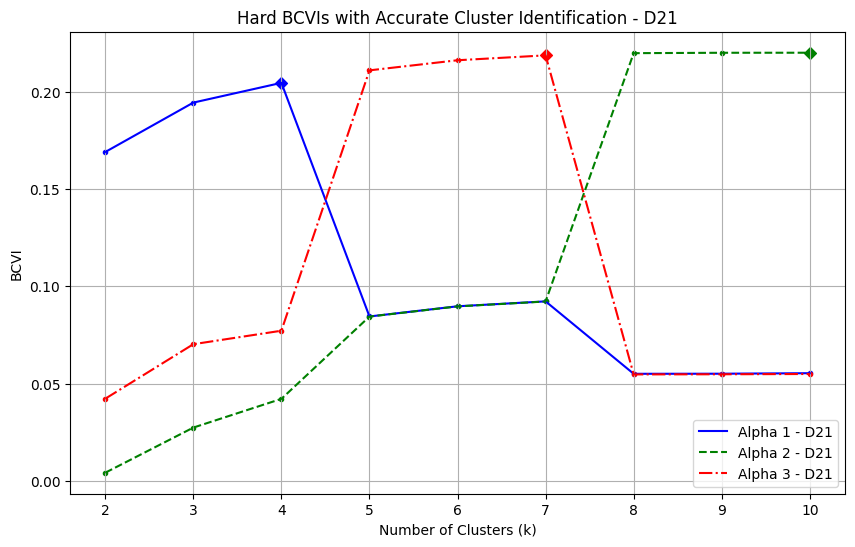

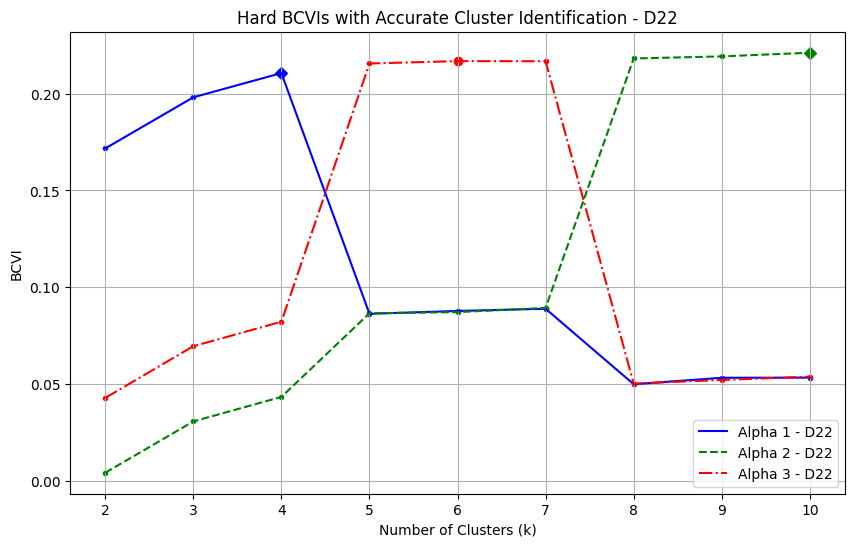

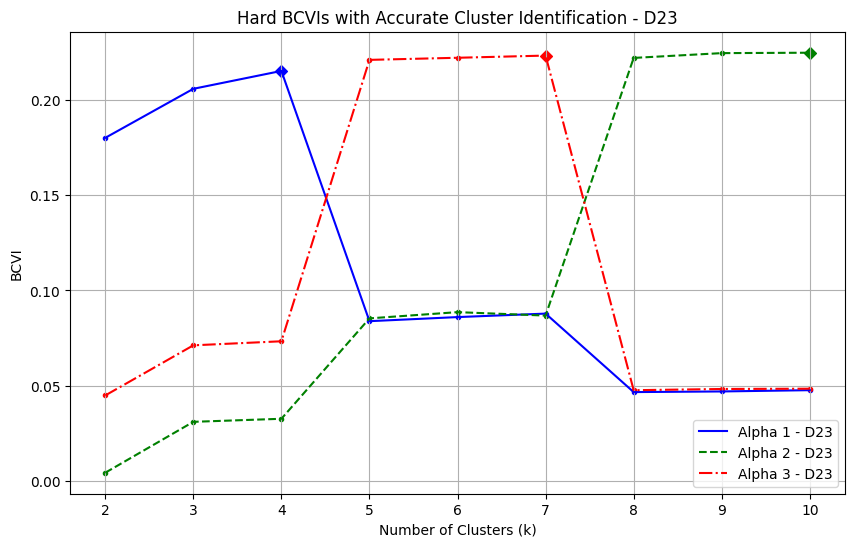

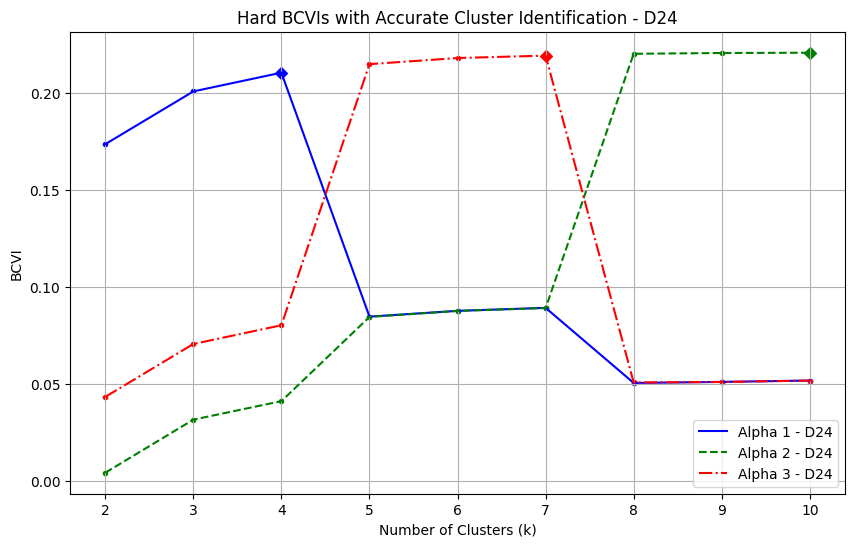

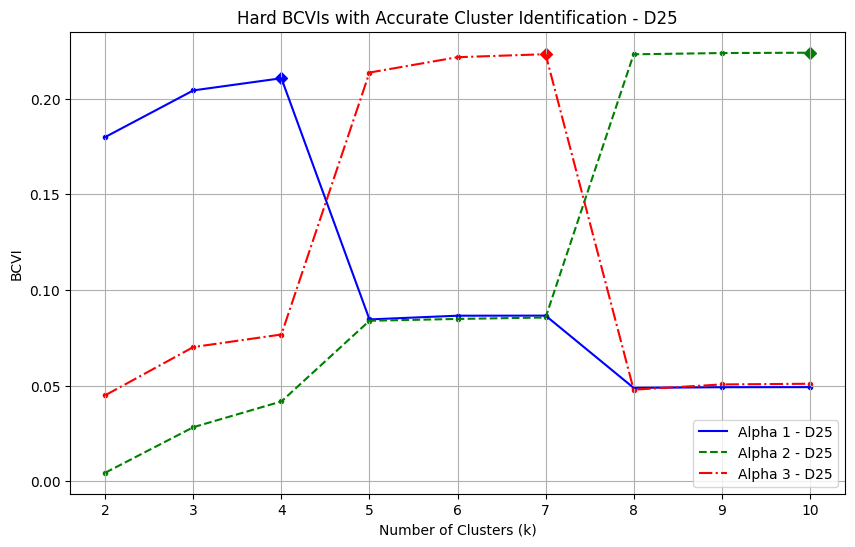

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Thực hiện vòng lặp từ 1 đến 25
for i in range(1, 26):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/AI_Datasets/D{i}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha3["BCVI"].set_index("k", inplace=True)
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Số cụm labels thực tế (true cluster count)
    true_cluster_count = 6  # Thay số này bằng số cụm thực tế

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    plt.figure(figsize=(10, 6))

    # Vẽ các đường BCVI
    plt.plot(BCVIs1.index, BCVIs1["BCVI"], label=f"Alpha 1 - D{i}", color='b', linestyle='-')
    plt.plot(BCVIs2.index, BCVIs2["BCVI"], label=f"Alpha 2 - D{i}", color='g', linestyle='--')
    plt.plot(BCVIs3.index, BCVIs3["BCVI"], label=f"Alpha 3 - D{i}", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        # Alpha 1
        if k == max_k1:  # Nếu k là max đối với Alpha 1
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        else:
            plt.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker='.', label=None)

        # Alpha 2
        if k == max_k2:  # Nếu k là max đối với Alpha 2
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        else:
            plt.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker='.', label=None)

        # Alpha 3
        if k == max_k3:  # Nếu k là max đối với Alpha 3
            if k == true_cluster_count:
                marker = 'o'  # Bullet nếu k trùng với true_cluster_count
            else:
                marker = 'D'  # Diamond nếu không trùng
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)
        else:
            plt.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker='.', label=None)

    # Thêm tiêu đề và nhãn trục
    plt.title(f"Hard BCVIs with Accurate Cluster Identification - D{i}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("BCVI")

    # Hiển thị legend
    plt.legend()

    # Hiển thị lưới
    plt.grid(True)

    # Hiển thị biểu đồ
    plt.show()


#### Case 1

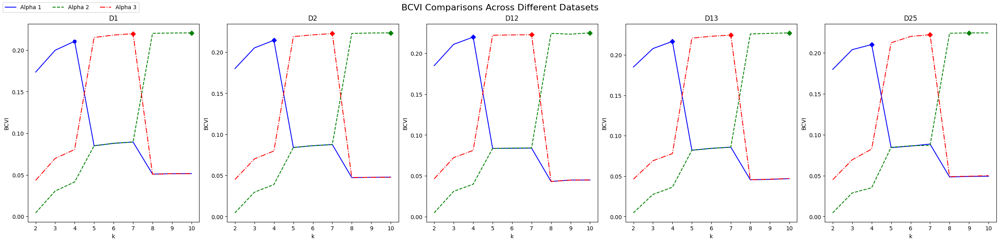

In [77]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)  

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [27]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 1
x_values = [1, 2, 12, 13, 25]
true_cluster_counts = [4, 2, 6, 3, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case1/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D1 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.173566     0.000032     988.009210      0.004339  9.678513e-07   
1   3      0.199750     0.000036     466.796793      0.030428  6.609196e-06   
2   4      0.210692     0.000037     248.990140      0.042912  9.200753e-06   
3   5      0.085035     0.000017     159.043577      0.084754  1.737770e-05   
4   6      0.087944     0.000018     101.153225      0.087667  1.791772e-05   
5   7      0.089560     0.000018      68.971402      0.089304  1.821949e-05   
6   8      0.050922     0.000011      60.728600      0.219909  3.843083e-05   
7   9      0.051006     0.000011      59.060700      0.220213  3.846902e-05   
8  10      0.051525     0.000011      48.719949      0.220473  3.850163e-05   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     988.009662      0.043392     0.000009     988.009486  
1     465.437322      0.069544     0.000014     

#### Case 2

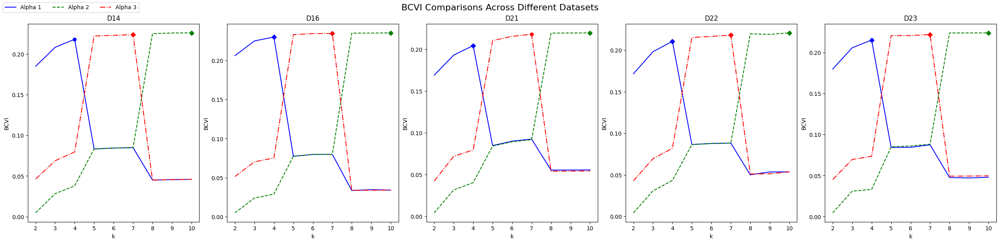

In [76]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [26]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 2
x_values = [14, 16, 21, 22, 23]
true_cluster_counts = [4, 6, 7, 16, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case2/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D14 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.184975     0.000044     670.720403      0.004624     0.000001   
1   3      0.207875     0.000048     313.971770      0.027404     0.000008   
2   4      0.218197     0.000050     153.179870      0.037870     0.000011   
3   5      0.083244     0.000022      94.328228      0.083089     0.000022   
4   6      0.084236     0.000023      78.867054      0.084386     0.000023   
5   7      0.085261     0.000023      62.900447      0.085195     0.000023   
6   8      0.044923     0.000013      42.933753      0.225301     0.000051   
7   9      0.045509     0.000013      33.807145      0.225887     0.000051   
8  10      0.045779     0.000013      29.601756      0.226245     0.000051   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     670.890943      0.046244     0.000013     670.845033  
1     316.165165      0.068558     0.000019     323.58967

#### Case 3

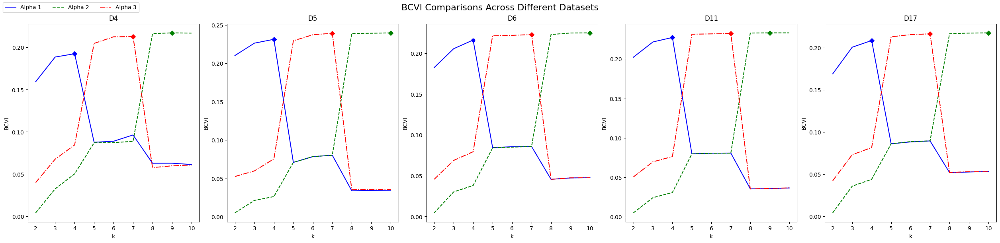

In [75]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [25]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 3
x_values = [4, 5, 6, 11, 17]
true_cluster_counts = [5, 5, 4, 5, 5]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case3/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D4 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.159376     0.000022     924.465963      0.003984  6.454210e-07   
1   3      0.188527     0.000025     491.818870      0.032696  5.143666e-06   
2   4      0.192736     0.000025     429.349391      0.049569  7.662028e-06   
3   5      0.087799     0.000013     212.750142      0.087164  1.294032e-05   
4   6      0.088388     0.000013     204.009874      0.088070  1.306182e-05   
5   7      0.096126     0.000014      89.166122      0.088752  1.315322e-05   
6   8      0.060796     0.000009      81.306055      0.215309  2.747745e-05   
7   9      0.062698     0.000010      53.081967      0.215900  2.753211e-05   
8  10      0.063554     0.000010      40.381560      0.218556  2.777635e-05   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     924.465924      0.039844     0.000006     924.465957  
1     495.598695      0.068835     0.000010     

#### Case 4

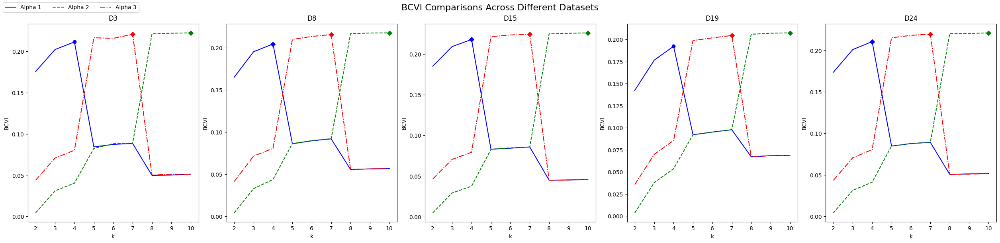

In [74]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [24]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 4
x_values = [3, 8, 15, 19, 24]
true_cluster_counts = [4, 2, 6, 4, 6]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case4/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D3 (True Cluster Count: 4) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.175567     0.000034     890.778400      0.004389     0.000001   
1   3      0.202107     0.000038     406.990935      0.030935     0.000007   
2   4      0.211350     0.000039     238.499703      0.040181     0.000009   
3   5      0.084176     0.000018     156.453997      0.083785     0.000018   
4   6      0.087201     0.000019     101.311435      0.087211     0.000019   
5   7      0.088463     0.000019      78.314816      0.088397     0.000019   
6   8      0.049885     0.000011      61.458980      0.221073     0.000040   
7   9      0.050055     0.000011      58.363089      0.221792     0.000040   
8  10      0.051197     0.000011      37.540599      0.222238     0.000041   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     890.778224      0.043892     0.000010     890.778416  
1     406.990730      0.070482     0.000015     406.991033

#### Case 5

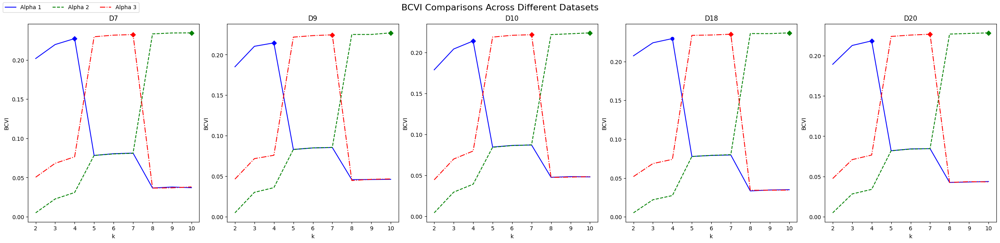

In [73]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Tạo figure với 5 biểu đồ trên một hàng
fig, axes = plt.subplots(1, 5, figsize=(25, 6), constrained_layout=True)

# Lặp qua các chỉ số file và true_cluster_count
for ax, x, true_cluster_count in zip(axes, x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    # Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
    max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
    max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
    max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

    # Vẽ các đường BCVI
    ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
    ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
    ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

    # Đánh dấu các điểm trên biểu đồ
    for k in BCVIs1.index:
        if k == max_k1:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
        if k == max_k2:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
        if k == max_k3:
            marker = 'o' if k == true_cluster_count else 'D'
            ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

    # Thêm tiêu đề và nhãn trục
    ax.set_title(f"D{x}")
    ax.set_xlabel("k")
    ax.set_ylabel("BCVI")

# Thêm chú thích chung
fig.legend(["Alpha 1", "Alpha 2", "Alpha 3"], loc="upper left", ncol=3)
fig.suptitle("BCVI Comparisons Across Different Datasets", fontsize=16)

# Hiển thị biểu đồ
plt.show()


In [23]:
# Danh sách các chỉ số file và true_cluster_count tương ứng Case 5
x_values = [7, 9, 10, 18, 20]
true_cluster_counts = [5, 3, 5, 4, 3]

# Lặp qua các chỉ số file và in bảng dữ liệu
for x, true_cluster_count in zip(x_values, true_cluster_counts):
    path = f"D:/HocTap2425/Seminar/Dataset/BCVI/Case5/D{x}_data.csv"
    df = pd.read_csv(path)
    columns = ["x", "y"]
    data = df[columns].to_numpy()

    # Gọi hàm với alpha tùy chỉnh
    result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_AI)
    result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_AI)
    result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_AI)

    # Chỉnh lại chỉ số k cho BCVI và Var
    result_alpha1["BCVI"].set_index("k", inplace=True)
    result_alpha2["BCVI"].set_index("k", inplace=True)
    result_alpha3["BCVI"].set_index("k", inplace=True)

    result_alpha1["VAR"].set_index("k", inplace=True)
    result_alpha2["VAR"].set_index("k", inplace=True)
    result_alpha3["VAR"].set_index("k", inplace=True)

    result_alpha1["Index"].set_index("k", inplace=True)
    result_alpha2["Index"].set_index("k", inplace=True)
    result_alpha3["Index"].set_index("k", inplace=True)

    BCVIs1 = result_alpha1["BCVI"]
    BCVIs2 = result_alpha2["BCVI"]
    BCVIs3 = result_alpha3["BCVI"]

    Vars1 = result_alpha1["VAR"]
    Vars2 = result_alpha2["VAR"]
    Vars3 = result_alpha3["VAR"]

    Index1 = result_alpha1["Index"]
    Index2 = result_alpha2["Index"]
    Index3 = result_alpha3["Index"]

    # Tạo bảng dữ liệu tổng hợp
    table_data = {
        "k": BCVIs1.index,
        "BCVI Alpha 1": BCVIs1["BCVI"].values,
        "Var Alpha 1": Vars1["Var"].values,
        "Index Alpha 1": Index1["Index"].values,
        "BCVI Alpha 2": BCVIs2["BCVI"].values,
        "Var Alpha 2": Vars2["Var"].values,
        "Index Alpha 2": Index2["Index"].values,
        "BCVI Alpha 3": BCVIs3["BCVI"].values,
        "Var Alpha 3": Vars3["Var"].values,
        "Index Alpha 3": Index3["Index"].values,
    }
    table_df = pd.DataFrame(table_data)

    # In bảng dữ liệu
    print(f"===== D{x} (True Cluster Count: {true_cluster_count}) =====")
    print(table_df)
    print("\n")


===== D7 (True Cluster Count: 5) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.201761     0.000072     333.484361      0.005044     0.000002   
1   3      0.219506     0.000076     162.269953      0.022850     0.000010   
2   4      0.227068     0.000078      89.301863      0.030438     0.000013   
3   5      0.079022     0.000032      57.707882      0.078608     0.000032   
4   6      0.080262     0.000033      45.747194      0.080364     0.000033   
5   7      0.080977     0.000033      38.845476      0.081116     0.000033   
6   8      0.036422     0.000016      30.732359      0.232824     0.000080   
7   9      0.037868     0.000016      16.778867      0.234566     0.000080   
8  10      0.037114     0.000016      24.052796      0.234189     0.000080   

   Index Alpha 2  BCVI Alpha 3  Var Alpha 3  Index Alpha 3  
0     333.484313      0.050440     0.000021     333.484246  
1     162.269388      0.068243     0.000028     162.269415

# Real_World Dataset

In [3]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from fcmeans import FCM
from scipy.optimize import linear_sum_assignment
from scipy.io import arff

# Đọc dữ liệu từ file ARFF
path = r"D:\HocTap2425\Seminar\Dataset\Real-world\dry+bean+dataset\DryBeanDataset\Dry_Bean_Dataset.arff"
data_RW, meta = arff.loadarff(path)
df = pd.DataFrame(data_RW)

# Chuẩn hóa dữ liệu
features = df.drop('Class', axis=1)  # Bỏ cột mục tiêu
labels_true = df['Class'].apply(lambda x: x.decode('utf-8'))  # Nhãn thực tế
labels_true_unique = labels_true.unique()
labels_true = labels_true.map({label: idx for idx, label in enumerate(labels_true_unique)})  # Mã hóa nhãn
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# K-Means clustering
kmeans = KMeans(n_clusters=len(labels_true_unique), random_state=42)
labels_kmeans = kmeans.fit_predict(features_scaled)

# Fuzzy C-Means clustering
fcm = FCM(n_clusters=len(labels_true_unique), random_state=42)
fcm.fit(features_scaled)
labels_fcm = fcm.u.argmax(axis=1)  # Chuyển nhãn mềm thành nhãn cứng

# Hàm ánh xạ nhãn bằng Hungarian Algorithm
def map_labels(true_labels, pred_labels):
    contingency_matrix = pd.crosstab(true_labels, pred_labels)  # Ma trận đếm
    row_ind, col_ind = linear_sum_assignment(-contingency_matrix.values)  # Hungarian Algorithm
    mapping = {col_ind[i]: row_ind[i] for i in range(len(row_ind))}
    mapped_labels = [mapping[label] for label in pred_labels]
    return mapped_labels

# Ánh xạ và tính accuracy
mapped_labels_kmeans = map_labels(labels_true, labels_kmeans)
mapped_labels_fcm = map_labels(labels_true, labels_fcm)

accuracy_kmeans = accuracy_score(labels_true, mapped_labels_kmeans)
accuracy_fcm = accuracy_score(labels_true, mapped_labels_fcm)

print(f"K-Means Accuracy: {accuracy_kmeans:.4f}")
print(f"Fuzzy C-Means Accuracy: {accuracy_fcm:.4f}")


K-Means Accuracy: 0.7865
Fuzzy C-Means Accuracy: 0.8517


In [122]:
data.shape

(13611, 16)

# Index Real-World

## Hard clustering

### CH Index

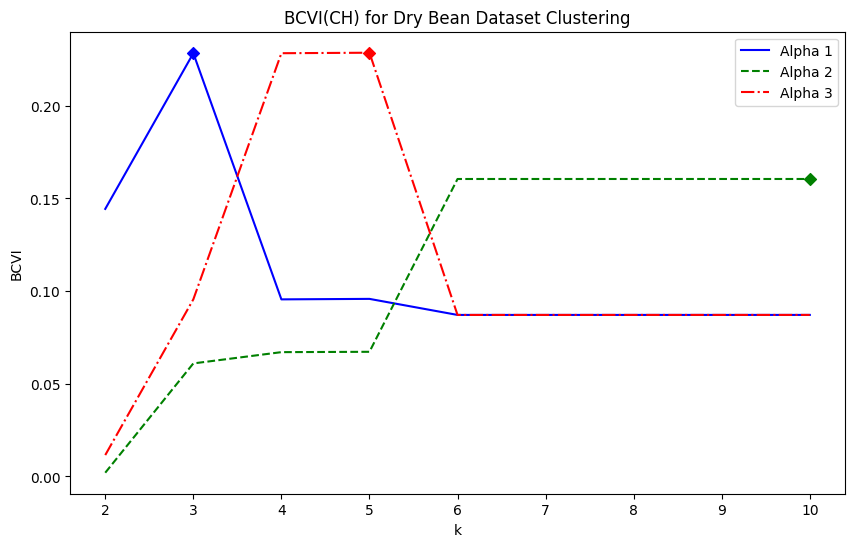

In [35]:
# Chọn các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Tạo figure với 1 biểu đồ (vì chỉ có một tập dữ liệu)
fig, ax = plt.subplots(figsize=(10, 6))

# Tính BCVI cho mỗi cụm
result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_RW)  # Thay alpha tương ứng
result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

# Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

# Vẽ các đường BCVI
ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

# Đánh dấu các điểm trên biểu đồ
for k in BCVIs1.index:
    if k == max_k1:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
    if k == max_k2:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
    if k == max_k3:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

# Thêm tiêu đề và nhãn trục
ax.set_title("BCVI(CH) for Dry Bean Dataset Clustering")
ax.set_xlabel("k")
ax.set_ylabel("BCVI")

# Thêm chú thích
ax.legend()

# Hiển thị biểu đồ
plt.show()

In [36]:
# Các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Gọi hàm với alpha tùy chỉnh
result_alpha1 = B_CH_IDX(data=data, kmax=10, alpha=alpha1_AI)
result_alpha2 = B_CH_IDX(data=data, kmax=10, alpha=alpha2_AI)
result_alpha3 = B_CH_IDX(data=data, kmax=10, alpha=alpha3_AI)

# Chỉnh lại chỉ số k cho BCVI, Variance và CH_Index
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

result_alpha1["VarBCVI"].set_index("k", inplace=True)
result_alpha2["VarBCVI"].set_index("k", inplace=True)
result_alpha3["VarBCVI"].set_index("k", inplace=True)

result_alpha1["CH_Index"].set_index("k", inplace=True)
result_alpha2["CH_Index"].set_index("k", inplace=True)
result_alpha3["CH_Index"].set_index("k", inplace=True)

# Lấy dữ liệu từ từng phần
BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

Vars1 = result_alpha1["VarBCVI"]
Vars2 = result_alpha2["VarBCVI"]
Vars3 = result_alpha3["VarBCVI"]

CHs1 = result_alpha1["CH_Index"]
CHs2 = result_alpha2["CH_Index"]
CHs3 = result_alpha3["CH_Index"]

# Tạo bảng dữ liệu tổng hợp
table_data = {
    "k": BCVIs1.index,
    "BCVI Alpha 1": BCVIs1["BCVI"].values,
    "Variance Alpha 1": Vars1["Variance"].values,
    "CH Index Alpha 1": CHs1["CH_Index"].values,
    "BCVI Alpha 2": BCVIs2["BCVI"].values,
    "Variance Alpha 2": Vars2["Variance"].values,
    "CH Index Alpha 2": CHs2["CH_Index"].values,
    "BCVI Alpha 3": BCVIs3["BCVI"].values,
    "Variance Alpha 3": Vars3["Variance"].values,
    "CH Index Alpha 3": CHs3["CH_Index"].values,
}
table_df = pd.DataFrame(table_data)

# In bảng dữ liệu
print("===== Dry Bean Dataset (True Cluster Count: 7) =====")
print(table_df)
print("\n")


===== Dry Bean Dataset (True Cluster Count: 7) =====
    k  BCVI Alpha 1  Variance Alpha 1  CH Index Alpha 1  BCVI Alpha 2  \
0   2      0.103538          0.000004      51575.845343      0.002588   
1   3      0.178853          0.000007     140555.834781      0.077903   
2   4      0.178854          0.000007     140557.369664      0.077905   
3   5      0.101437          0.000004     140836.941751      0.101437   
4   6      0.101438          0.000004     140837.927017      0.101438   
5   7      0.101440          0.000004     140839.474895      0.101440   
6   8      0.078145          0.000003     140841.648424      0.179095   
7   9      0.078147          0.000003     140843.345012      0.179096   
8  10      0.078148          0.000003     140844.891129      0.179097   

   Variance Alpha 2  CH Index Alpha 2  BCVI Alpha 3  Variance Alpha 3  \
0      1.145560e-07      51575.845343      0.025884          0.000001   
1      3.187408e-06     140555.834781      0.101199          0.000004 

### SH Index

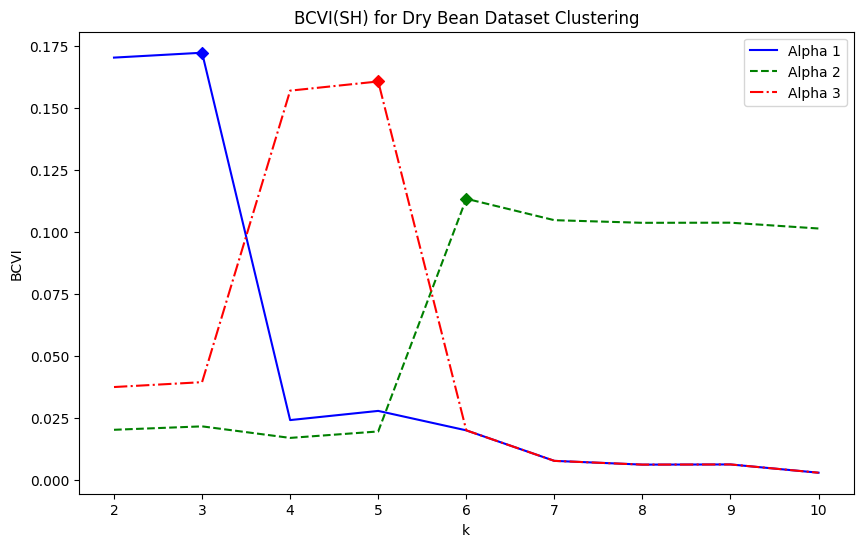

In [37]:
# Chọn các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Tạo figure với 1 biểu đồ (vì chỉ có một tập dữ liệu)
fig, ax = plt.subplots(figsize=(10, 6))

# Tính BCVI cho mỗi cụm
result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_RW)  # Thay alpha tương ứng
result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

# Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

# Vẽ các đường BCVI
ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

# Đánh dấu các điểm trên biểu đồ
for k in BCVIs1.index:
    if k == max_k1:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
    if k == max_k2:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
    if k == max_k3:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

# Thêm tiêu đề và nhãn trục
ax.set_title("BCVI(SH) for Dry Bean Dataset Clustering")
ax.set_xlabel("k")
ax.set_ylabel("BCVI")

# Thêm chú thích
ax.legend()

# Hiển thị biểu đồ
plt.show()

In [38]:
# Các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Gọi hàm với alpha tùy chỉnh
result_alpha1 = B_SH_INDEX(data=data, kmax=10, alpha=alpha1_RW)
result_alpha2 = B_SH_INDEX(data=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_SH_INDEX(data=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI, VAR và Index
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

result_alpha1["VAR"].set_index("k", inplace=True)
result_alpha2["VAR"].set_index("k", inplace=True)
result_alpha3["VAR"].set_index("k", inplace=True)

result_alpha1["Index"].set_index("k", inplace=True)
result_alpha2["Index"].set_index("k", inplace=True)
result_alpha3["Index"].set_index("k", inplace=True)

# Lấy dữ liệu từ từng phần
BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

Vars1 = result_alpha1["VAR"]
Vars2 = result_alpha2["VAR"]
Vars3 = result_alpha3["VAR"]

Index1 = result_alpha1["Index"]
Index2 = result_alpha2["Index"]
Index3 = result_alpha3["Index"]

# Tạo bảng dữ liệu tổng hợp
table_data = {
    "k": BCVIs1.index,
    "BCVI Alpha 1": BCVIs1["BCVI"].values,
    "Var Alpha 1": Vars1["Var"].values,
    "Index Alpha 1": Index1["SH"].values, 
    "BCVI Alpha 2": BCVIs2["BCVI"].values,
    "Var Alpha 2": Vars2["Var"].values,
    "Index Alpha 2": Index2["SH"].values,  
    "BCVI Alpha 3": BCVIs3["BCVI"].values,
    "Var Alpha 3": Vars3["Var"].values,
    "Index Alpha 3": Index3["SH"].values,
}
table_df = pd.DataFrame(table_data)

# In bảng dữ liệu
print("===== Dry Bean Dataset (True Cluster Count: 7) =====")
print(table_df)
print("\n")

===== Dry Bean Dataset (True Cluster Count: 7) =====
    k  BCVI Alpha 1   Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.170253  6.992153e-06       0.396745      0.020198  6.876524e-07   
1   3      0.172222  7.056221e-06       0.404862      0.021580  7.336681e-07   
2   4      0.024110  1.164567e-06       0.341811      0.016926  5.781801e-07   
3   5      0.027811  1.338261e-06       0.357073      0.019524  6.651819e-07   
4   6      0.019970  9.686805e-07       0.360457      0.113344  3.492071e-06   
5   7      0.007666  3.765336e-07       0.309726      0.104706  3.257382e-06   
6   8      0.006156  3.028334e-07       0.303500      0.103646  3.228224e-06   
7   9      0.006227  3.062735e-07       0.303790      0.103696  3.229585e-06   
8  10      0.002887  1.425022e-07       0.290021      0.101352  3.164831e-06   

   Index Alpha 2  BCVI Alpha 3   Var Alpha 3  Index Alpha 3  
0       0.396745      0.037433  1.783414e-06       0.396745  
1       0.404862      

### WI Index

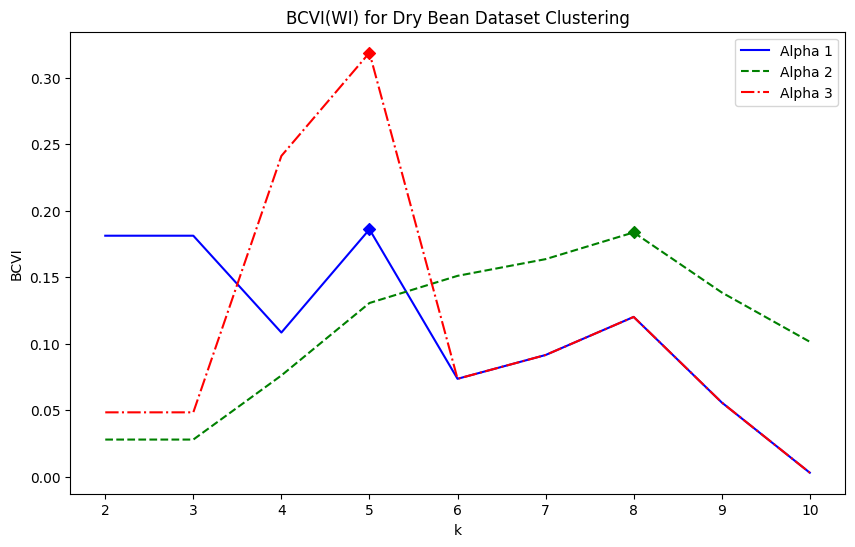

In [39]:
# Chọn các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Tạo figure với 1 biểu đồ (vì chỉ có một tập dữ liệu)
fig, ax = plt.subplots(figsize=(10, 6))

# Tính BCVI cho mỗi cụm
result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_RW)  # Thay alpha tương ứng
result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

# Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

# Vẽ các đường BCVI
ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

# Đánh dấu các điểm trên biểu đồ
for k in BCVIs1.index:
    if k == max_k1:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
    if k == max_k2:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
    if k == max_k3:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

# Thêm tiêu đề và nhãn trục
ax.set_title("BCVI(WI) for Dry Bean Dataset Clustering")
ax.set_xlabel("k")
ax.set_ylabel("BCVI")

# Thêm chú thích
ax.legend()

# Hiển thị biểu đồ
plt.show()

In [40]:
# Các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Gọi hàm với alpha tùy chỉnh
result_alpha1 = B_WI_IDX(x=data, kmax=10, alpha=alpha1_RW)
result_alpha2 = B_WI_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_WI_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI, VAR, và WI
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

result_alpha1["VAR"].set_index("k", inplace=True)
result_alpha2["VAR"].set_index("k", inplace=True)
result_alpha3["VAR"].set_index("k", inplace=True)

result_alpha1["WI"].set_index("k", inplace=True)
result_alpha2["WI"].set_index("k", inplace=True)
result_alpha3["WI"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

Vars1 = result_alpha1["VAR"]
Vars2 = result_alpha2["VAR"]
Vars3 = result_alpha3["VAR"]

WI1 = result_alpha1["WI"]
WI2 = result_alpha2["WI"]
WI3 = result_alpha3["WI"]

# Tạo bảng dữ liệu tổng hợp
table_data = {
    "k": BCVIs1.index,
    "BCVI Alpha 1": BCVIs1["BCVI"].values,
    "Var Alpha 1": Vars1["Var"].values,
    "WI Alpha 1": WI1["WI"].values,
    "BCVI Alpha 2": BCVIs2["BCVI"].values,
    "Var Alpha 2": Vars2["Var"].values,
    "WI Alpha 2": WI2["WI"].values,
    "BCVI Alpha 3": BCVIs3["BCVI"].values,
    "Var Alpha 3": Vars3["Var"].values,
    "WI Alpha 3": WI3["WI"].values,
}
table_df = pd.DataFrame(table_data)

# In bảng dữ liệu
print("===== Dry Bean Dataset (True Cluster Count: 7) =====")
print(table_df)
print("\n")

===== Dry Bean Dataset (True Cluster Count: 7) =====
    k  BCVI Alpha 1   Var Alpha 1  WI Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.181114  7.340843e-06    0.000000      0.027822  9.398738e-07   
1   3      0.181114  7.340843e-06    0.000000      0.027822  9.398738e-07   
2   4      0.108296  4.779732e-06    0.792283      0.076027  2.440932e-06   
3   5      0.185899  7.490745e-06    1.816964      0.130506  3.942999e-06   
4   6      0.073510  3.370975e-06    0.447334      0.150930  4.452971e-06   
5   7      0.091410  4.110858e-06    0.683695      0.163497  4.752336e-06   
6   8      0.120045  5.228492e-06    1.061803      0.183600  5.208411e-06   
7   9      0.055725  2.604452e-06    0.212498      0.138445  4.144668e-06   
8  10      0.002887  1.425022e-07   -0.485176      0.101352  3.164831e-06   

   WI Alpha 2  BCVI Alpha 3   Var Alpha 3  WI Alpha 3  
0    0.000000      0.048294  2.274906e-06    0.000000  
1    0.000000      0.048294  2.274906e-06    0.000000  
2    0.7

### DB Index

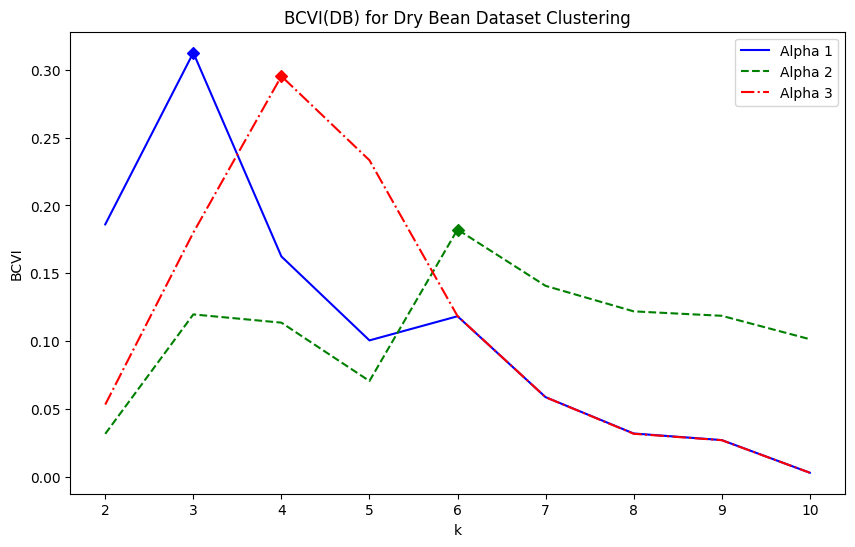

In [41]:
# Chọn các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Tạo figure với 1 biểu đồ (vì chỉ có một tập dữ liệu)
fig, ax = plt.subplots(figsize=(10, 6))

# Tính BCVI cho mỗi cụm
result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_RW)  # Thay alpha tương ứng
result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

# Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

# Vẽ các đường BCVI
ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

# Đánh dấu các điểm trên biểu đồ
for k in BCVIs1.index:
    if k == max_k1:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
    if k == max_k2:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
    if k == max_k3:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

# Thêm tiêu đề và nhãn trục
ax.set_title("BCVI(DB) for Dry Bean Dataset Clustering")
ax.set_xlabel("k")
ax.set_ylabel("BCVI")

# Thêm chú thích
ax.legend()

# Hiển thị biểu đồ
plt.show()

In [42]:
# Các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Gọi hàm với alpha tùy chỉnh
result_alpha1 = B_DB_IDX(x=data, kmax=10, alpha=alpha1_RW)
result_alpha2 = B_DB_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_DB_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI và Var
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

result_alpha1["VarBCVI"].set_index("k", inplace=True)
result_alpha2["VarBCVI"].set_index("k", inplace=True)
result_alpha3["VarBCVI"].set_index("k", inplace=True)

result_alpha1["Index"].set_index("k", inplace=True)
result_alpha2["Index"].set_index("k", inplace=True)
result_alpha3["Index"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

Vars1 = result_alpha1["VarBCVI"]
Vars2 = result_alpha2["VarBCVI"]
Vars3 = result_alpha3["VarBCVI"]

Index1 = result_alpha1["Index"]
Index2 = result_alpha2["Index"]
Index3 = result_alpha3["Index"]

# Tạo bảng dữ liệu tổng hợp
table_data = {
    "k": BCVIs1.index,
    "BCVI Alpha 1": BCVIs1["BCVI"].values,
    "Var Alpha 1": Vars1["Var"].values,
    "Index Alpha 1": Index1["Index"].values,
    "BCVI Alpha 2": BCVIs2["BCVI"].values,
    "Var Alpha 2": Vars2["Var"].values,
    "Index Alpha 2": Index2["Index"].values,
    "BCVI Alpha 3": BCVIs3["BCVI"].values,
    "Var Alpha 3": Vars3["Var"].values,
    "Index Alpha 3": Index3["Index"].values,
}
table_df = pd.DataFrame(table_data)

# In bảng dữ liệu
print("===== Dry Bean Dataset (True Cluster Count: 7) =====")
print(table_df)
print("\n")

===== Dry Bean Dataset (True Cluster Count: 7) =====
    k  BCVI Alpha 1   Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.185961  7.492673e-06       1.212684      0.031276     0.000001   
1   3      0.312813  1.063972e-05       0.968557      0.120166     0.000004   
2   4      0.162565  6.738283e-06       1.002096      0.113972     0.000004   
3   5      0.100520  4.475217e-06       1.121502      0.070527     0.000002   
4   6      0.118420  5.167222e-06       1.070383      0.182438     0.000005   
5   7      0.058520  2.726994e-06       1.185661      0.140487     0.000004   
6   8      0.031405  1.505595e-06       1.237843      0.121539     0.000004   
7   9      0.026909  1.296049e-06       1.246495      0.118244     0.000004   
8  10      0.002887  1.425022e-07       1.292725      0.101352     0.000003   

   Index Alpha 2  BCVI Alpha 3   Var Alpha 3  Index Alpha 3  
0       1.212586      0.053126  2.489810e-06       1.212684  
1       0.968495      0.180037  

## Soft clustering 

### KWON2 Index

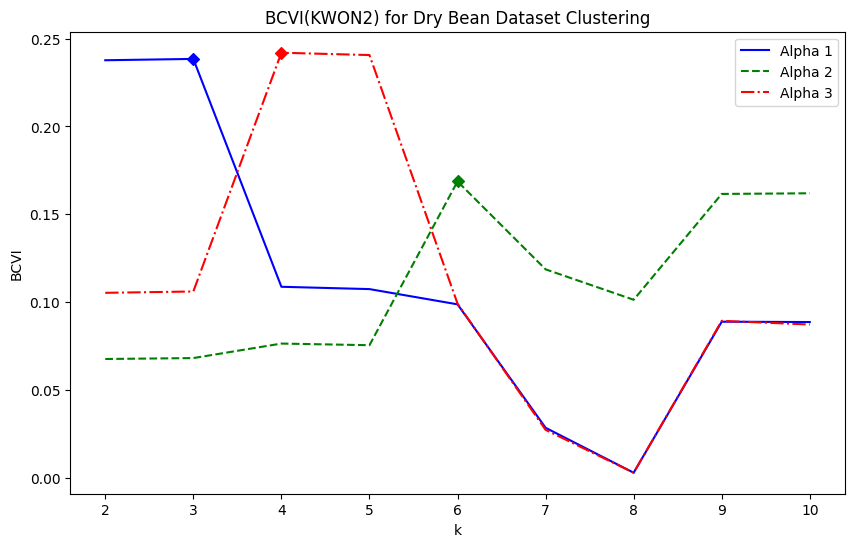

In [111]:
# Chọn các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Tạo figure với 1 biểu đồ (vì chỉ có một tập dữ liệu)
fig, ax = plt.subplots(figsize=(10, 6))

# Tính BCVI cho mỗi cụm
result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_RW)  # Thay alpha tương ứng
result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

# Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

# Vẽ các đường BCVI
ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

# Đánh dấu các điểm trên biểu đồ
for k in BCVIs1.index:
    if k == max_k1:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
    if k == max_k2:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
    if k == max_k3:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

# Thêm tiêu đề và nhãn trục
ax.set_title("BCVI(KWON2) for Dry Bean Dataset Clustering")
ax.set_xlabel("k")
ax.set_ylabel("BCVI")

# Thêm chú thích
ax.legend()

# Hiển thị biểu đồ
plt.show()

In [114]:
# Các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Gọi hàm với alpha tùy chỉnh
result_alpha1 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha1_RW)
result_alpha2 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_KWON2_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI, Var, và Index
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

result_alpha1["VAR"].set_index("k", inplace=True)
result_alpha2["VAR"].set_index("k", inplace=True)
result_alpha3["VAR"].set_index("k", inplace=True)

result_alpha1["Index"].set_index("k", inplace=True)
result_alpha2["Index"].set_index("k", inplace=True)
result_alpha3["Index"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

Vars1 = result_alpha1["VAR"]
Vars2 = result_alpha2["VAR"]
Vars3 = result_alpha3["VAR"]

Index1 = result_alpha1["Index"]["KWON2"]
Index2 = result_alpha2["Index"]["KWON2"]
Index3 = result_alpha3["Index"]["KWON2"]

# Tạo bảng dữ liệu tổng hợp
table_data = {
    "k": BCVIs1.index,
    "BCVI Alpha 1": BCVIs1["BCVI"].values,
    "Var Alpha 1": Vars1["Var"].values,
    "Index Alpha 1": Index1.values,
    "BCVI Alpha 2": BCVIs2["BCVI"].values,
    "Var Alpha 2": Vars2["Var"].values,
    "Index Alpha 2": Index2.values,
    "BCVI Alpha 3": BCVIs3["BCVI"].values,
    "Var Alpha 3": Vars3["Var"].values,
    "Index Alpha 3": Index3.values,
}

table_df = pd.DataFrame(table_data)

# In bảng dữ liệu
print("===== Dry Bean Dataset (True Cluster Count: 7) =====")
print(table_df)
print("\n")


===== Dry Bean Dataset (True Cluster Count: 7) =====
    k  BCVI Alpha 1   Var Alpha 1  Index Alpha 1  BCVI Alpha 2  Var Alpha 2  \
0   2      0.238083  8.978555e-06   11056.977957      0.068053     0.000002   
1   3      0.238844  8.998267e-06   10406.551974      0.068589     0.000002   
2   4      0.109131  4.812058e-06    7752.675732      0.076859     0.000002   
3   5      0.107802  4.760563e-06    8887.658028      0.075923     0.000002   
4   6      0.099125  4.419973e-06    8899.951238      0.169157     0.000005   
5   7      0.024959  1.204522e-06   72258.944822      0.115536     0.000004   
6   8      0.002887  1.425022e-07   91113.940380      0.101352     0.000003   
7   9      0.089430  4.030582e-06   17182.335489      0.161908     0.000005   
8  10      0.089738  4.043107e-06   16918.981886      0.162623     0.000005   

   Index Alpha 2  BCVI Alpha 3   Var Alpha 3  Index Alpha 3  
0   11056.977954      0.105264  4.661727e-06   11056.977955  
1   10406.991973      0.106026  

### WP Index 

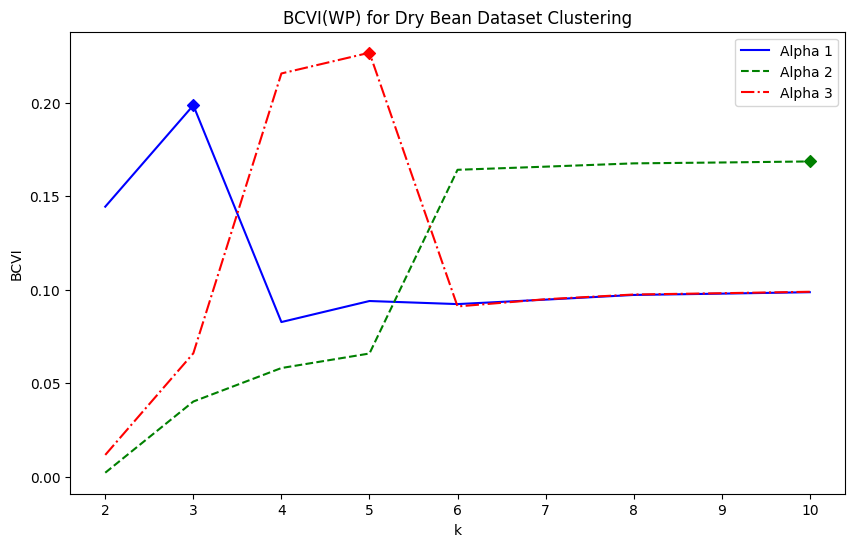

In [109]:
# Chọn các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Tạo figure với 1 biểu đồ (vì chỉ có một tập dữ liệu)
fig, ax = plt.subplots(figsize=(10, 6))

# Tính BCVI cho mỗi cụm
result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_RW)  # Thay alpha tương ứng
result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

# Tìm giá trị BCVI tối đa và chỉ số k tương ứng cho mỗi alpha
max_k1, max_bcvi1 = BCVIs1["BCVI"].idxmax(), BCVIs1["BCVI"].max()
max_k2, max_bcvi2 = BCVIs2["BCVI"].idxmax(), BCVIs2["BCVI"].max()
max_k3, max_bcvi3 = BCVIs3["BCVI"].idxmax(), BCVIs3["BCVI"].max()

# Vẽ các đường BCVI
ax.plot(BCVIs1.index, BCVIs1["BCVI"], label="Alpha 1", color='b', linestyle='-')
ax.plot(BCVIs2.index, BCVIs2["BCVI"], label="Alpha 2", color='g', linestyle='--')
ax.plot(BCVIs3.index, BCVIs3["BCVI"], label="Alpha 3", color='r', linestyle='-.')

# Đánh dấu các điểm trên biểu đồ
for k in BCVIs1.index:
    if k == max_k1:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs1.loc[k, "BCVI"], color='blue', marker=marker)
    if k == max_k2:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs2.loc[k, "BCVI"], color='green', marker=marker)
    if k == max_k3:
        marker = 'o' if k == true_cluster_count else 'D'
        ax.scatter(k, BCVIs3.loc[k, "BCVI"], color='red', marker=marker)

# Thêm tiêu đề và nhãn trục
ax.set_title("BCVI(WP) for Dry Bean Dataset Clustering")
ax.set_xlabel("k")
ax.set_ylabel("BCVI")

# Thêm chú thích
ax.legend()

# Hiển thị biểu đồ
plt.show()

In [108]:
# Các đặc trưng (features) để phân cụm, loại bỏ cột 'Class'
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
           'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
           'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']
data = df[columns].to_numpy()

# Số loại đậu = 7 (lấy từ cột 'Class')
true_cluster_count = 7

# Gọi hàm với alpha tùy chỉnh
result_alpha1 = B_WP_IDX(x=data, kmax=10, alpha=alpha1_RW)
result_alpha2 = B_WP_IDX(x=data, kmax=10, alpha=alpha2_RW)
result_alpha3 = B_WP_IDX(x=data, kmax=10, alpha=alpha3_RW)

# Chỉnh lại chỉ số k cho BCVI, Var, và Index
result_alpha1["BCVI"].set_index("k", inplace=True)
result_alpha2["BCVI"].set_index("k", inplace=True)
result_alpha3["BCVI"].set_index("k", inplace=True)

result_alpha1["VAR"].set_index("k", inplace=True)
result_alpha2["VAR"].set_index("k", inplace=True)
result_alpha3["VAR"].set_index("k", inplace=True)

result_alpha1["Index"].set_index("k", inplace=True)
result_alpha2["Index"].set_index("k", inplace=True)
result_alpha3["Index"].set_index("k", inplace=True)

BCVIs1 = result_alpha1["BCVI"]
BCVIs2 = result_alpha2["BCVI"]
BCVIs3 = result_alpha3["BCVI"]

Vars1 = result_alpha1["VAR"]
Vars2 = result_alpha2["VAR"]
Vars3 = result_alpha3["VAR"]

Index1 = result_alpha1["Index"]
Index2 = result_alpha2["Index"]
Index3 = result_alpha3["Index"]

# Tạo bảng dữ liệu tổng hợp
table_data = {
    "k": BCVIs1.index,
    "BCVI Alpha 1": BCVIs1["BCVI"].values,
    "Var Alpha 1": Vars1["Var"].values,
    "Index Alpha 1": Index1["Index"].values,
    "BCVI Alpha 2": BCVIs2["BCVI"].values,
    "Var Alpha 2": Vars2["Var"].values,
    "Index Alpha 2": Index2["Index"].values,
    "BCVI Alpha 3": BCVIs3["BCVI"].values,
    "Var Alpha 3": Vars3["Var"].values,
    "Index Alpha 3": Index3["Index"].values,
}

table_df = pd.DataFrame(table_data)

# In bảng dữ liệu
print("===== Dry Bean Dataset (True Cluster Count: 7) =====")
print(table_df)
print("\n")


===== Dry Bean Dataset (True Cluster Count: 7) =====
    k  BCVI Alpha 1  Var Alpha 1  Index Alpha 1  BCVI Alpha 2   Var Alpha 2  \
0   2      0.144370     0.000006   25355.568858      0.002027  7.029257e-08   
1   3      0.198612     0.000008   11810.448128      0.040230  1.341668e-06   
2   4      0.082655     0.000004    7599.290032      0.058190  1.904315e-06   
3   5      0.093729     0.000004    4833.926162      0.064475  2.095931e-06   
4   6      0.092255     0.000004    3038.831251      0.164296  4.770996e-06   
5   7      0.094647     0.000004    2441.430292      0.165981  4.810209e-06   
6   8      0.097153     0.000004    1815.800850      0.167745  4.851061e-06   
7   9      0.097849     0.000004    1641.886859      0.168215  4.861911e-06   
8  10      0.098730     0.000004    1421.839130      0.168842  4.876334e-06   

   Index Alpha 2  BCVI Alpha 3   Var Alpha 3  Index Alpha 3  
0   25355.568560      0.011550  5.650569e-07   25355.568401  
1   11810.851391      0.065804  